## Kezdeti elemzések a Shapley csomaggal

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install umap-learn
!pip install shap
!pip install pybind11

     |████████████████████████████████| 88 kB 5.0 MB/s 
     |████████████████████████████████| 1.1 MB 15.9 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=35c35e17d08eb92d43852da8c8c9ddfb81405beb77ad1ac16b8b2c1ecc13def1
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.6-py3-none-any.whl size=53943 sha256=cf7d5f8d8962695bacfd83f7d142bb0d16a4670e64f5843a3aa8dff29b33280b
  Stored in directory: /root/.cache/pip/wheels/03/f1/56/f80d72741e400345b5a5b50ec3d929aca581bf45e0225d5c50
Successfully built umap-learn pynndescent
     |████████████████████████████████| 564 kB 10.5 MB/s 
     |████████████████████████████████| 213 kB 13.2 MB/s 


In [ ]:
!pip install cluster-shapley

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from numpy.linalg import svd

from matplotlib import pyplot as plt
import umap.umap_ as umap
import random

import dr_explainer as dre
import shap

from sklearn.decomposition import PCA

from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering 

In [ ]:
geoname = pd.read_csv('/content/drive/My Drive/tstar/geoname.csv')
geoname['name'] = geoname['name'].astype("string")

dt_colnames_full = ['datatypeid','kshkod' ,'label','measureunit','periodicity','note_hun','referencetime','validity','reference','source','leafornot','parentid','label_hun2007','mtaktid','admin_hun','max','min','avg','conceptid']
dt_colnames_useful = ['datatypeid','kshkod' ,'label']
datatype = pd.read_csv('/content/drive/My Drive/tstar/datatype.csv', names=dt_colnames_full, usecols=dt_colnames_useful)
datatype['kshkod'] = datatype['kshkod'].astype("string")
datatype['label'] = datatype['label'].astype("string")
datatype['kshkod'] = datatype['kshkod'].str.strip()

export_colnames = ['year','value','geonameid','datatypeid']
export = pd.read_csv('/content/drive/My Drive/tstar/export.csv', names=export_colnames) 
export = export.dropna()
export = export.astype({'geonameid': 'int'})

lakossagi_dim = ['TAAA101','TAAQ002','TAAR001','TAAR128','TAAR023','TAAS001','TAAH003','TAAH000','TAAH201','TAAH305','TAAJ425']
datatype_lak = datatype[datatype['kshkod'].isin(lakossagi_dim)]
merge_temp = geoname.merge(export, on='geonameid')
data_lak = merge_temp.merge(datatype_lak, on='datatypeid')

In [ ]:
year=2010

pd.options.mode.chained_assignment = None  # default='warn'
data_lak_clus = data_lak[data_lak.year==year]

data_lak_clus['ind']=list(map(lambda x,y,z,w: (x,y,z,w), data_lak_clus['name'],data_lak_clus['geoid'],data_lak_clus['wgs84_e_szelesseg'],data_lak_clus['wgs84_k_hosszusag'] ))
data_lak_clus = data_lak_clus[['ind', 'value', 'label']]
data_lak_clus = pd.crosstab(data_lak_clus.ind, data_lak_clus.label, values=data_lak_clus.value, aggfunc=lambda x: x)

for i in range(len(data_lak_clus)):
  data_lak_clus.iloc[i]=data_lak_clus.iloc[i]/data_lak_clus.iloc[i]['lakónépesség száma az év végén']

data_lak_clus=data_lak_clus.drop(['lakónépesség száma az év végén'], axis=1)
data_lak_clus=data_lak_clus.fillna(0)

In [ ]:
data_lak_clus.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),háztartásoknak szolgáltatott víz mennyisége,regisztrált munkanélküliek száma összesen,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma
ind,,,,,,,,,
"(Aba, 1512, 47.0343556977497, 18.524754962635)",0.926401,0.360291,0.026744,0.056055,0.226786,0.001926,0.224433,85.215233,0.000428
"(Abaliget, 1035, 46.1438461930372, 18.1181108415909)",1.316781,0.000000,0.034247,0.099315,0.330479,0.006849,0.316781,103.950342,0.003425
"(Abasár, 2209, 47.8006871447644, 20.0083983387857)",1.375349,0.415636,0.032708,0.060630,0.378141,0.013163,0.363781,142.164340,0.001596
"(Abaújalpár, 1341, 48.3061466428872, 21.234096519055)",0.760000,0.186667,0.013333,0.253333,0.280000,0.000000,0.226667,116.533333,0.080000
"(Abaújkér, 2420, 48.3050378371762, 21.2002207816169)",0.862267,0.199426,0.018651,0.114778,0.164993,0.077475,0.160689,32.183644,0.048780


# Lakossági dimenzió

Itt szerepelnek az első iteráció változóival nézett Shapley értékek.

In [ ]:
lak_vars = ['TAAA101', 'TAAB101','TAAQ002','TAAR001','TAAR128', 'TAAR012', 'TAAS001', 'TAAS019', 'TAAS020','TAAS036','TAAT126','TAAT127','TAAH003','TAAH000','TAAH200','TAAH201','TAAH300','TAAH305','TAAJ425']
# 18 darab változó + lakosságszám

In [ ]:
datatype_lak_full = datatype[datatype['kshkod'].isin(lak_vars)]
data_lak_full = merge_temp.merge(datatype_lak_full, on='datatypeid')

In [ ]:
year=2010

pd.options.mode.chained_assignment = None  # default='warn'
data_lak_clus_full = data_lak_full[data_lak_full.year==year]

data_lak_clus_full['ind']=list(map(lambda x,y,z,w: (x,y,z,w), data_lak_clus_full['name'],data_lak_clus_full['geoid'],data_lak_clus_full['wgs84_e_szelesseg'],data_lak_clus_full['wgs84_k_hosszusag'] ))
data_lak_clus_full = data_lak_clus_full[['ind', 'value', 'label']]
data_lak_clus_full = pd.crosstab(data_lak_clus_full.ind, data_lak_clus_full.label, values=data_lak_clus_full.value, aggfunc=lambda x: x)
data_unchanged = data_lak_clus_full.copy()

for i in range(len(data_lak_clus_full)):
  data_lak_clus_full.iloc[i]=data_lak_clus_full.iloc[i]/data_lak_clus_full.iloc[i]['lakónépesség száma az év végén']

data_lak_clus_full=data_lak_clus_full.drop(['lakónépesség száma az év végén'], axis=1)
data_lak_clus_full=data_lak_clus_full.fillna(0)

In [ ]:
features = list(data_lak_clus_full.columns)

### UMAP

In [ ]:
scaler = MinMaxScaler()
data_lak_clus_full_scaled = pd.DataFrame(scaler.fit_transform(data_lak_clus_full), columns=data_lak_clus_full.columns)
data_lak_clus_full_scaled.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma
0,0.192605,0.041720,0.099019,0.057451,0.021377,0.138037,0.046075,0.174621,0.016231,0.115456,0.088036,0.121452,0.097942,0.032171,0.004561,0.226683,0.140529,0.000618
1,0.276320,0.089041,0.000000,0.091960,0.040486,0.000000,0.099665,0.223610,0.000000,0.016969,0.162597,0.215183,0.098431,0.050553,0.016222,0.341548,0.171898,0.004947
2,0.288880,0.057040,0.114230,0.111870,0.027989,0.183524,0.063023,0.213567,0.011653,0.150210,0.075753,0.131366,0.042524,0.059002,0.031176,0.400009,0.235883,0.002305
3,0.156920,0.751111,0.051302,0.477377,0.071186,0.133208,0.104731,0.087059,0.000000,0.000000,0.000000,0.548889,0.125419,0.041604,0.000000,0.229461,0.192967,0.115556
4,0.178851,0.105691,0.054809,0.179787,0.033923,0.089774,0.051462,0.121782,0.000000,0.064627,0.227060,0.248685,0.182941,0.021216,0.183493,0.147396,0.051734,0.070461


In [ ]:
K=5


KMC=KMeans(n_clusters=K)
KMC.fit(data_lak_clus_full_scaled)
data_lak_clus_full_scaled['clusters']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
y = data_lak_clus_full_scaled.iloc[:, 18]

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.


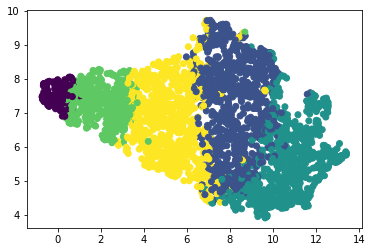

In [ ]:
reducer = umap.UMAP(verbose=0, random_state=0)
embedding = reducer.fit_transform(X)
plt.scatter(embedding[:, 0], embedding[:, 1], c=y)
plt.show()

In [ ]:
X = X.to_numpy()

In [ ]:
# fit the dataset
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

# compute explanations for data subset

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.02)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/63 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

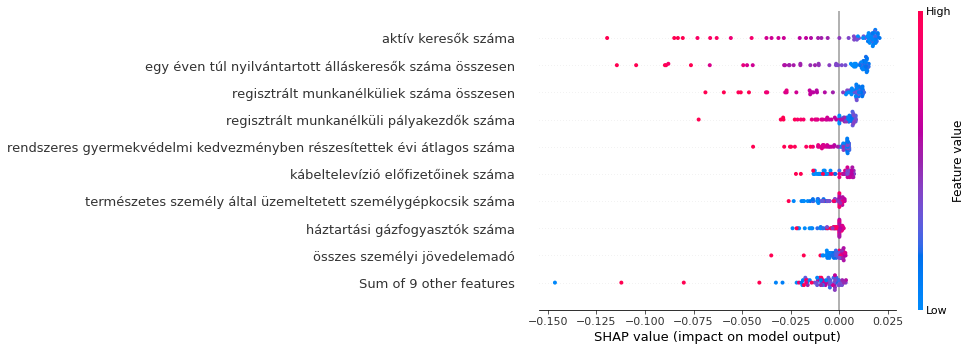

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

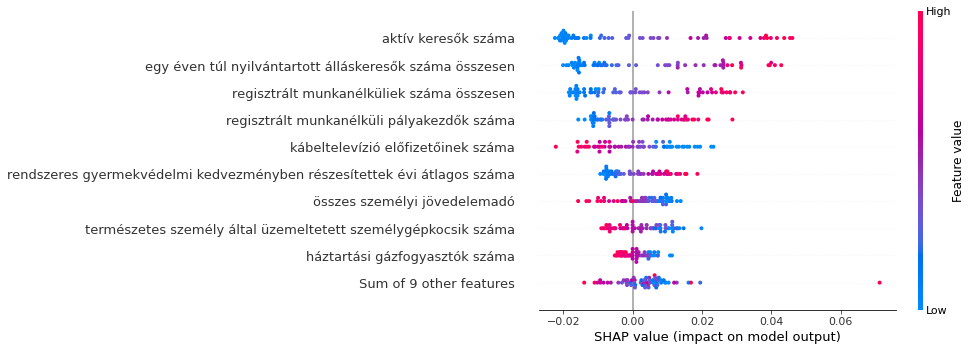

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

## PCA

In [ ]:
scaler = StandardScaler()
data_lak_clus_full_scaled = pd.DataFrame(scaler.fit_transform(data_lak_clus_full), columns=data_lak_clus_full.columns)
data_lak_clus_full_scaled.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma
0,-0.557013,-0.671977,0.534615,-0.728267,-0.517836,0.075687,-0.573154,-0.117560,-0.219405,0.074772,-0.354494,-0.643333,-0.105659,-0.388684,-0.783704,-0.603504,0.112319,-0.414850
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581
2,0.993727,-0.571586,0.844407,-0.341616,-0.353005,0.714537,-0.182442,0.498072,-0.288474,0.435648,-0.457373,-0.560595,-0.746418,0.817221,-0.451231,1.544141,1.305191,-0.372665
3,-1.131790,3.976572,-0.437236,2.255306,0.723757,0.007873,0.779072,-1.501669,-0.464262,-1.124073,-1.091888,2.924066,0.212040,0.035290,-0.840673,-0.569080,0.768317,2.459973
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058


In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.values

### 10 főkomponens

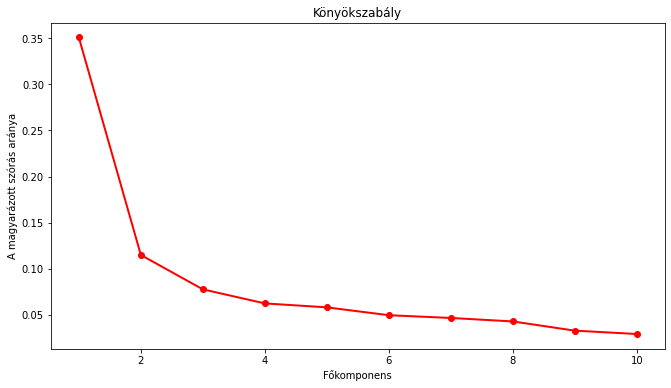

In [ ]:
pca = PCA(n_components=10)
principalComponents=pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.figure(figsize=(11,6))
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Könyökszabály')
plt.xlabel('Főkomponens')
plt.ylabel('A magyarázott szórás aránya')
plt.show()

In [ ]:
out_sum = np.cumsum(pca.explained_variance_ratio_)  
print ("Cumulative Prop. Variance Explained: ", out_sum)

Cumulative Prop. Variance Explained:  [0.35080134 0.46582342 0.54359769 0.60612558 0.66438405 0.71411196
 0.76086347 0.80384448 0.83684192 0.8662009 ]


10 főkomponens, ahol már megvan a 85%-os magyarázott variancia

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])
lak_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.635683,-1.689709,0.113005,0.165725,-0.425211,0.448863,-0.449595,-0.023900,0.053257,0.082162
1,0.239391,0.508631,-1.623223,0.416896,1.750217,-1.007664,-1.251240,-0.152979,0.168037,0.368731
2,2.687530,0.075492,0.484996,0.487451,0.715303,-0.127864,0.222400,0.504970,-0.589145,-0.194370
3,-3.662096,2.330939,0.424474,2.416361,-0.394823,0.365393,-0.463145,0.586687,-0.657342,0.642658
4,-2.417693,-0.277750,-0.608781,-0.642866,-1.911759,-0.585104,0.186332,0.033052,-0.619538,0.407002


#### Silhoutte

In [ ]:
X = lak_pca.iloc[:]

##### K-közép

For n_clusters = 2 The average silhouette_score is : 0.29944806387006184
For n_clusters = 3 The average silhouette_score is : 0.18471727322247866
For n_clusters = 4 The average silhouette_score is : 0.1944537816095739
For n_clusters = 5 The average silhouette_score is : 0.19664118824017884
For n_clusters = 6 The average silhouette_score is : 0.17784363093955466
For n_clusters = 7 The average silhouette_score is : 0.15255838837531313
For n_clusters = 8 The average silhouette_score is : 0.14093150586059272
For n_clusters = 9 The average silhouette_score is : 0.13940327157017016
For n_clusters = 10 The average silhouette_score is : 0.14375710303833847


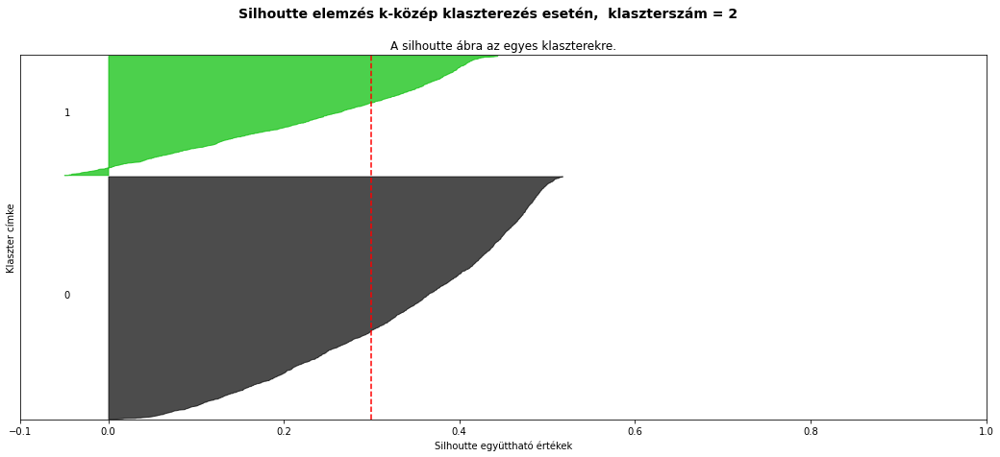

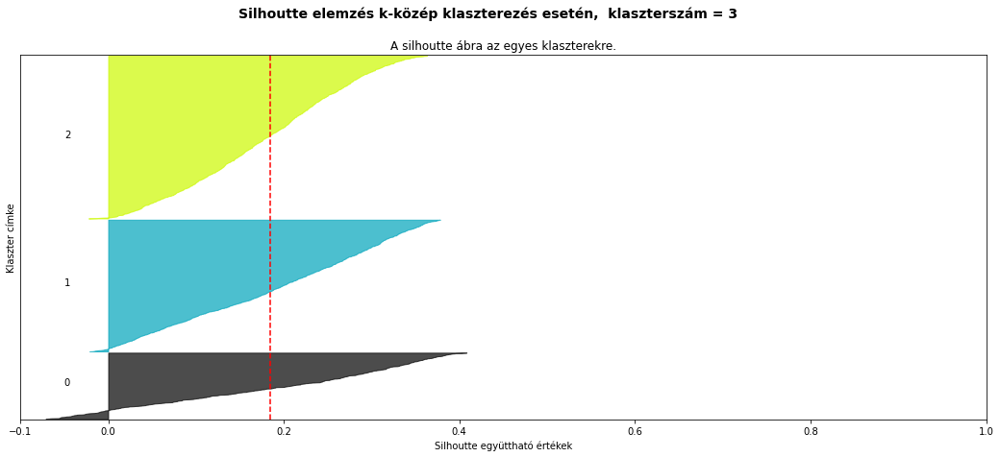

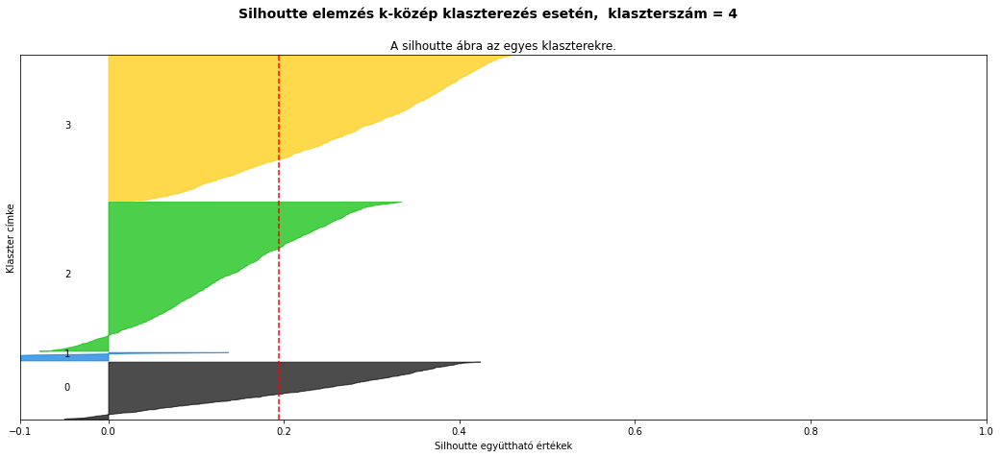

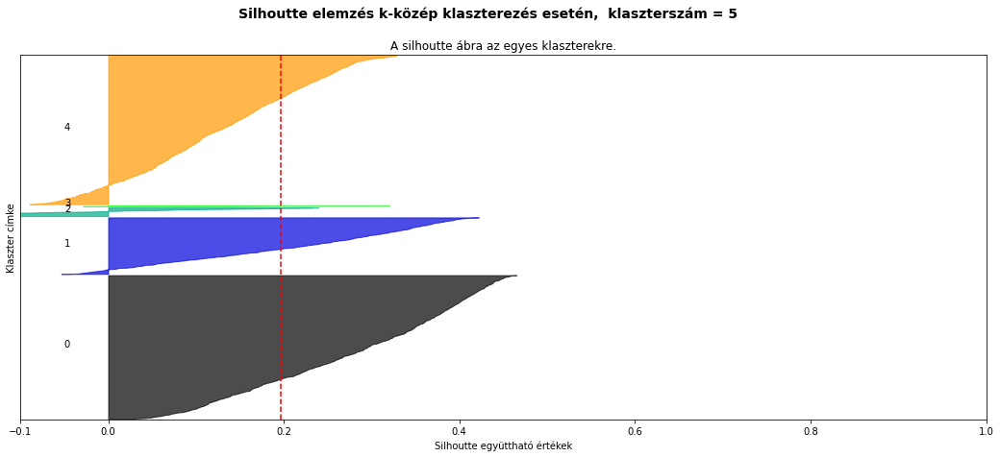

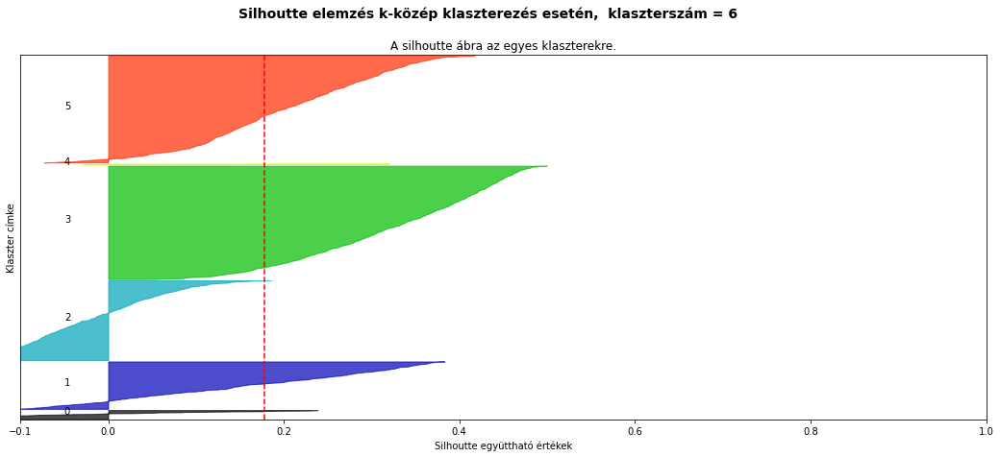

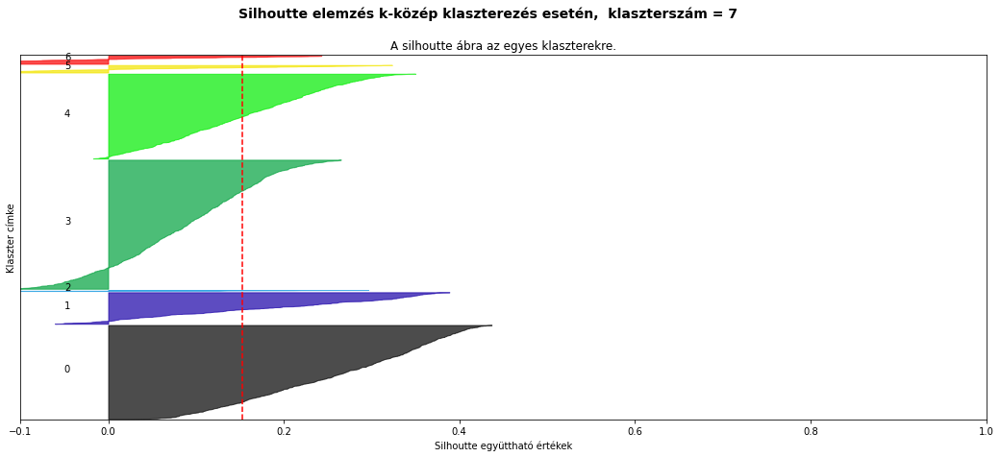

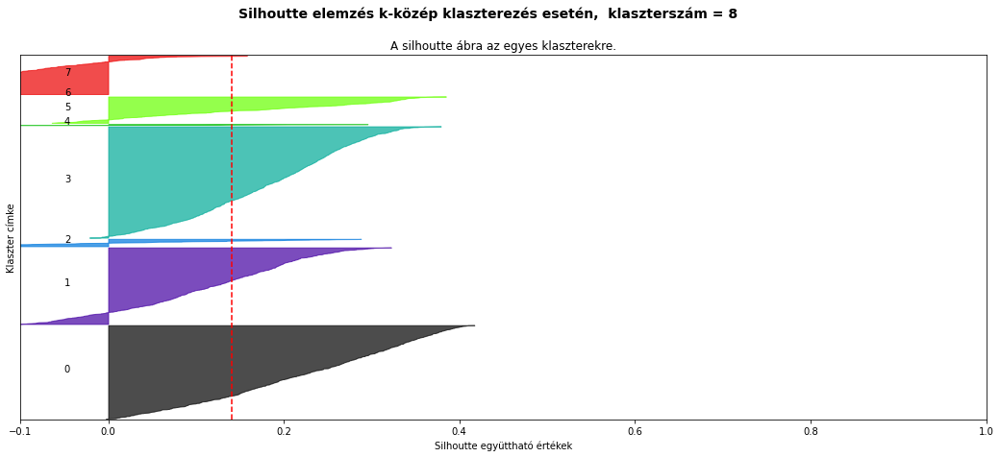

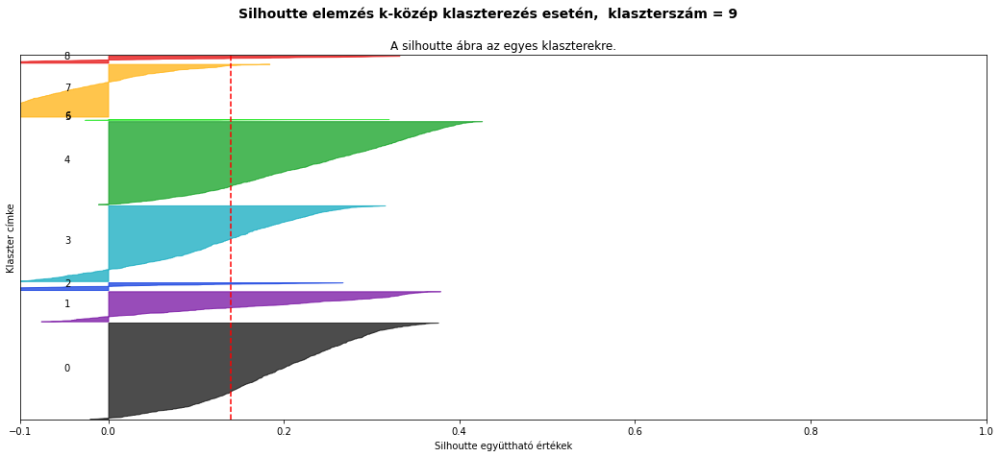

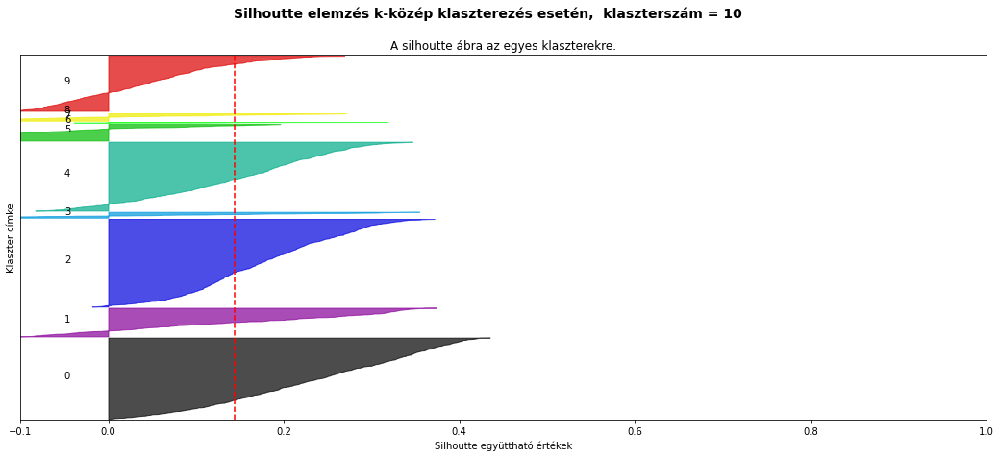

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés k-közép klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Spektrális klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.2964789378684087
For n_clusters = 3 The average silhouette_score is : 0.18051512423168983
For n_clusters = 4 The average silhouette_score is : 0.15196557201854058
For n_clusters = 5 The average silhouette_score is : 0.12847660115998258
For n_clusters = 6 The average silhouette_score is : 0.13030908376465497
For n_clusters = 7 The average silhouette_score is : 0.10828276378474318
For n_clusters = 8 The average silhouette_score is : 0.10591303402966626
For n_clusters = 9 The average silhouette_score is : 0.09290573770070161
For n_clusters = 10 The average silhouette_score is : 0.08924559896750947


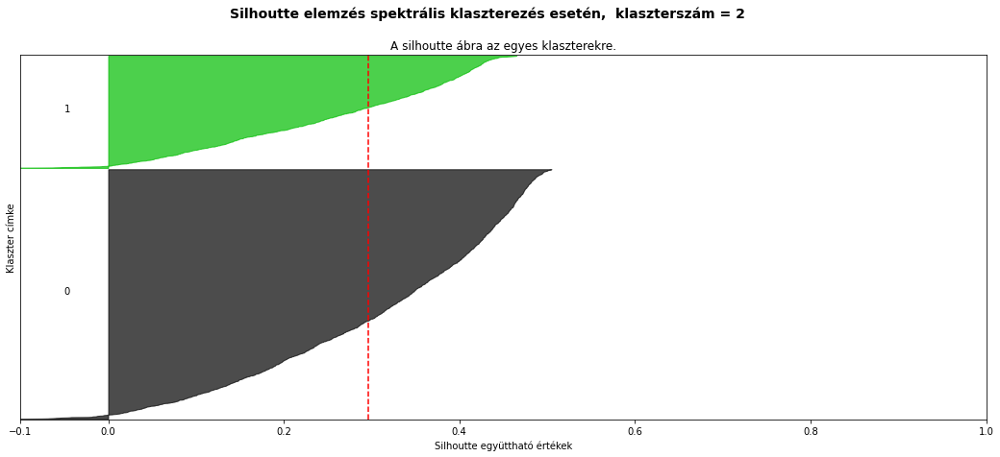

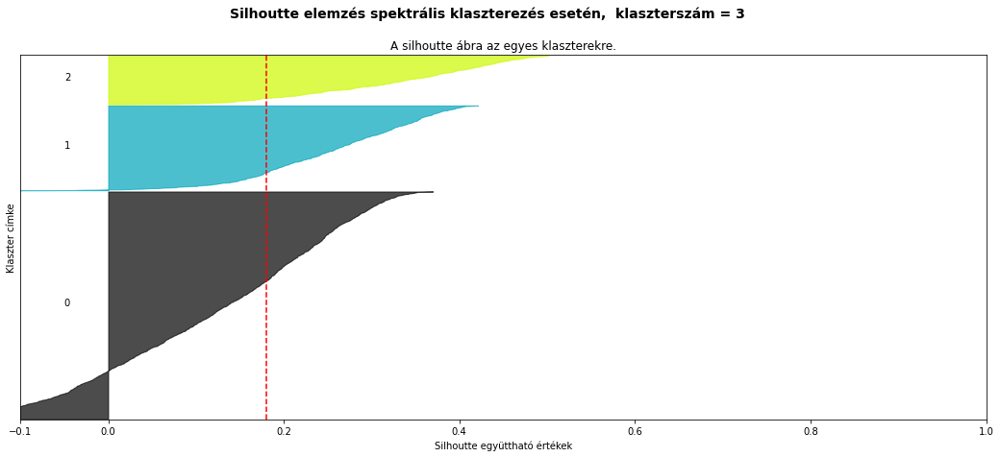

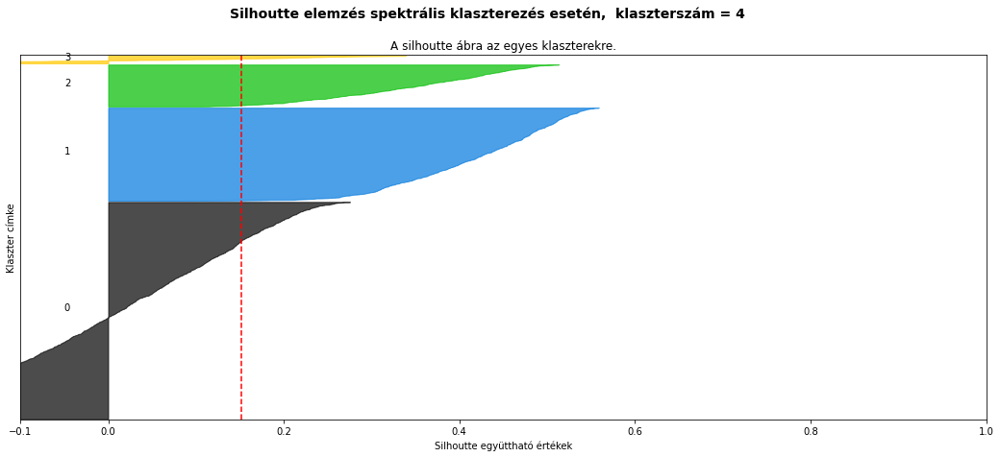

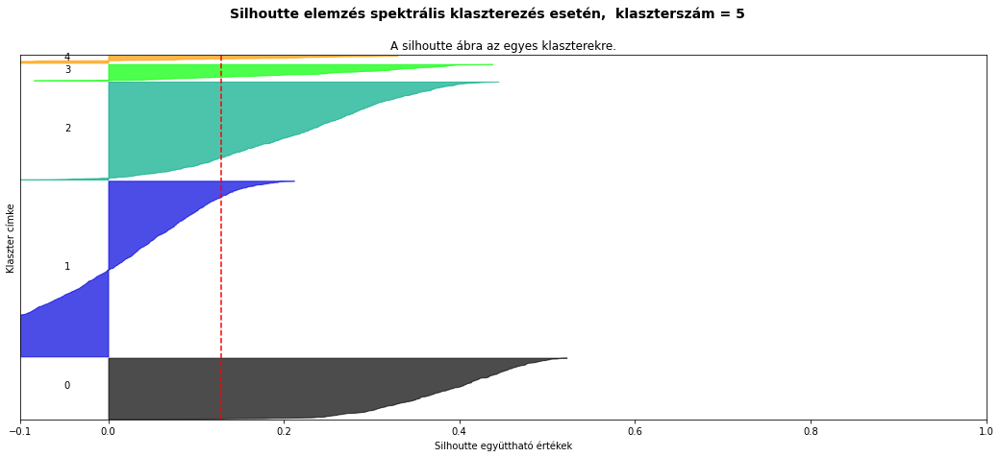

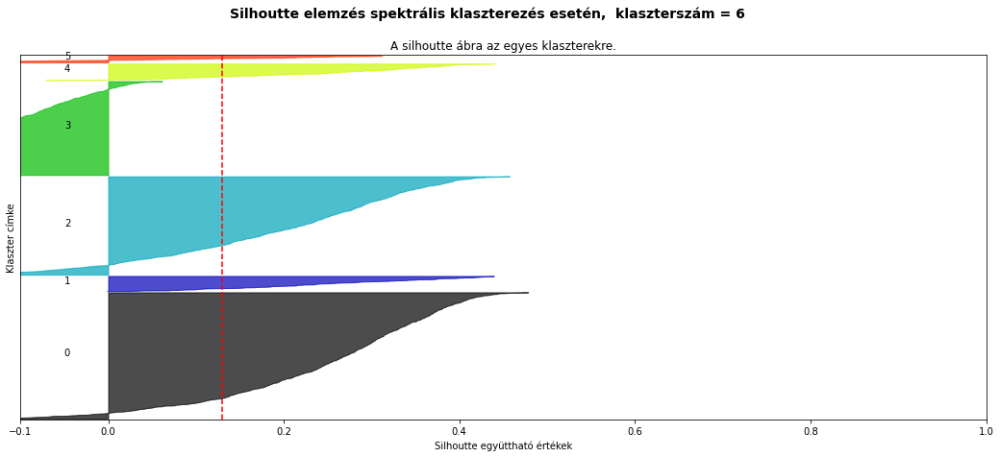

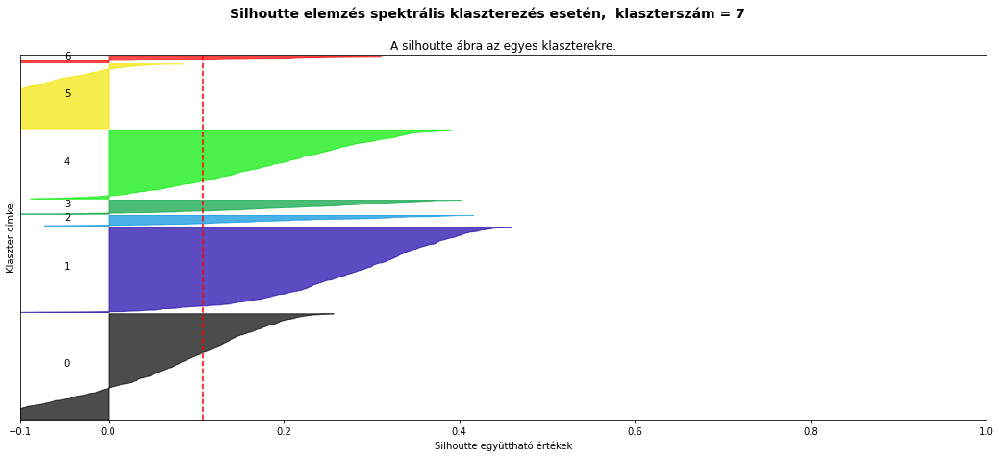

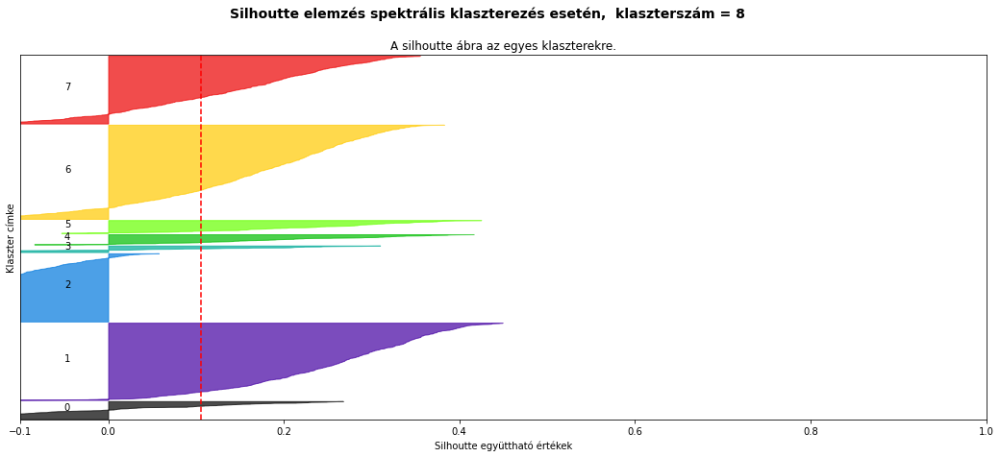

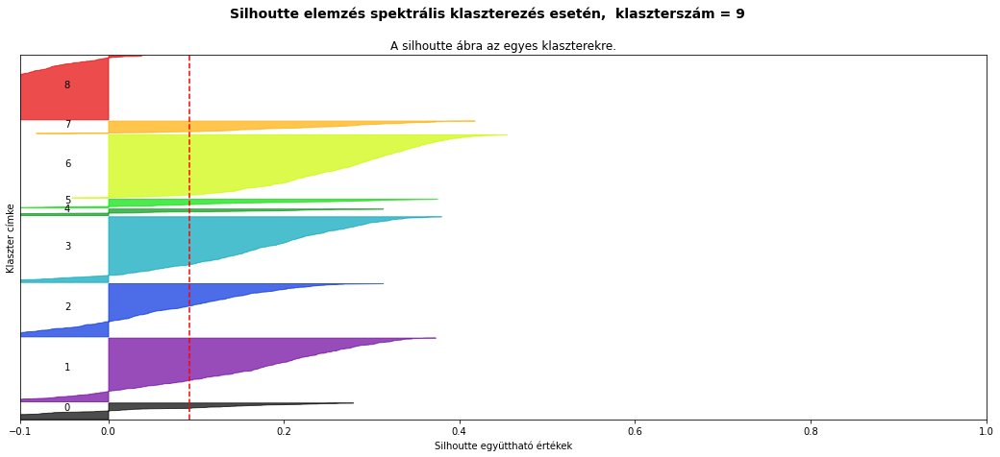

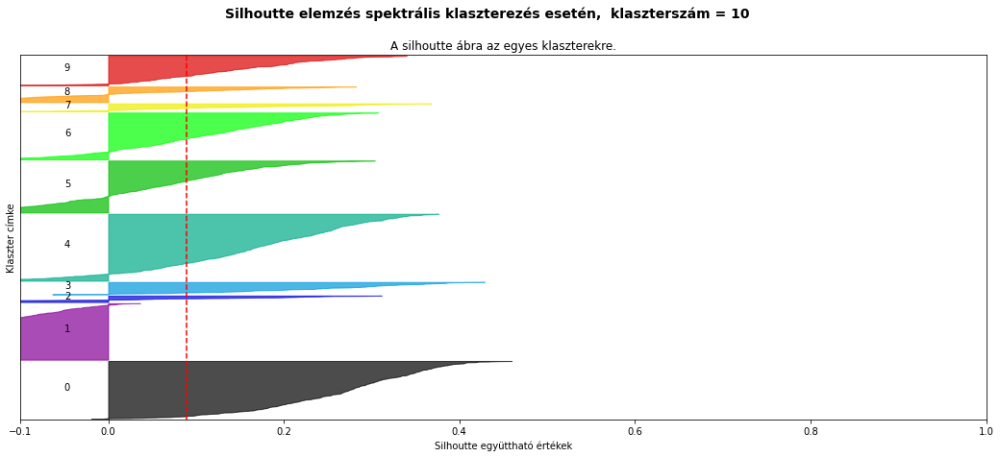

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = SpectralClustering(
    n_clusters=n_clusters, 
    random_state=25,  
    affinity='nearest_neighbors')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés spektrális klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Hierarchikus klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.2883576734678098
For n_clusters = 3 The average silhouette_score is : 0.29357754333086483
For n_clusters = 4 The average silhouette_score is : 0.12148861945939292
For n_clusters = 5 The average silhouette_score is : 0.12670162471587473
For n_clusters = 6 The average silhouette_score is : 0.11892603876350094
For n_clusters = 7 The average silhouette_score is : 0.12752034023158892
For n_clusters = 8 The average silhouette_score is : 0.12858805095309842
For n_clusters = 9 The average silhouette_score is : 0.12991319933293707
For n_clusters = 10 The average silhouette_score is : 0.13222519008698747


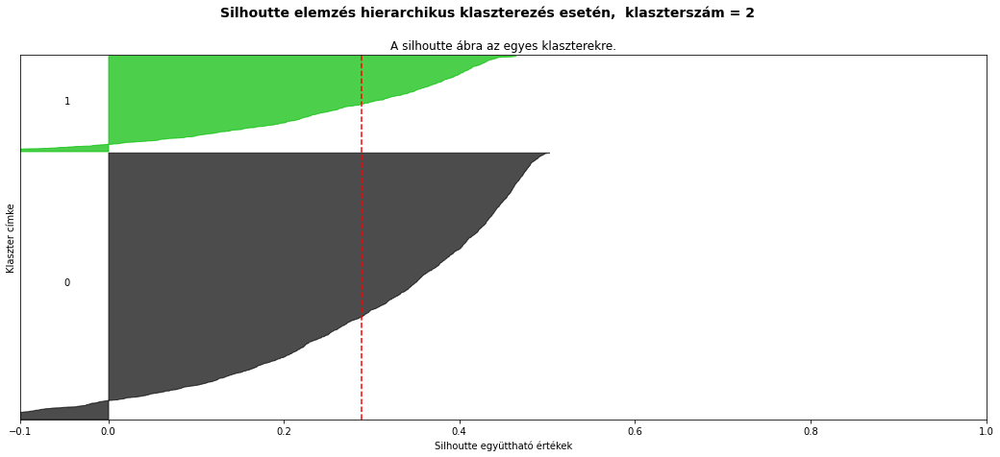

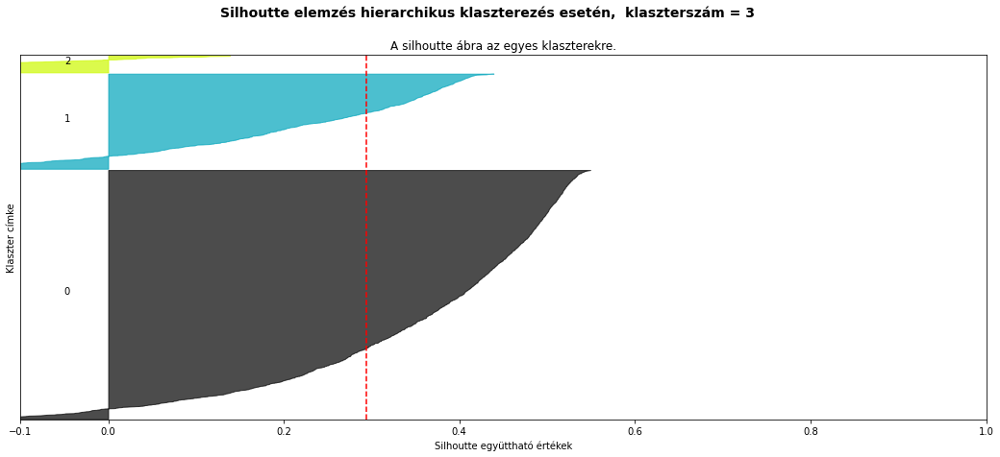

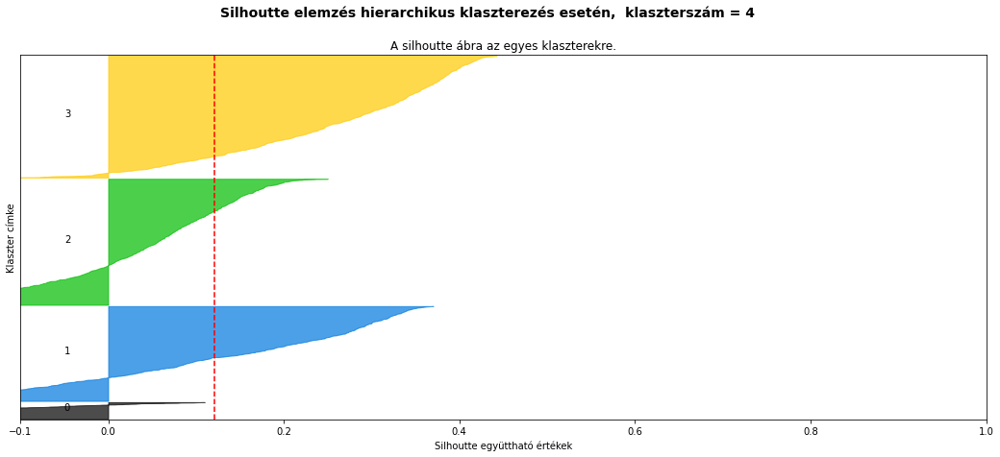

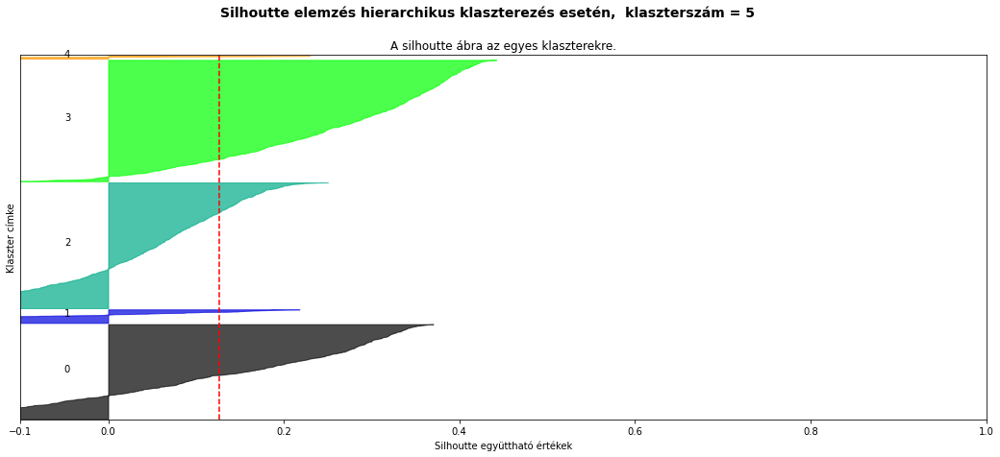

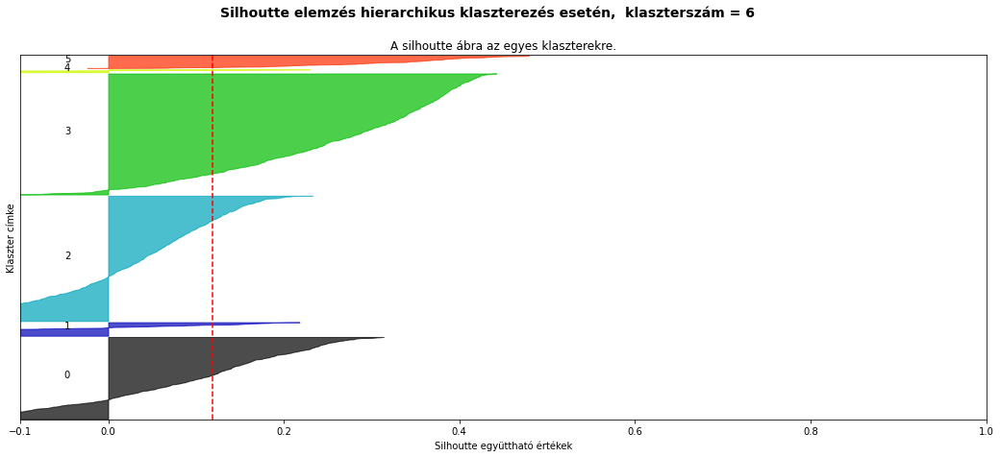

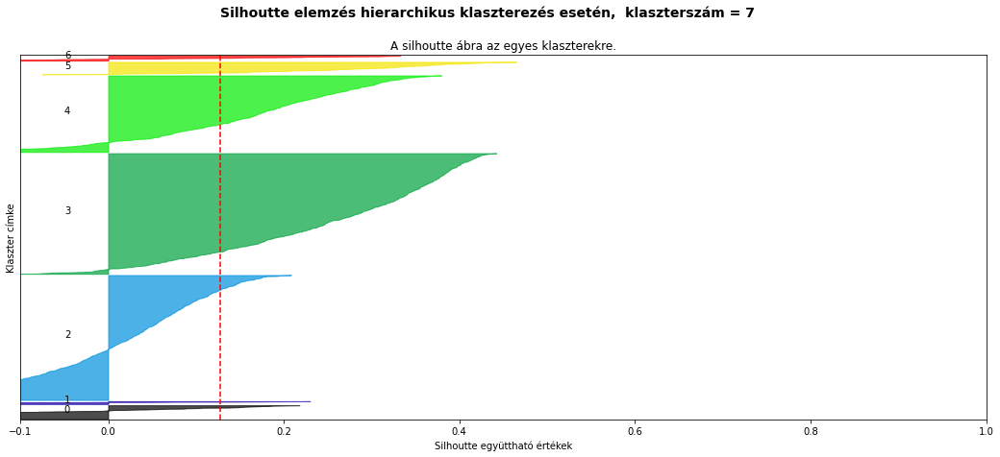

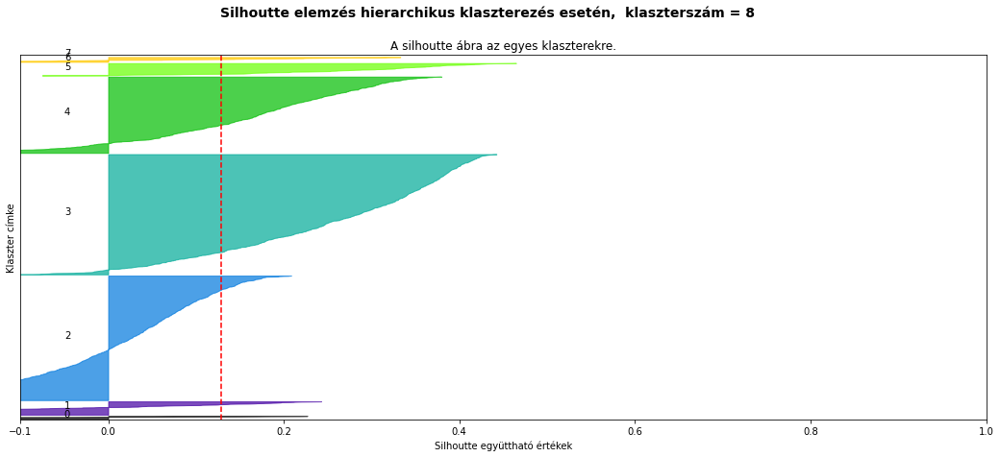

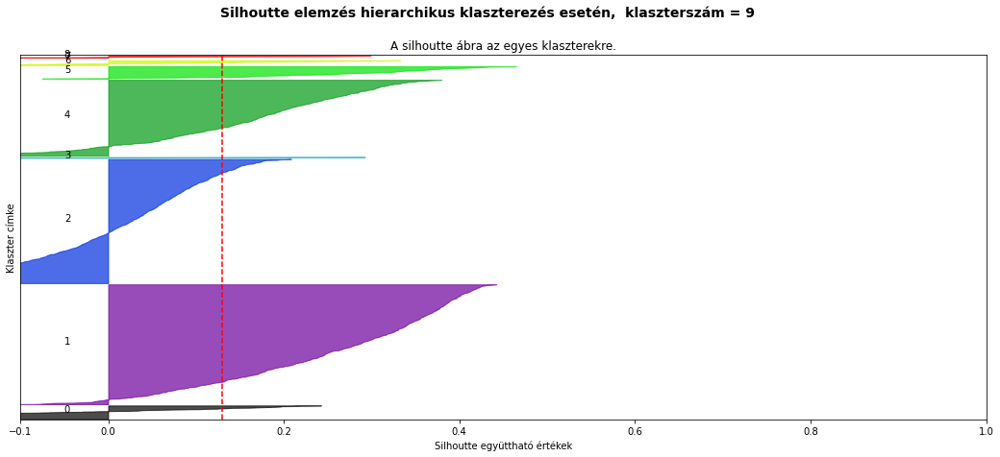

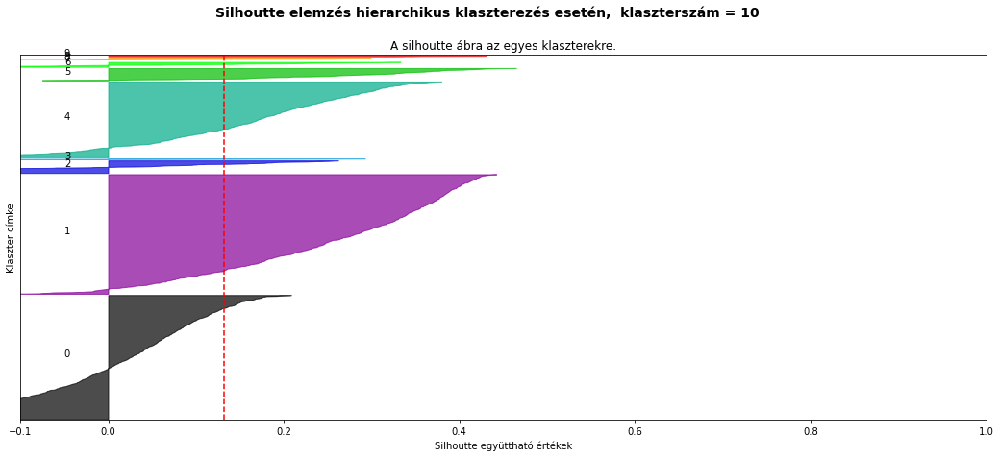

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters = n_clusters, affinity = 'euclidean', linkage ='ward')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés hierarchikus klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#### Klaszterezés

##### K=5

In [ ]:
K=5


KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
for i in range(5):
  print(str(i) + '. klaszter: ' + str(list(y).count(i)))

0. klaszter: 1226
1. klaszter: 1298
2. klaszter: 543
3. klaszter: 77
4. klaszter: 8


In [ ]:
lak_pca[lak_pca['klaszter']==4]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,klaszter
81,1.302675,9.531428,-4.140060,9.438185,-8.430447,8.474845,3.014629,-0.387165,12.364780,-5.504698,4
532,0.095169,14.479765,-7.374059,3.750985,-5.772990,0.708058,0.271807,0.031252,-5.576020,2.673196,4
793,-3.448770,23.135638,-9.985373,18.757489,-8.835179,6.894802,3.479159,3.178819,-4.440271,1.127746,4
1490,-0.220540,7.393370,-3.877578,4.529492,-7.095586,3.715548,-0.486458,0.500533,10.865437,-3.288082,4
1613,-1.095216,21.488147,-3.436436,13.362592,2.862083,2.554587,1.871711,3.983334,10.287941,-4.027490,4
2299,0.108950,9.617834,-6.670460,6.645063,-6.434644,3.779586,-1.398860,-2.496538,3.400978,-3.340380,4
2750,-0.957557,14.566433,-7.601638,3.388552,-8.581420,3.205096,-4.686767,-3.281261,-6.949729,2.625169,4
2751,3.280563,11.006256,-6.655516,4.171574,-5.650012,1.776133,-0.419518,-0.000095,-2.630848,2.275736,4


In [ ]:
data_lak_clus_full_clus = data_lak_clus_full.copy()
data_lak_clus_full_clus['klaszter'] = list(y)
data_lak_clus_full_clus[data_lak_clus_full_clus['klaszter']==4]
#data_lak_clus_full_clus.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter
ind,,,,,,,,,,,,,,,,,,,
"(Arka, 2368, 48.3566587759573, 21.2550039258536)",0.666667,0.011111,0.366667,0.000000,1.311111,0.522222,0.800000,0.022222,1.8,0.388889,0.0,0.022222,0.100000,0.288889,0.033333,0.244444,191.411111,0.033333,4
"(Debréte, 2932, 48.4978247736252, 20.8654470658118)",2.166667,0.055556,0.000000,0.055556,0.444444,0.000000,1.166667,0.055556,0.0,0.000000,0.0,0.166667,0.000000,0.500000,0.166667,0.444444,93.166667,0.444444,4
"(Gagyapáti, 2617, 48.4100033878846, 20.9966328538415)",0.538462,0.230769,0.000000,0.076923,1.076923,0.000000,1.307692,0.000000,0.0,0.000000,0.0,0.384615,0.307692,0.923077,0.000000,0.846154,405.846154,0.692308,4
"(Lendvajakabfa, 929, 46.6753420672161, 16.4427618006544)",0.848485,0.030303,0.212121,0.000000,0.969697,0.333333,1.303030,0.030303,0.0,0.000000,0.0,0.060606,0.000000,0.151515,0.090909,0.151515,66.696970,0.000000,4
"(Megyer, 293, 47.0625733701914, 17.1943569992751)",2.538462,0.230769,0.000000,0.153846,1.307692,0.000000,1.692308,0.076923,0.0,0.000000,0.0,0.461538,0.230769,1.461538,0.000000,0.615385,229.461538,0.076923,4
"(Sima, 2098, 48.3002395294024, 21.3050886391276)",1.656250,0.000000,0.000000,0.000000,0.812500,0.000000,1.312500,0.031250,0.0,0.250000,0.0,0.031250,0.093750,0.281250,0.000000,0.218750,31.062500,0.218750,4
"(Tornabarakony, 1465, 48.4924414653169, 20.8204332203498)",2.533333,0.000000,0.000000,0.066667,0.466667,0.000000,1.800000,0.066667,0.0,0.000000,0.0,0.066667,0.000000,0.133333,0.066667,0.066667,13.600000,0.533333,4
"(Tornakápolna, 821, 48.4659680686614, 20.621218040818)",2.043478,0.000000,0.043478,0.000000,0.478261,0.086957,1.478261,0.043478,0.0,0.000000,0.0,0.043478,0.000000,0.391304,0.130435,0.347826,334.391304,0.304348,4


In [ ]:
data_lak_clus_full_clus.sort_values(by='elvándorlások száma', ascending=False).head(10)

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter
ind,,,,,,,,,,,,,,,,,,,
"(Arka, 2368, 48.3566587759573, 21.2550039258536)",0.666667,0.011111,0.366667,0.000000,1.311111,0.522222,0.800000,0.022222,1.8,0.388889,0.000000,0.022222,0.100000,0.288889,0.033333,0.244444,191.411111,0.033333,4
"(Megyer, 293, 47.0625733701914, 17.1943569992751)",2.538462,0.230769,0.000000,0.153846,1.307692,0.000000,1.692308,0.076923,0.0,0.000000,0.000000,0.461538,0.230769,1.461538,0.000000,0.615385,229.461538,0.076923,4
"(Gagyapáti, 2617, 48.4100033878846, 20.9966328538415)",0.538462,0.230769,0.000000,0.076923,1.076923,0.000000,1.307692,0.000000,0.0,0.000000,0.000000,0.384615,0.307692,0.923077,0.000000,0.846154,405.846154,0.692308,4
"(Lendvajakabfa, 929, 46.6753420672161, 16.4427618006544)",0.848485,0.030303,0.212121,0.000000,0.969697,0.333333,1.303030,0.030303,0.0,0.000000,0.000000,0.060606,0.000000,0.151515,0.090909,0.151515,66.696970,0.000000,4
"(Sima, 2098, 48.3002395294024, 21.3050886391276)",1.656250,0.000000,0.000000,0.000000,0.812500,0.000000,1.312500,0.031250,0.0,0.250000,0.000000,0.031250,0.093750,0.281250,0.000000,0.218750,31.062500,0.218750,4
"(Keresztéte, 1481, 48.5004218033779, 20.9530798606733)",0.242857,0.028571,0.000000,0.000000,0.514286,0.000000,0.342857,0.000000,0.0,0.000000,0.014286,0.114286,0.057143,0.171429,0.085714,0.157143,17.642857,0.128571,2
"(Tornakápolna, 821, 48.4659680686614, 20.621218040818)",2.043478,0.000000,0.043478,0.000000,0.478261,0.086957,1.478261,0.043478,0.0,0.000000,0.000000,0.043478,0.000000,0.391304,0.130435,0.347826,334.391304,0.304348,4
"(Tornabarakony, 1465, 48.4924414653169, 20.8204332203498)",2.533333,0.000000,0.000000,0.066667,0.466667,0.000000,1.800000,0.066667,0.0,0.000000,0.000000,0.066667,0.000000,0.133333,0.066667,0.066667,13.600000,0.533333,4
"(Debréte, 2932, 48.4978247736252, 20.8654470658118)",2.166667,0.055556,0.000000,0.055556,0.444444,0.000000,1.166667,0.055556,0.0,0.000000,0.000000,0.166667,0.000000,0.500000,0.166667,0.444444,93.166667,0.444444,4


In [ ]:
data_lak_clus_full_clus.sort_values(by='üzemelő közkifolyók száma', ascending=False).head(10)

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter
ind,,,,,,,,,,,,,,,,,,,
"(Vaskeresztes, 2811, 47.1934650945522, 16.449567068398)",1.556430,0.000000,0.000000,0.000000,0.020997,0.000000,0.994751,0.031496,0.000000,0.173228,0.000000,0.036745,0.005249,0.375328,0.000000,0.335958,598.524934,0.002625,0
"(Teresztenye, 2608, 48.4453832004112, 20.6097680555951)",2.095238,0.000000,0.142857,0.000000,0.190476,0.142857,1.619048,0.047619,0.000000,0.000000,0.000000,0.000000,0.000000,0.809524,0.000000,0.333333,596.238095,0.238095,3
"(Telki, 614, 47.5493163629087, 18.828656122508)",0.666756,0.001077,0.729206,0.003499,0.047106,0.319515,0.275101,0.043876,0.000000,0.182503,0.000000,0.017227,0.001346,0.341588,0.000538,0.303903,462.099327,0.000000,0
"(Budajenő, 138, 47.5565154318414, 18.8034997334483)",0.822404,0.002186,0.683060,0.003825,0.047541,0.293443,0.375956,0.039891,0.000000,0.127322,0.001093,0.021858,0.012568,0.345902,0.005464,0.313115,436.027869,0.003825,0
"(Gagyapáti, 2617, 48.4100033878846, 20.9966328538415)",0.538462,0.230769,0.000000,0.076923,1.076923,0.000000,1.307692,0.000000,0.000000,0.000000,0.000000,0.384615,0.307692,0.923077,0.000000,0.846154,405.846154,0.692308,4
"(Üröm, 974, 47.5979391432514, 19.0157928264109)",0.855821,0.000276,0.650186,0.002900,0.050407,0.350780,0.331170,0.051650,0.012567,0.127054,0.000138,0.013534,0.023339,0.355614,0.005662,0.325369,377.512636,0.001105,0
"(Bakonykúti, 2074, 47.2463316180883, 18.197415079953)",1.472441,0.000000,0.511811,0.007874,0.023622,0.614173,0.858268,0.039370,0.000000,0.000000,0.000000,0.031496,0.000000,0.354331,0.000000,0.307087,370.181102,0.015748,0
"(Szántód, 3158, 46.8687953547556, 17.9060530905368)",2.253968,0.005291,0.910053,0.021164,0.121693,1.285714,3.732804,0.084656,0.000000,0.373016,0.007937,0.082011,0.005291,0.682540,0.119048,0.645503,359.293651,0.000000,3
"(Diósd, 2155, 47.4094431447616, 18.9503855175798)",1.135678,0.001520,0.653425,0.002822,0.055465,0.399327,0.595463,0.047107,0.029741,0.229024,0.000760,0.018669,0.018669,0.381743,0.005319,0.350374,343.556171,0.000651,0


In [ ]:
data_unchanged['klaszter'] = list(y)
data_unchanged[data_unchanged['klaszter']==4]

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,lakónépesség száma az év végén,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter
ind,,,,,,,,,,,,,,,,,,,,
"(Arka, 2368, 48.3566587759573, 21.2550039258536)",60.0,1.0,33.0,0.0,118.0,47.0,72.0,2.0,162.0,35.0,90.0,0.0,2.0,9.0,26.0,3.0,22.0,17227.0,3.0,4
"(Debréte, 2932, 48.4978247736252, 20.8654470658118)",39.0,1.0,0.0,1.0,8.0,0.0,21.0,1.0,0.0,0.0,18.0,0.0,3.0,0.0,9.0,3.0,8.0,1677.0,8.0,4
"(Gagyapáti, 2617, 48.4100033878846, 20.9966328538415)",7.0,3.0,0.0,1.0,14.0,0.0,17.0,0.0,0.0,0.0,13.0,0.0,5.0,4.0,12.0,0.0,11.0,5276.0,9.0,4
"(Lendvajakabfa, 929, 46.6753420672161, 16.4427618006544)",28.0,1.0,7.0,0.0,32.0,11.0,43.0,1.0,NaN,0.0,33.0,0.0,2.0,NaN,5.0,3.0,5.0,2201.0,0.0,4
"(Megyer, 293, 47.0625733701914, 17.1943569992751)",33.0,3.0,0.0,2.0,17.0,0.0,22.0,1.0,0.0,0.0,13.0,0.0,6.0,3.0,19.0,0.0,8.0,2983.0,1.0,4
"(Sima, 2098, 48.3002395294024, 21.3050886391276)",53.0,0.0,0.0,0.0,26.0,0.0,42.0,1.0,0.0,8.0,32.0,0.0,1.0,3.0,9.0,0.0,7.0,994.0,7.0,4
"(Tornabarakony, 1465, 48.4924414653169, 20.8204332203498)",38.0,0.0,0.0,1.0,7.0,0.0,27.0,1.0,0.0,0.0,15.0,0.0,1.0,0.0,2.0,1.0,1.0,204.0,8.0,4
"(Tornakápolna, 821, 48.4659680686614, 20.621218040818)",47.0,0.0,1.0,0.0,11.0,2.0,34.0,1.0,0.0,0.0,23.0,0.0,1.0,0.0,9.0,3.0,8.0,7691.0,7.0,4


###### 30%

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.3)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/945 [00:00<?, ?it/s]

A streamkimeneten csak az utolsó 5000 sor látható.
model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: 

In [ ]:
features = list(data_lak_clus_full.columns)

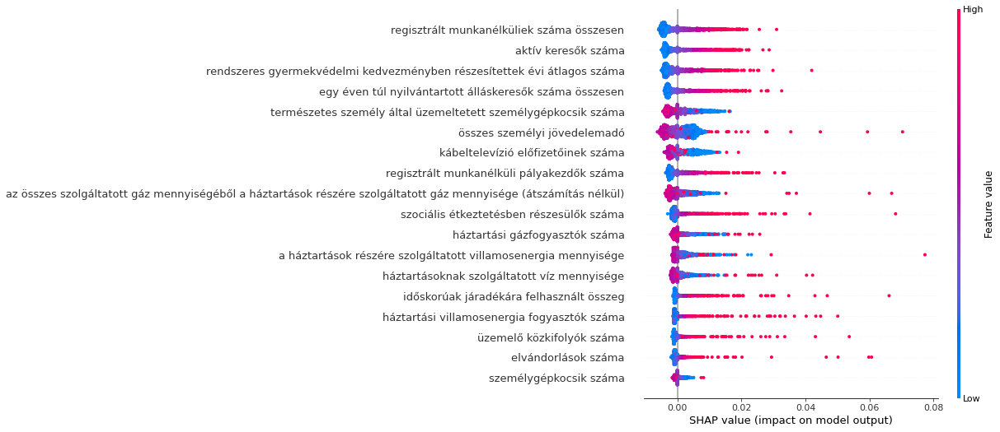

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

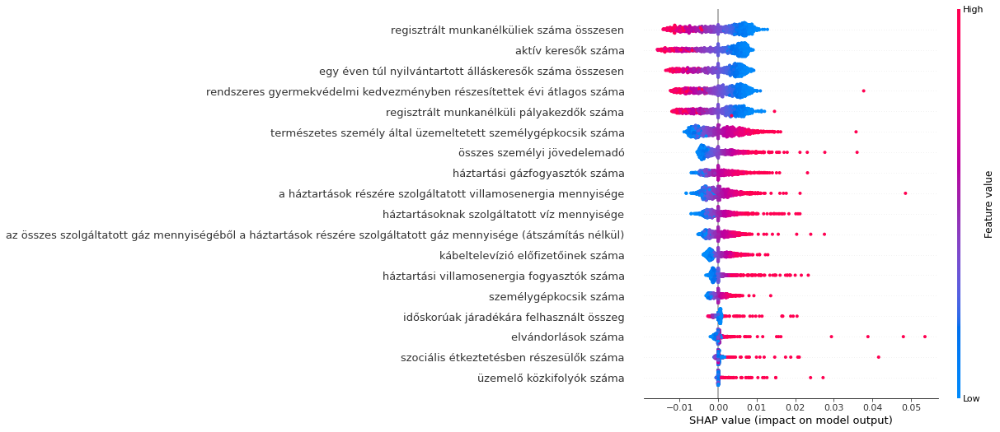

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

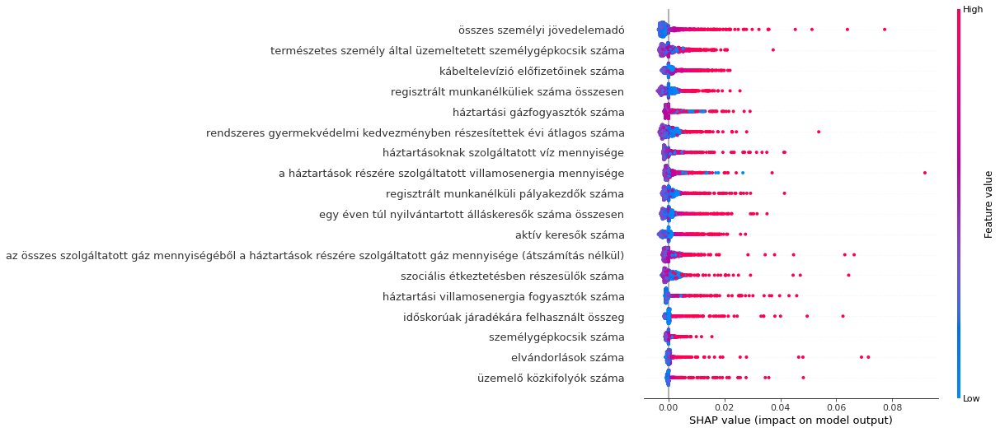

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

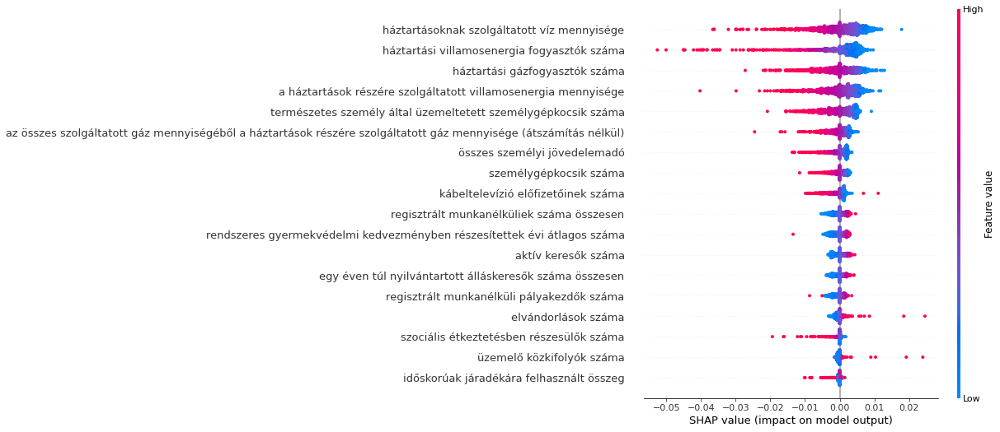

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

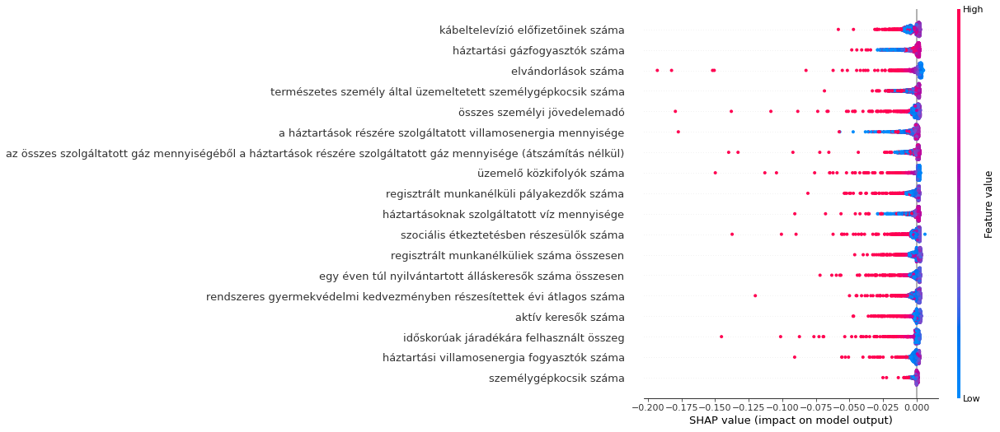

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

###### Térképfájlba írás

In [ ]:
telepulesek=[]
for i in data_lak_clus.index.values.tolist():
  telepulesek.append(i[0])
telepulesek[:5]

['Aba', 'Abaliget', 'Abasár', 'Abaújalpár', 'Abaújkér']

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X['klaszter'] = lak_pca['klaszter']
X['name'] = telepulesek
X.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter,name
0,-0.557013,-0.671977,0.534615,-0.728267,-0.517836,0.075687,-0.573154,-0.117560,-0.219405,0.074772,-0.354494,-0.643333,-0.105659,-0.388684,-0.783704,-0.603504,0.112319,-0.414850,0,Aba
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581,2,Abaliget
2,0.993727,-0.571586,0.844407,-0.341616,-0.353005,0.714537,-0.182442,0.498072,-0.288474,0.435648,-0.457373,-0.560595,-0.746418,0.817221,-0.451231,1.544141,1.305191,-0.372665,0,Abasár
3,-1.131790,3.976572,-0.437236,2.255306,0.723757,0.007873,0.779072,-1.501669,-0.464262,-1.124073,-1.091888,2.924066,0.212040,0.035290,-0.840673,-0.569080,0.768317,2.459973,1,Abaújalpár
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058,2,Abaújkér


In [ ]:
X_geo = X.merge(geoname, on='name')
X_geo.head()

,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter,name,geonameid,geoid,wgs84_e_szelesseg,wgs84_k_hosszusag
0,-0.557013,-0.671977,0.534615,-0.728267,-0.517836,0.075687,-0.573154,-0.117560,-0.219405,0.074772,-0.354494,-0.643333,-0.105659,-0.388684,-0.783704,-0.603504,0.112319,-0.414850,0,Aba,9692,1512,47.034356,18.524755
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581,2,Abaliget,16239,1035,46.143846,18.118111
2,0.993727,-0.571586,0.844407,-0.341616,-0.353005,0.714537,-0.182442,0.498072,-0.288474,0.435648,-0.457373,-0.560595,-0.746418,0.817221,-0.451231,1.544141,1.305191,-0.372665,0,Abasár,10360,2209,47.800687,20.008398
3,-1.131790,3.976572,-0.437236,2.255306,0.723757,0.007873,0.779072,-1.501669,-0.464262,-1.124073,-1.091888,2.924066,0.212040,0.035290,-0.840673,-0.569080,0.768317,2.459973,1,Abaújalpár,17191,1341,48.306147,21.234097
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058,2,Abaújkér,10500,2420,48.305038,21.200221


In [ ]:
file_old = '/content/drive/My Drive/Temalabor1/momap.geojson'
file_new = '/content/drive/My Drive/Diplomamunka/klaszter5_2010_lak_uj.geojson'

import json
with open(file_old, 'r') as f:
    data = json.load(f)

for feature in data['features']:
    geoid2 = feature['properties']['geoid']
    if len(X_geo[X_geo['geoid'] == geoid2]['klaszter']) == 0:
      del feature
    else:
      feature['properties']['klaszter'] = X_geo[X_geo.geoid == geoid2]['klaszter'].item()
      feature['properties']['varos'] = str(X_geo[X_geo.geoid == geoid2]['name'].item())

with open(file_new, 'w+') as f:
    json.dump(data, f, indent=2)

###### 20%

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

K=5

KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.2)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/630 [00:00<?, ?it/s]

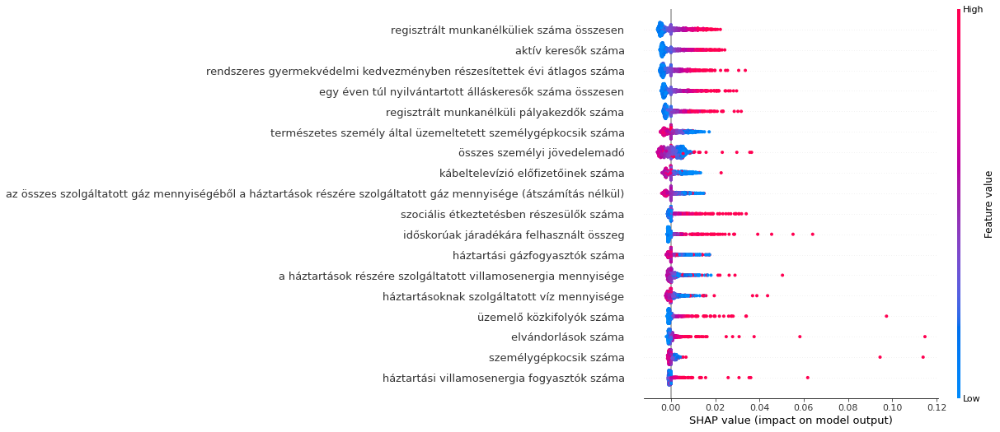

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

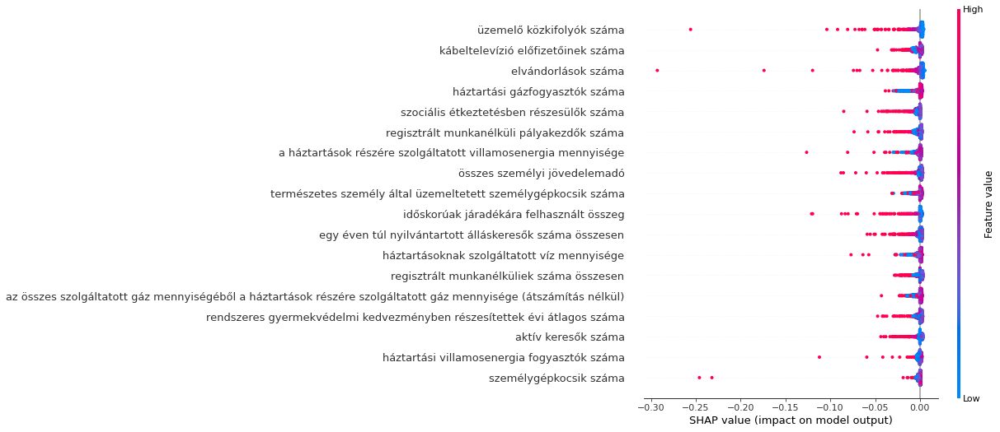

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

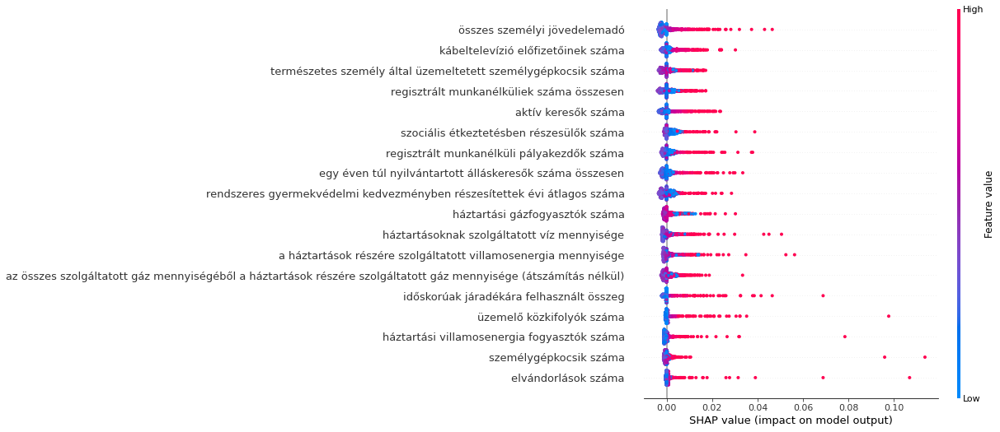

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

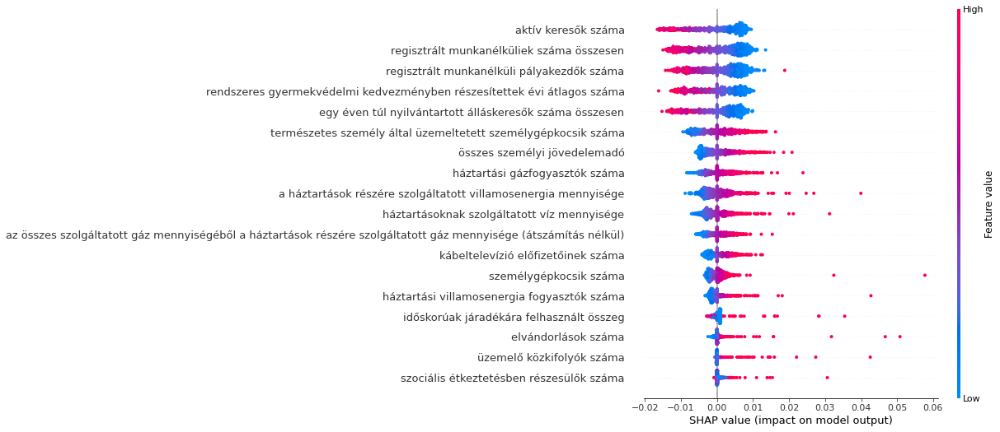

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

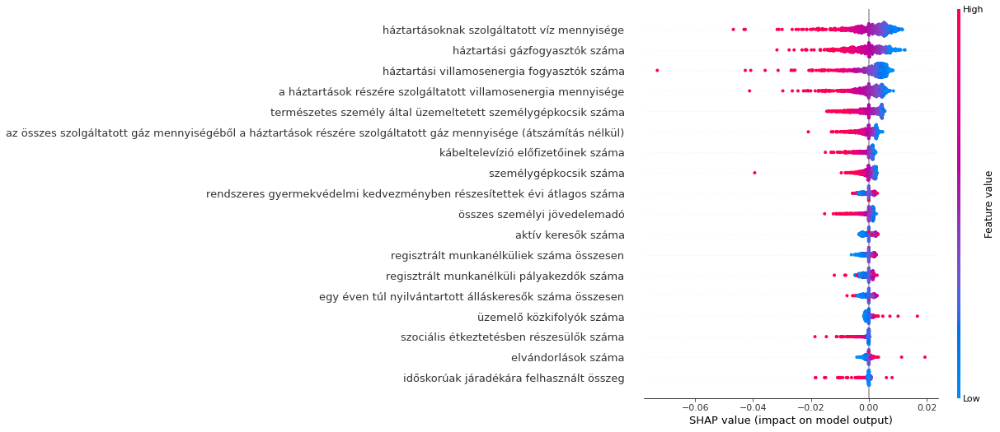

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

###### 10%

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

K=5

KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

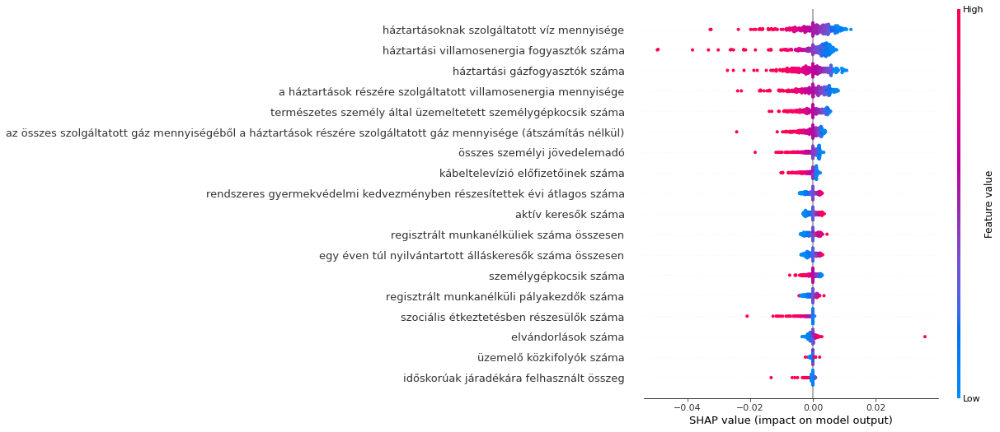

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp, max_display=20)

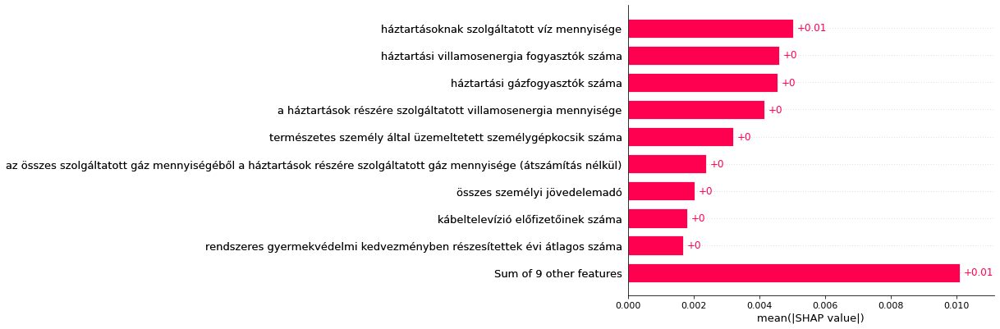

In [ ]:
shap.plots.bar(c_exp)

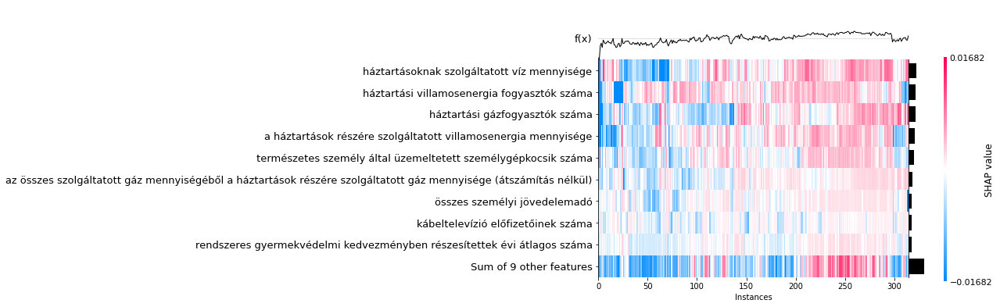

In [ ]:
shap.plots.heatmap(c_exp)

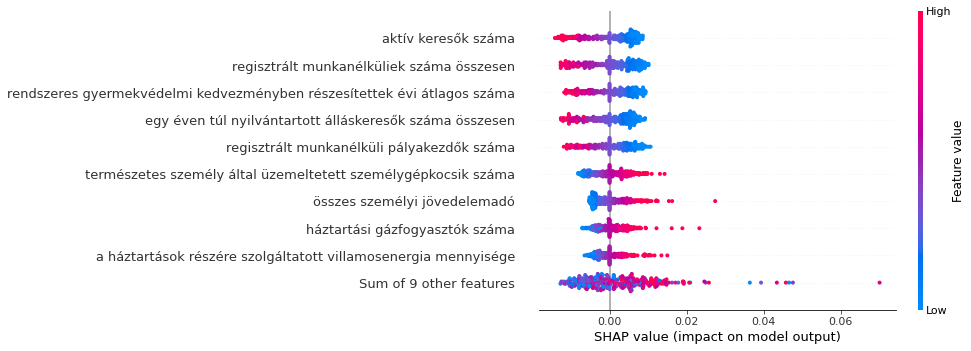

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

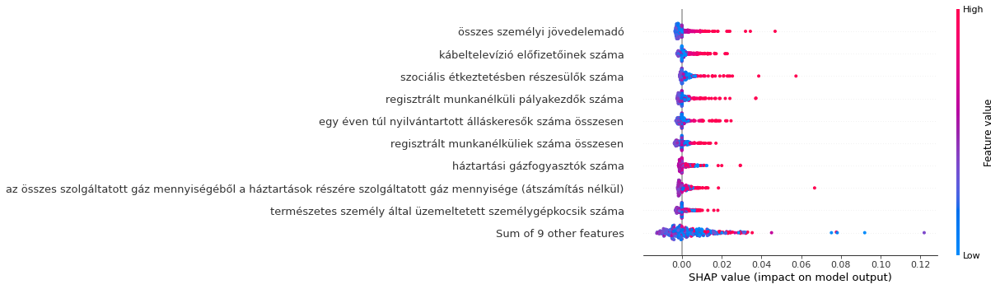

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

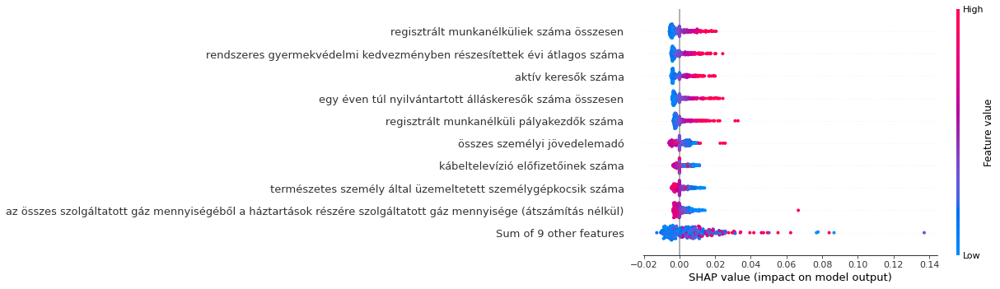

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

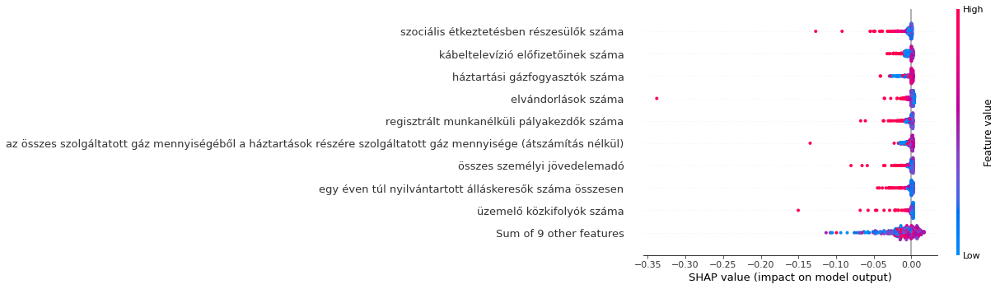

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

###### Diszjunkt 10%-okkal

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

K=5

KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(X.tolist()[:315])

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

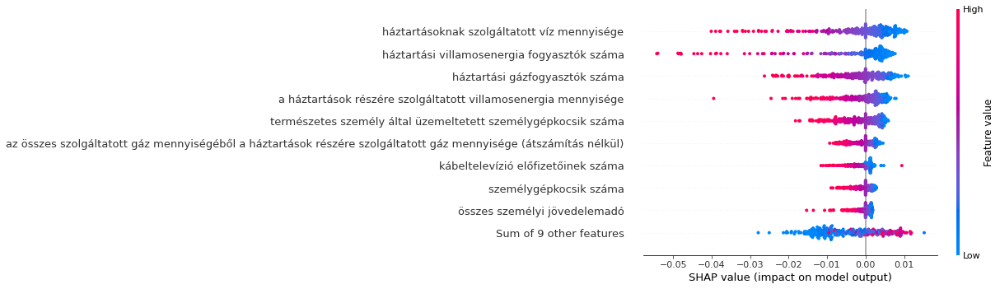

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

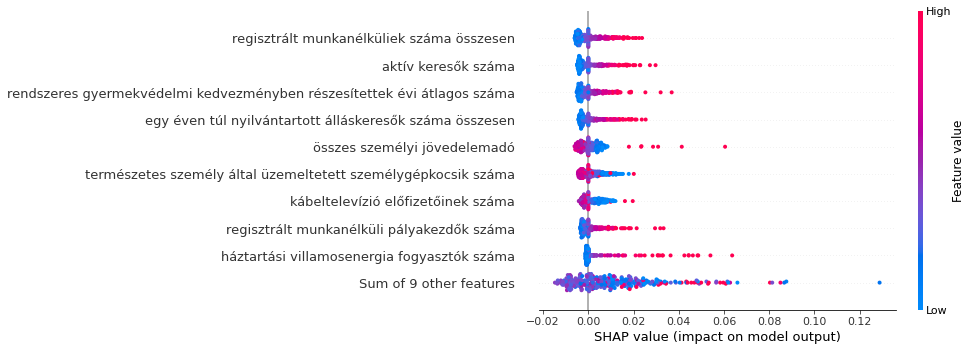

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

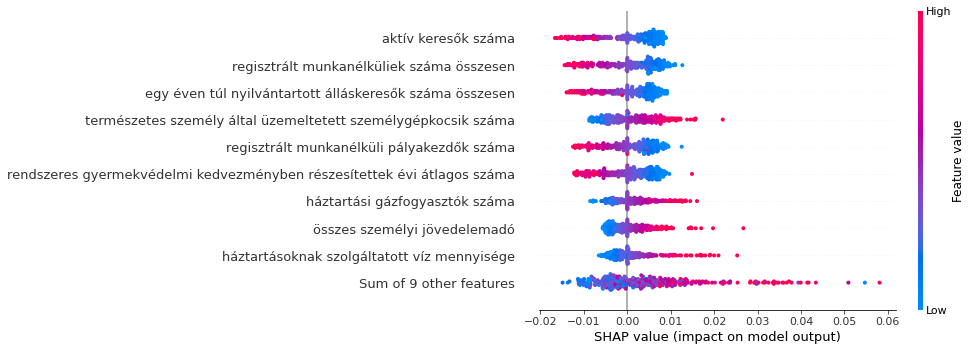

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

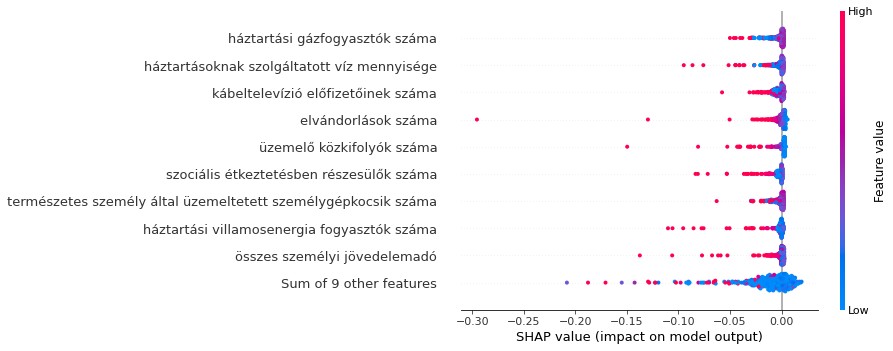

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

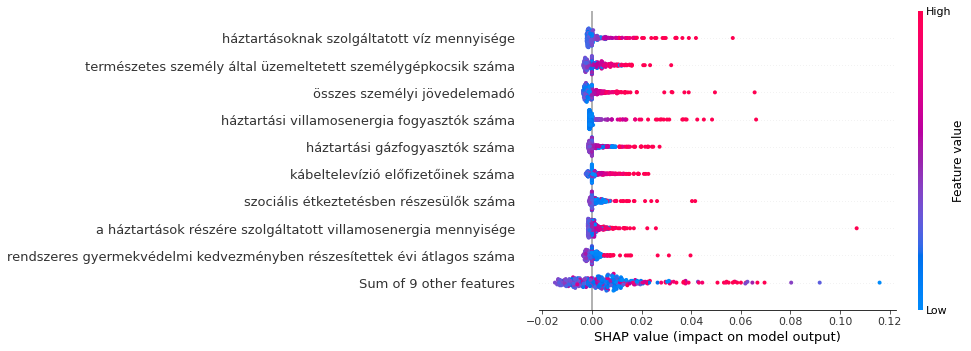

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

###### Diszjunkt 10%-okkal 2

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

K=5

KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(X.tolist()[315:630])

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

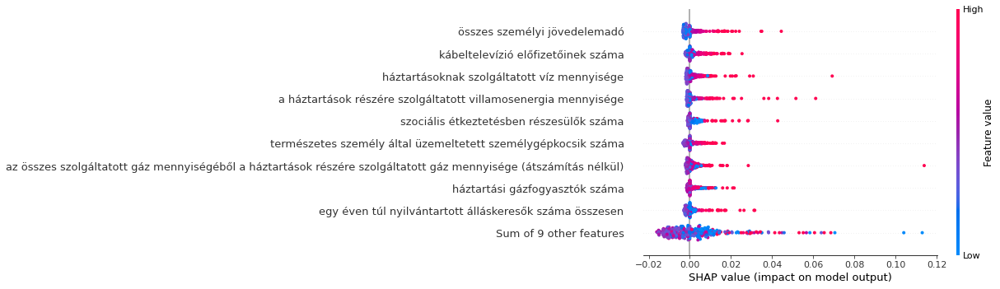

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

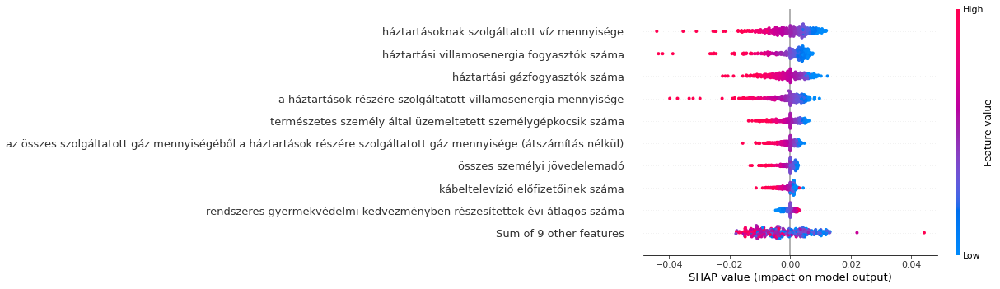

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

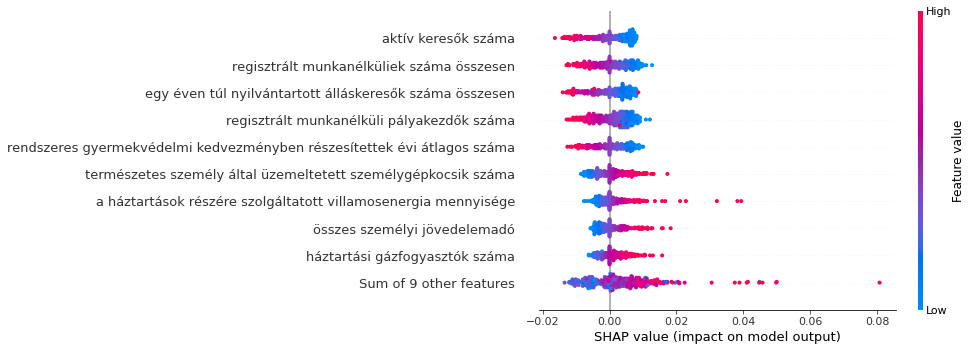

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

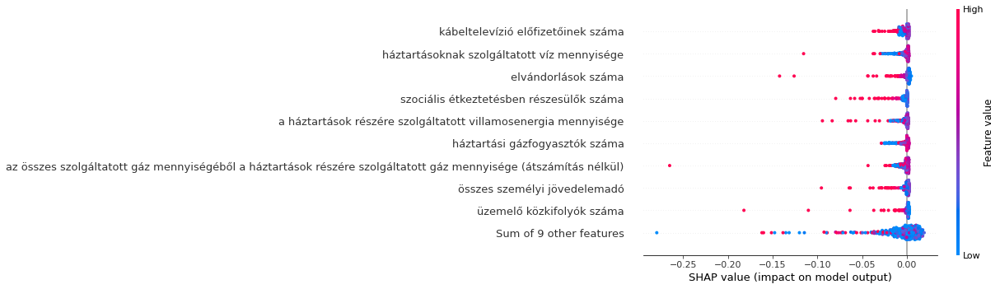

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

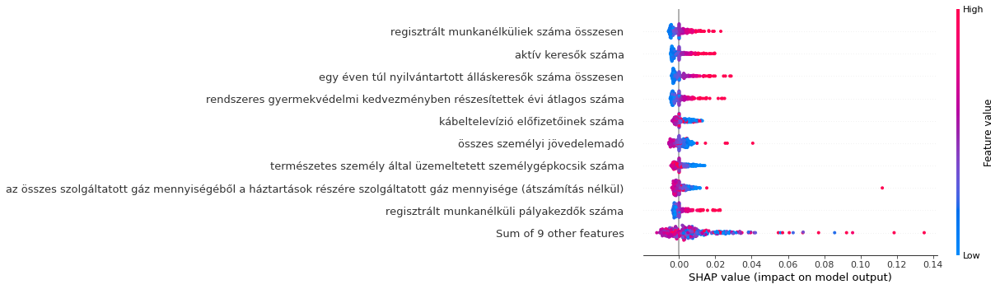

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

###### Diszjunkt 10%-okkal 3

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

K=5

KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(X.tolist()[630:945])

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

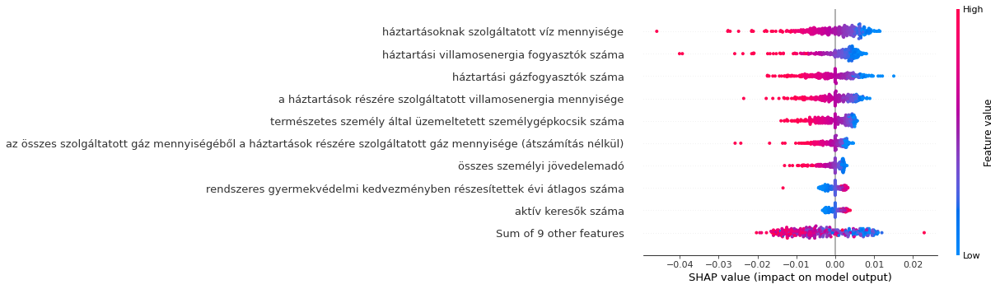

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

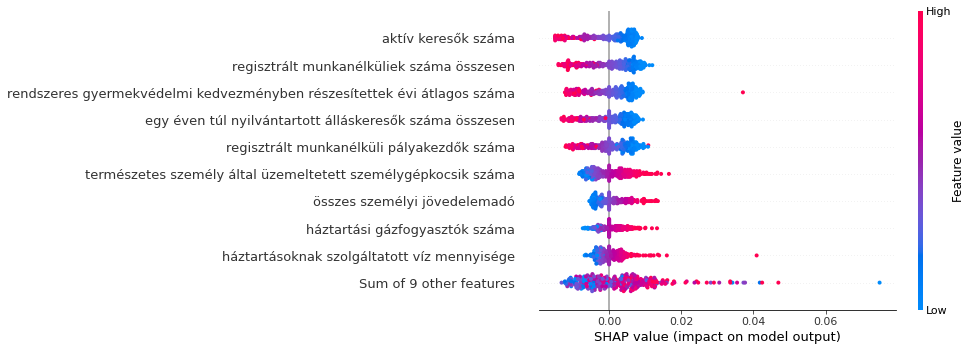

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

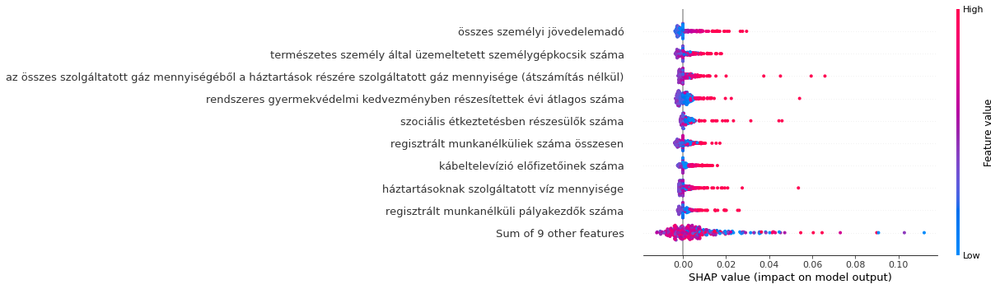

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

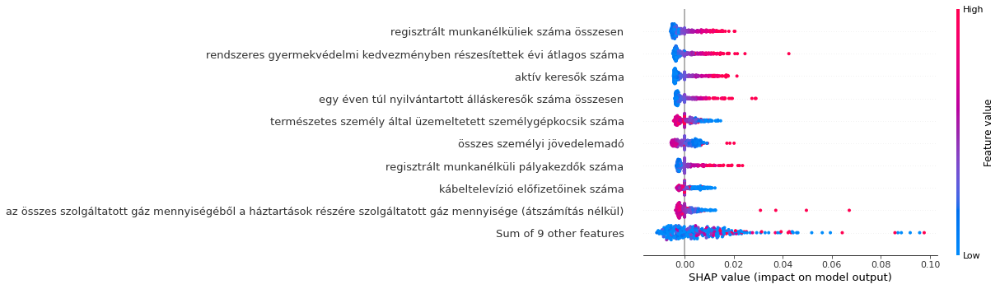

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

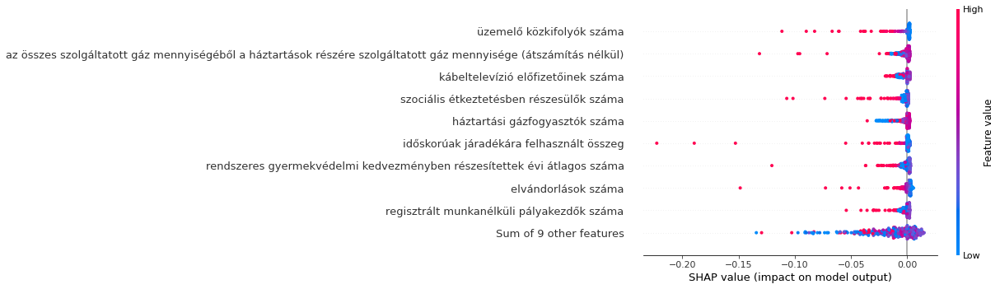

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

##### K=3

In [ ]:
K=3


KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

In [ ]:
features = list(data_lak_clus_full.columns)

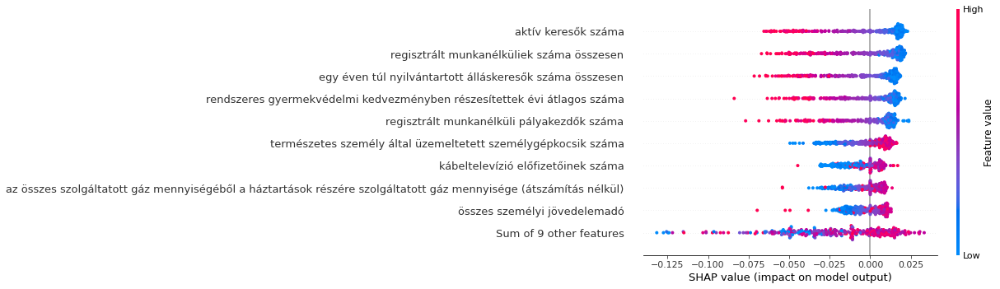

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

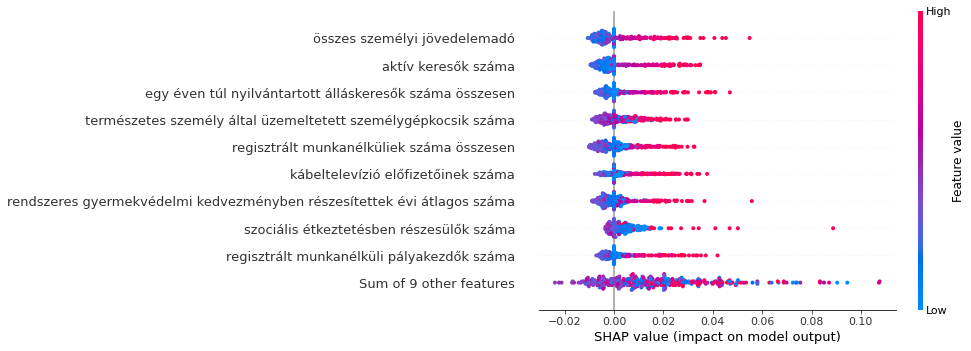

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

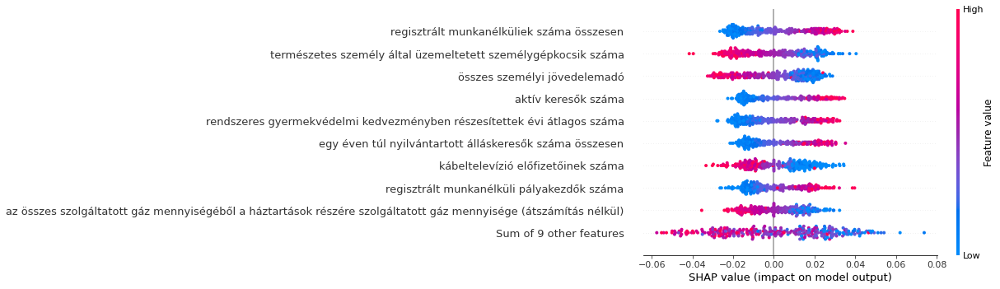

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

##### Térképfájlba írás

In [ ]:
telepulesek=[]
for i in data_lak_clus.index.values.tolist():
  telepulesek.append(i[0])
telepulesek[:5]

['Aba', 'Abaliget', 'Abasár', 'Abaújalpár', 'Abaújkér']

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X['klaszter'] = lak_pca['klaszter']
X['name'] = telepulesek
X.head()

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter,name
0,-0.557013,-0.671977,0.534615,-0.728267,-0.517836,0.075687,-0.573154,-0.117560,-0.219405,0.074772,-0.354494,-0.643333,-0.105659,-0.388684,-0.783704,-0.603504,0.112319,-0.414850,2,Aba
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581,3,Abaliget
2,0.993727,-0.571586,0.844407,-0.341616,-0.353005,0.714537,-0.182442,0.498072,-0.288474,0.435648,-0.457373,-0.560595,-0.746418,0.817221,-0.451231,1.544141,1.305191,-0.372665,2,Abasár
3,-1.131790,3.976572,-0.437236,2.255306,0.723757,0.007873,0.779072,-1.501669,-0.464262,-1.124073,-1.091888,2.924066,0.212040,0.035290,-0.840673,-0.569080,0.768317,2.459973,1,Abaújalpár
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058,3,Abaújkér


In [ ]:
X[X['klaszter']==2]

label,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter,name
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581,3,Abaliget
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058,3,Abaújkér
5,-2.042480,-0.116290,-1.482091,-0.517520,0.475815,-1.862985,-0.108976,-2.124457,-0.464262,-1.124073,-1.091888,-0.601030,-0.179599,-0.567209,0.455054,-1.250060,-0.024900,2.734234,3,Abaújlak
7,-0.057419,0.695852,-0.012696,0.478931,-0.430669,-0.446559,-0.057796,-0.378346,-0.179665,-0.583397,1.091063,0.433349,0.478778,-0.260973,-0.210172,-0.469484,-0.286300,0.106311,3,Abaújszántó
10,-1.117310,-0.077370,-1.482091,0.900083,0.443697,-1.862985,0.119000,-1.976414,-0.464262,-1.124073,0.065848,0.001297,0.133941,-0.560352,-0.840673,-1.101211,-0.521584,2.251722,3,Abod
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3131,-0.522709,-0.282324,0.773788,-0.351080,-0.293054,0.692554,-0.469737,-0.098303,-0.464262,0.036514,-0.018856,-0.632343,-0.205344,-0.631621,-0.269590,-1.068356,0.096470,-0.188478,3,Újszász
3133,0.488555,0.195401,-0.023475,-0.077680,-0.080483,0.358118,-0.347766,0.147930,0.190915,-0.433397,0.203494,0.286806,0.047767,-0.664389,1.118862,-1.200957,-0.192783,-0.155717,3,Újtikos
3146,0.115695,0.092174,0.304784,0.249602,0.338643,0.011661,-0.455750,-0.992225,-0.464262,0.261127,0.310197,0.064393,-0.052886,0.087384,-0.840673,0.205475,0.354211,-0.291353,3,Őrhalom
3149,-0.209615,0.422448,-0.953624,1.395930,0.890798,-0.824252,0.712772,-0.491425,0.382256,-0.168787,0.440607,0.677447,-0.167022,-0.199895,0.014407,-0.261432,0.696486,-0.360697,3,Őrtilos


In [ ]:
X_geo = X.merge(geoname, on='name')
X_geo.head()

,a háztartások részére szolgáltatott villamosenergia mennyisége,aktív keresők száma,az összes szolgáltatott gáz mennyiségéből a háztartások részére szolgáltatott gáz mennyisége (átszámítás nélkül),egy éven túl nyilvántartott álláskeresők száma összesen,elvándorlások száma,háztartási gázfogyasztók száma,háztartási villamosenergia fogyasztók száma,háztartásoknak szolgáltatott víz mennyisége,időskorúak járadékára felhasznált összeg,kábeltelevízió előfizetőinek száma,regisztrált munkanélküli pályakezdők száma,regisztrált munkanélküliek száma összesen,rendszeres gyermekvédelmi kedvezményben részesítettek évi átlagos száma,személygépkocsik száma,szociális étkeztetésben részesülők száma,természetes személy által üzemeltetett személygépkocsik száma,összes személyi jövedelemadó,üzemelő közkifolyók száma,klaszter,name,geonameid,geoid,wgs84_e_szelesseg,wgs84_k_hosszusag
0,-0.557013,-0.671977,0.534615,-0.728267,-0.517836,0.075687,-0.573154,-0.117560,-0.219405,0.074772,-0.354494,-0.643333,-0.105659,-0.388684,-0.783704,-0.603504,0.112319,-0.414850,2,Aba,9692,1512,47.034356,18.524755
1,0.791423,-0.361889,-1.482091,-0.483076,-0.041495,-1.862985,0.662283,0.656828,-0.464262,-0.947873,0.270038,0.138945,-0.100001,0.437480,-0.638031,0.819765,0.504750,-0.306581,3,Abaliget,16239,1035,46.143846,18.118111
2,0.993727,-0.571586,0.844407,-0.341616,-0.353005,0.714537,-0.182442,0.498072,-0.288474,0.435648,-0.457373,-0.560595,-0.746418,0.817221,-0.451231,1.544141,1.305191,-0.372665,2,Abasár,10360,2209,47.800687,20.008398
3,-1.131790,3.976572,-0.437236,2.255306,0.723757,0.007873,0.779072,-1.501669,-0.464262,-1.124073,-1.091888,2.924066,0.212040,0.035290,-0.840673,-0.569080,0.768317,2.459973,1,Abaújalpár,17191,1341,48.306147,21.234097
4,-0.778544,-0.252784,-0.365816,0.140931,-0.205110,-0.602137,-0.448961,-0.952785,-0.464262,-0.453012,0.809988,0.418555,0.877114,-0.881019,1.451481,-1.585936,-0.998495,1.332058,3,Abaújkér,10500,2420,48.305038,21.200221


In [ ]:
file_old = '/content/drive/My Drive/Temalabor1/momap.geojson'
file_new = '/content/drive/My Drive/Diplomamunka/klaszter3_2010_lak.geojson'

import json
with open(file_old, 'r') as f:
    data = json.load(f)

for feature in data['features']:
    geoid2 = feature['properties']['geoid']
    if len(X_geo[X_geo['geoid'] == geoid2]['klaszter']) == 0:
      del feature
    else:
      feature['properties']['klaszter'] = X_geo[X_geo.geoid == geoid2]['klaszter'].item()
      feature['properties']['varos'] = str(X_geo[X_geo.geoid == geoid2]['name'].item())

with open(file_new, 'w+') as f:
    json.dump(data, f, indent=2)

### 2 főkomponens

In [ ]:
pca = PCA(n_components=2)

X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.values
principalComponents = pca.fit_transform(X)

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2'])
lak_pca.head()

,PC1,PC2
0,0.635688,-1.689070
1,0.239387,0.508891
2,2.687525,0.074604
3,-3.662084,2.328667
4,-2.417690,-0.276516


In [ ]:
print('Az egyes komponensek által megmagyarázott szórás:', pca.explained_variance_ratio_)
print('\n Teljes megmagyarázott szórás:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Az egyes komponensek által megmagyarázott szórás: [0.35080134 0.11502203]

 Teljes megmagyarázott szórás: 46.58


#### Silhoutte

In [ ]:
X = lak_pca.iloc[:]

In [ ]:
X

,PC1,PC2
0,0.635688,-1.689070
1,0.239387,0.508891
2,2.687525,0.074604
3,-3.662084,2.328667
4,-2.417690,-0.276516
...,...,...
3147,2.013860,1.574835
3148,1.842605,-0.033052
3149,-1.354992,0.768081
3150,2.048452,-0.603907


##### K-közép

For n_clusters = 2 The average silhouette_score is : 0.4891891264977465
For n_clusters = 3 The average silhouette_score is : 0.5090060476271012
For n_clusters = 4 The average silhouette_score is : 0.4147794699255786
For n_clusters = 5 The average silhouette_score is : 0.37356627134535814
For n_clusters = 6 The average silhouette_score is : 0.3917617055784999
For n_clusters = 7 The average silhouette_score is : 0.3567135707084551
For n_clusters = 8 The average silhouette_score is : 0.3679605940129485
For n_clusters = 9 The average silhouette_score is : 0.3717169216276844
For n_clusters = 10 The average silhouette_score is : 0.3314683166529044


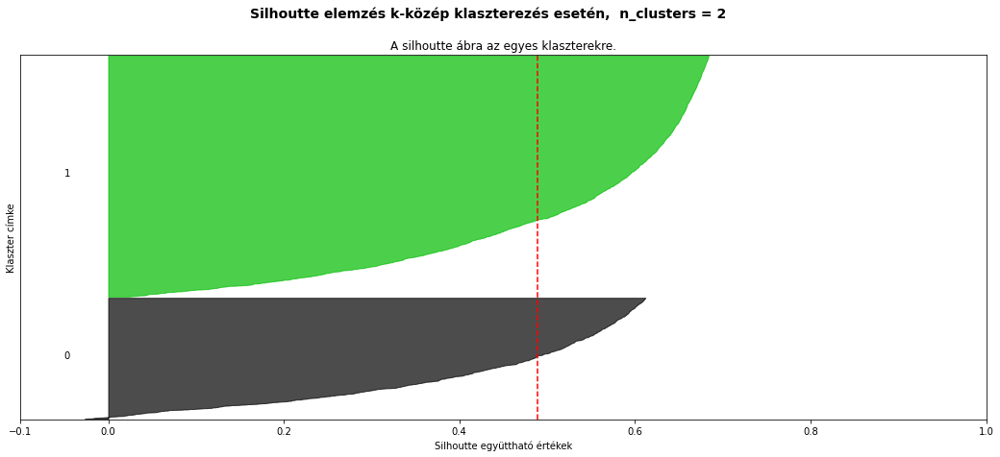

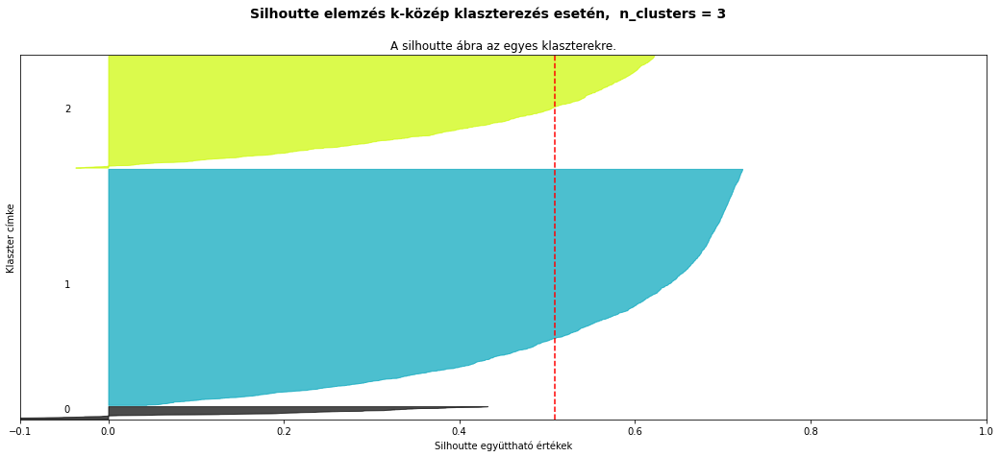

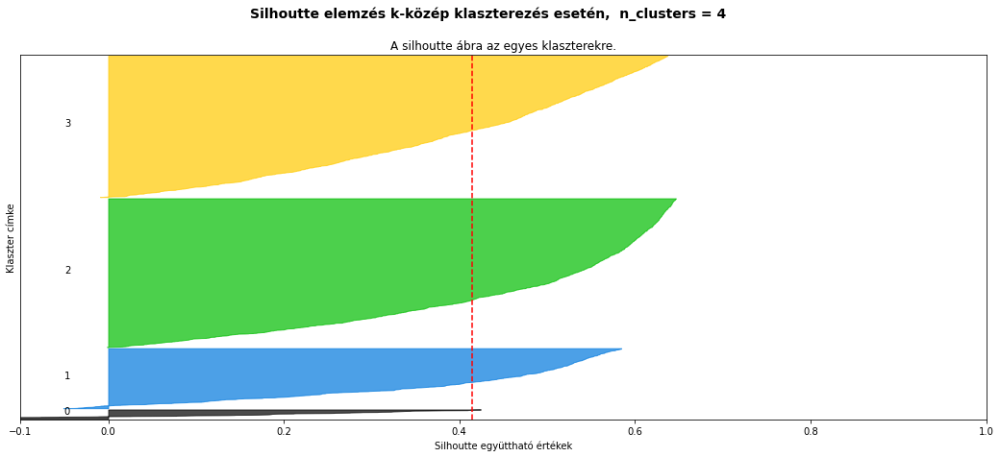

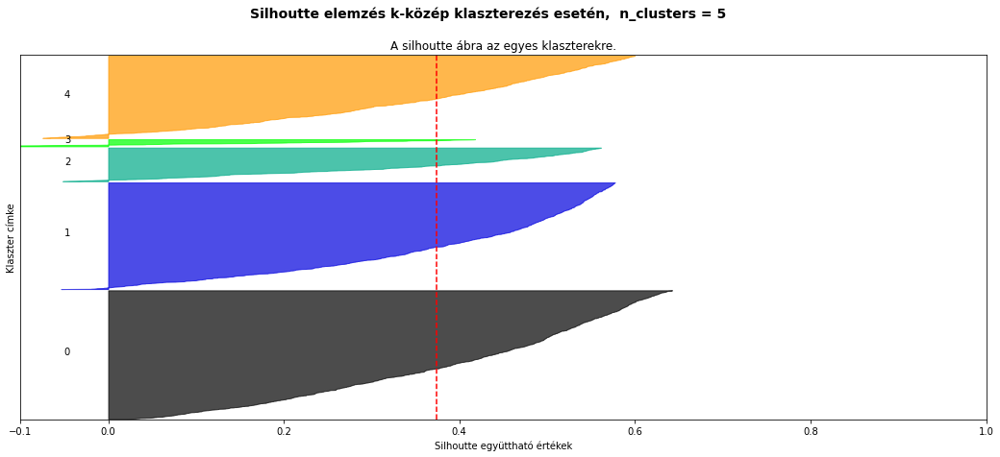

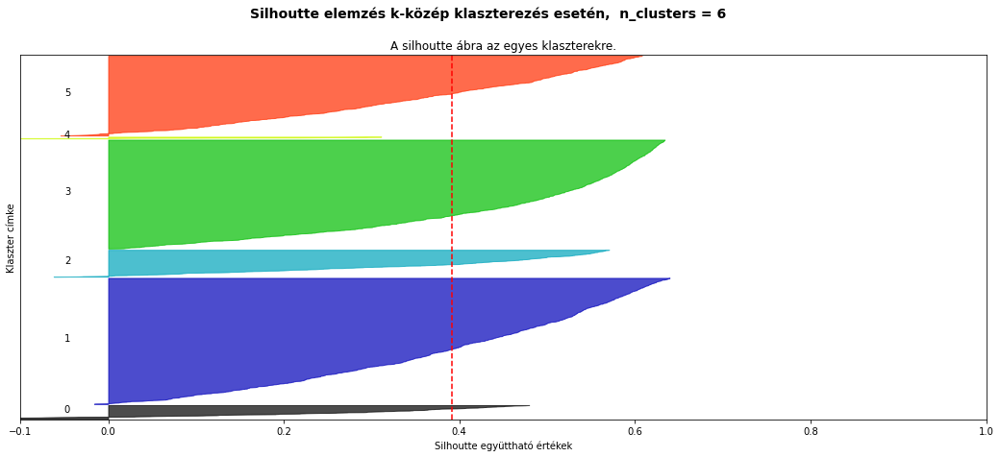

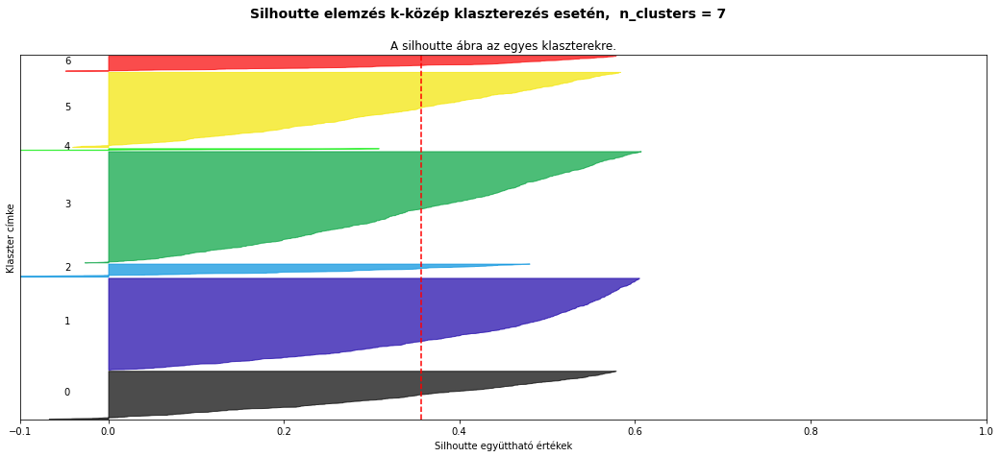

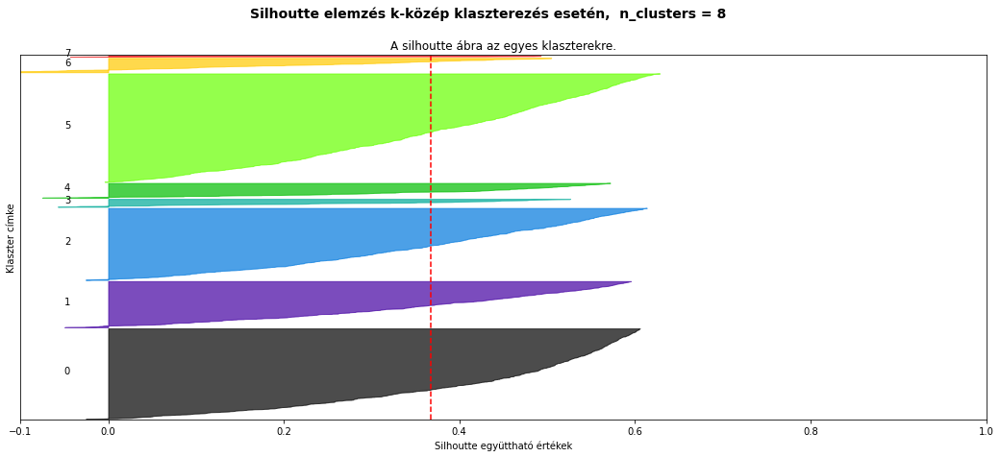

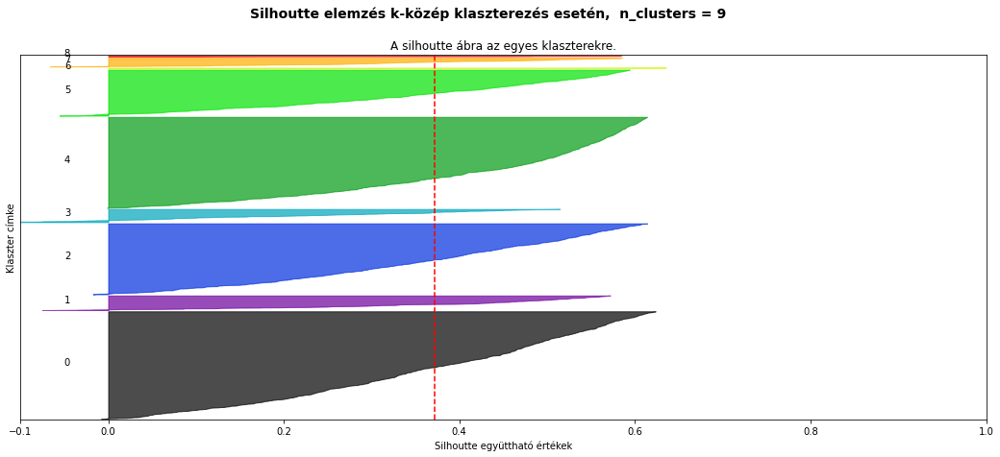

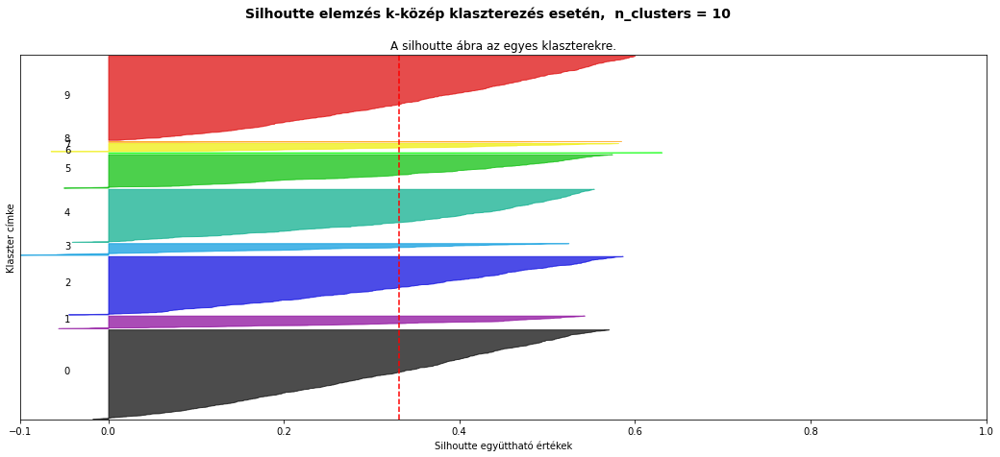

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés k-közép klaszterezés esetén, "
                  " n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Spektrális klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.44708542755514463
For n_clusters = 3 The average silhouette_score is : 0.36477076232542427
For n_clusters = 4 The average silhouette_score is : 0.26770055871075654
For n_clusters = 5 The average silhouette_score is : 0.27807068653242856
For n_clusters = 6 The average silhouette_score is : 0.24550705183029597
For n_clusters = 7 The average silhouette_score is : 0.25422616468084797
For n_clusters = 8 The average silhouette_score is : 0.2594926140077362
For n_clusters = 9 The average silhouette_score is : 0.26142317764542483
For n_clusters = 10 The average silhouette_score is : 0.2748012673729807


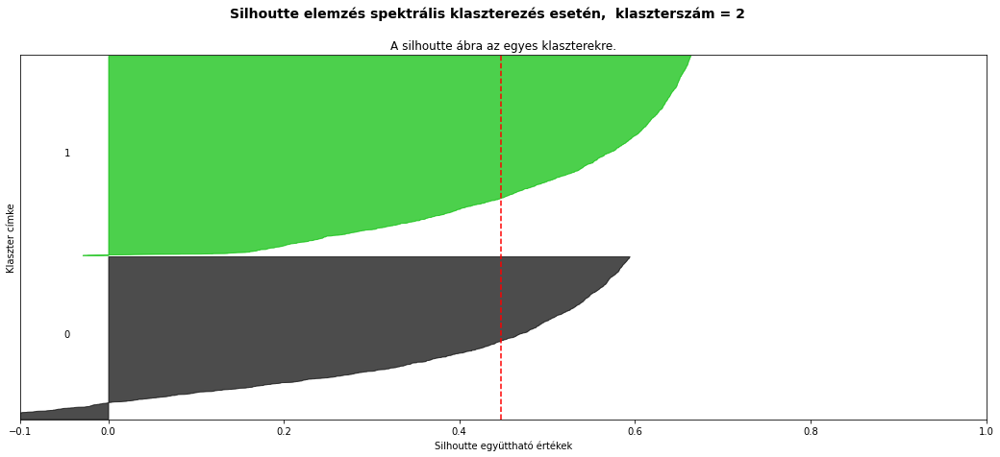

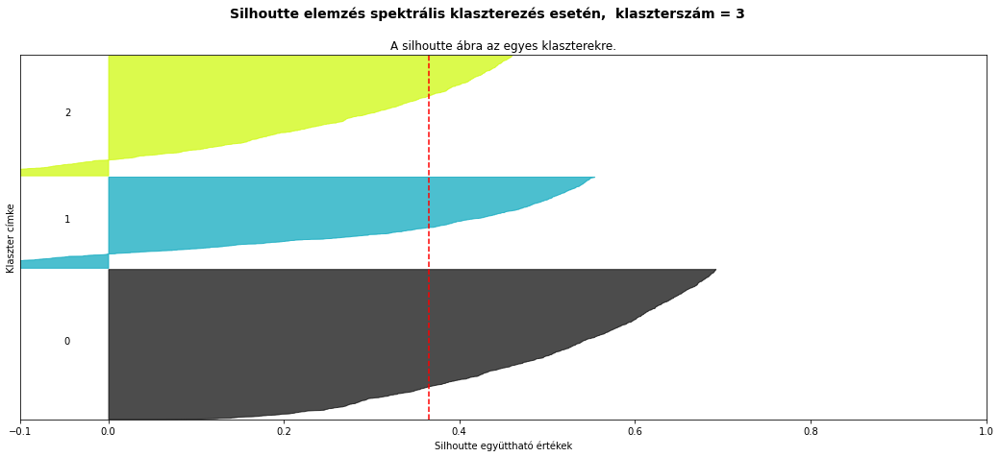

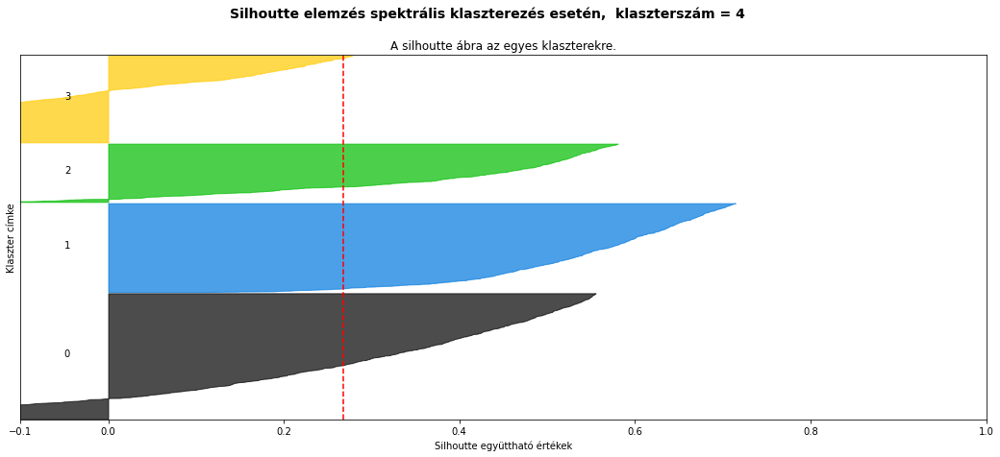

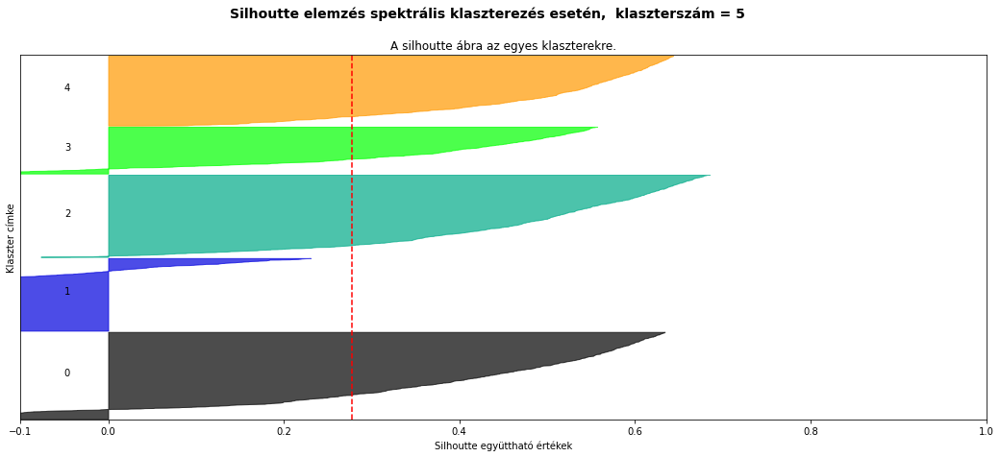

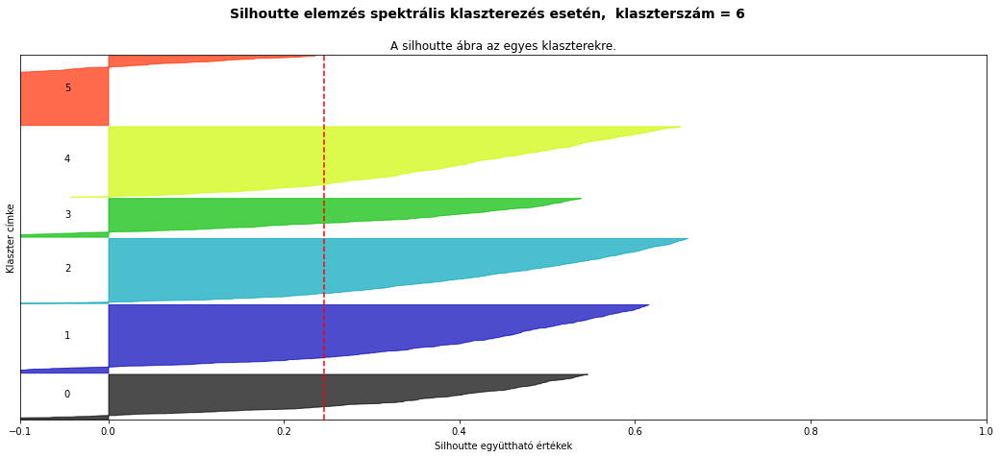

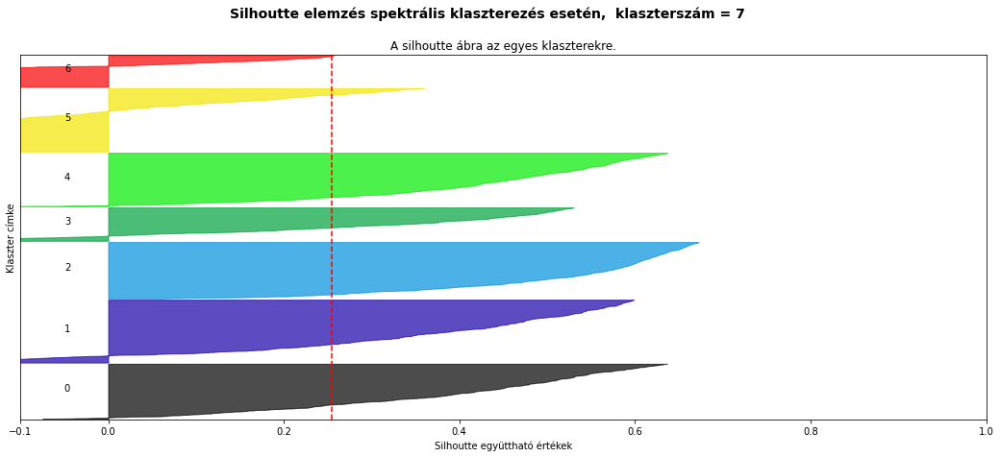

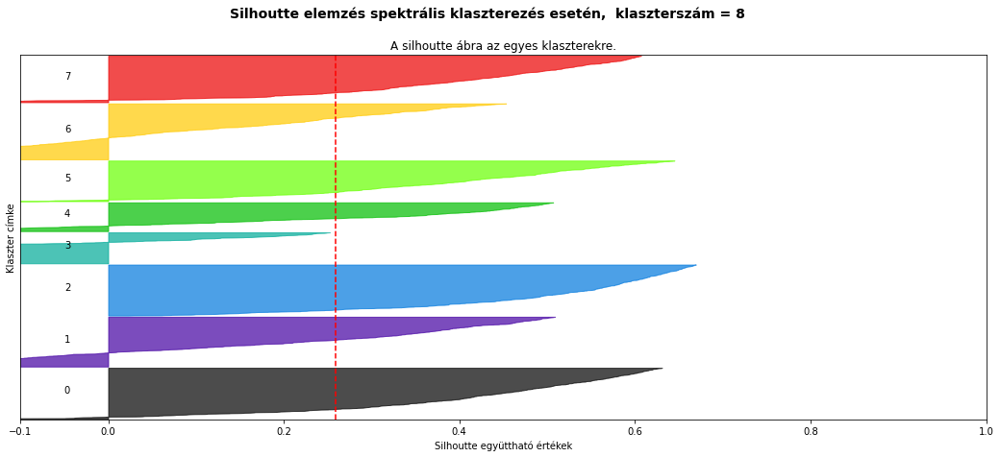

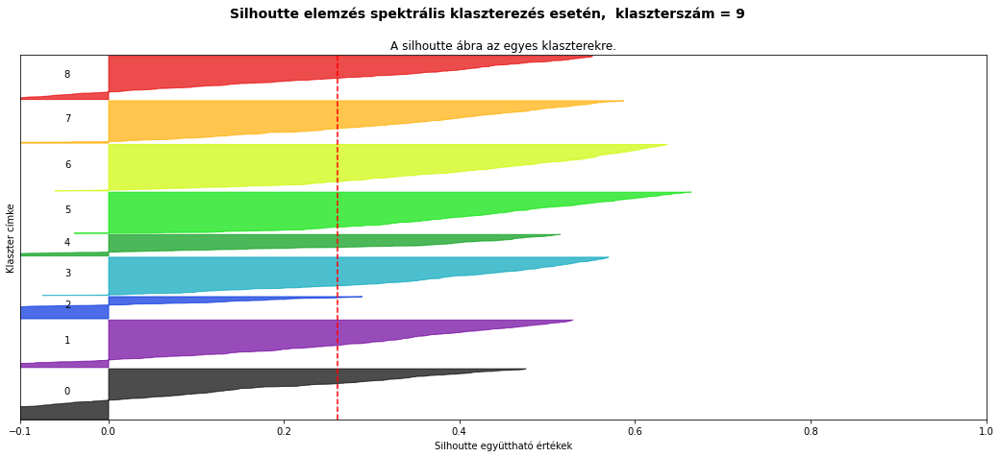

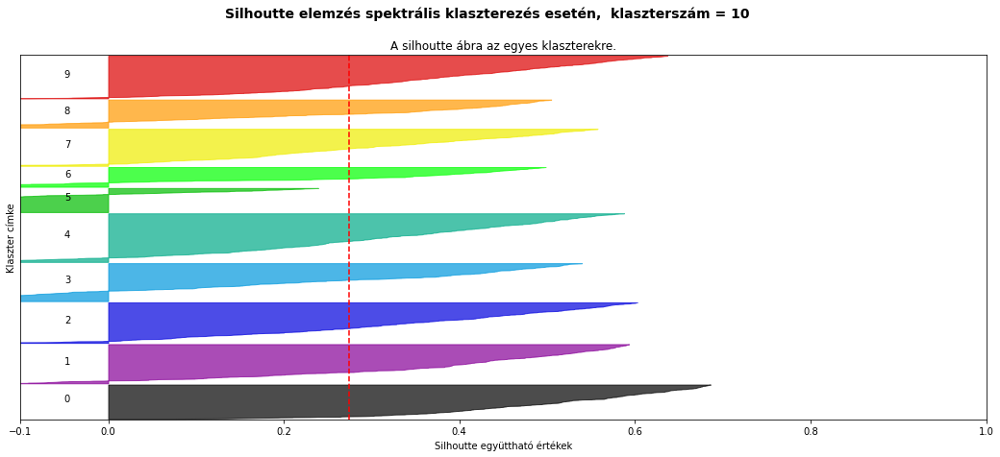

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = SpectralClustering(
    n_clusters=n_clusters, 
    random_state=25,  
    affinity='nearest_neighbors')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés spektrális klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Hierarchikus klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.39543778955692155
For n_clusters = 3 The average silhouette_score is : 0.3689932465773212
For n_clusters = 4 The average silhouette_score is : 0.3967976184720915
For n_clusters = 5 The average silhouette_score is : 0.4012535368343852
For n_clusters = 6 The average silhouette_score is : 0.31955182080146455
For n_clusters = 7 The average silhouette_score is : 0.32481983252842617
For n_clusters = 8 The average silhouette_score is : 0.29769960386890276
For n_clusters = 9 The average silhouette_score is : 0.29899108464666313
For n_clusters = 10 The average silhouette_score is : 0.3068312281489262


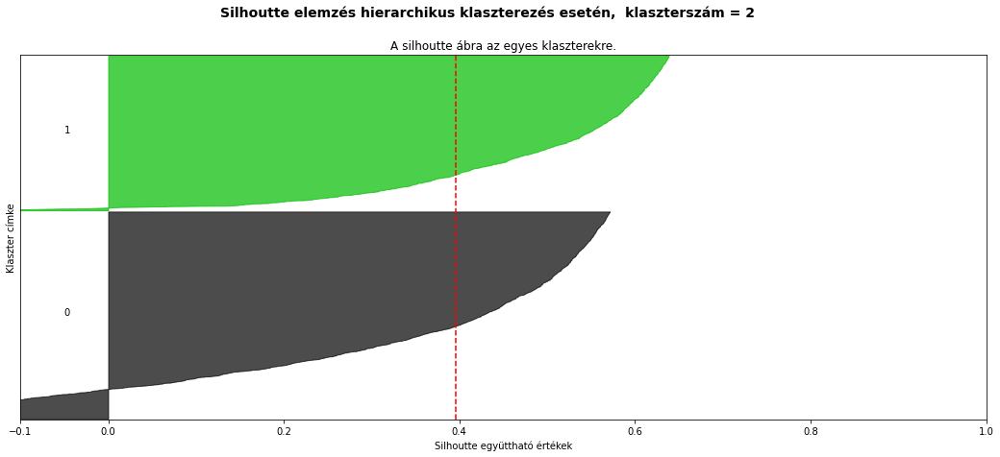

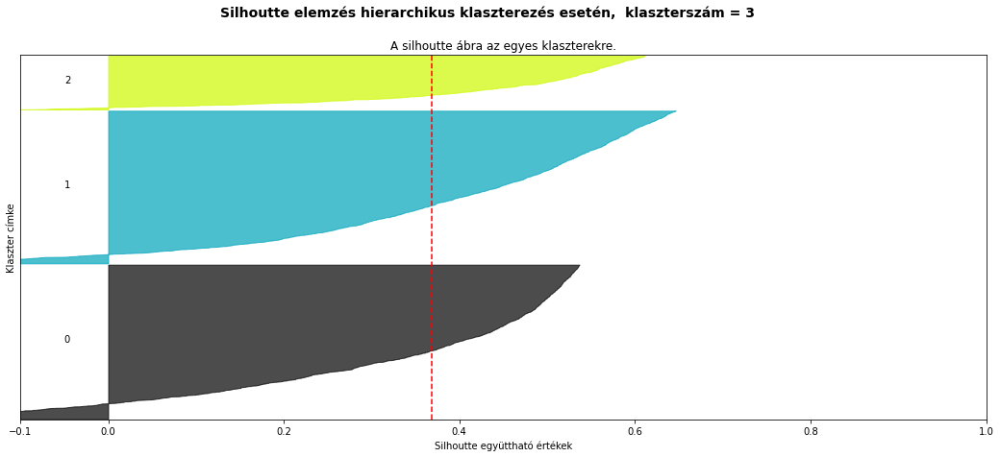

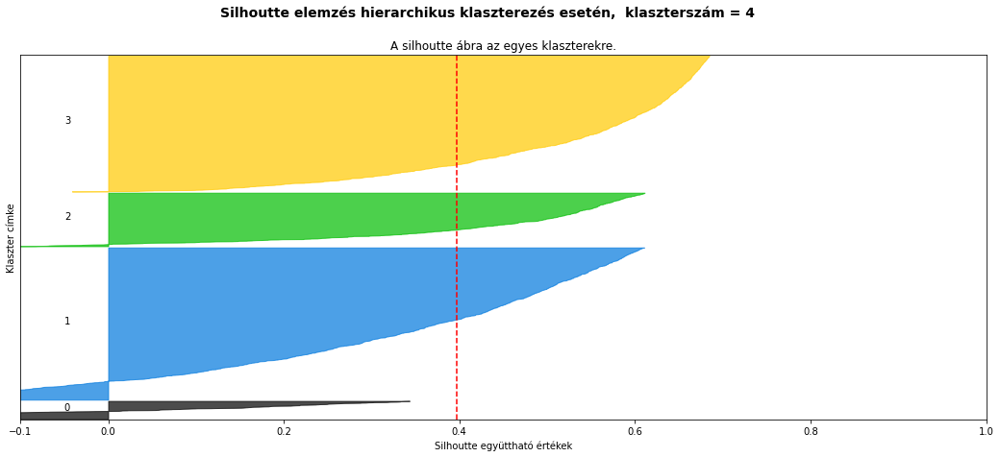

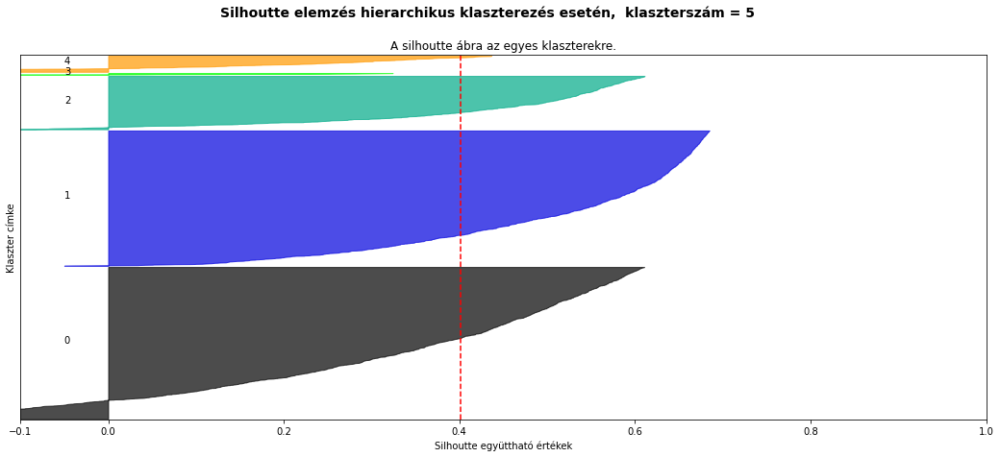

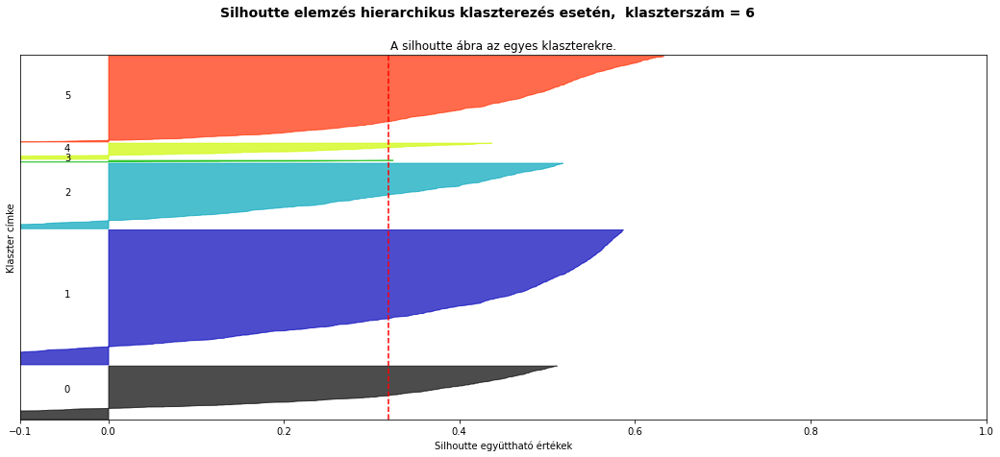

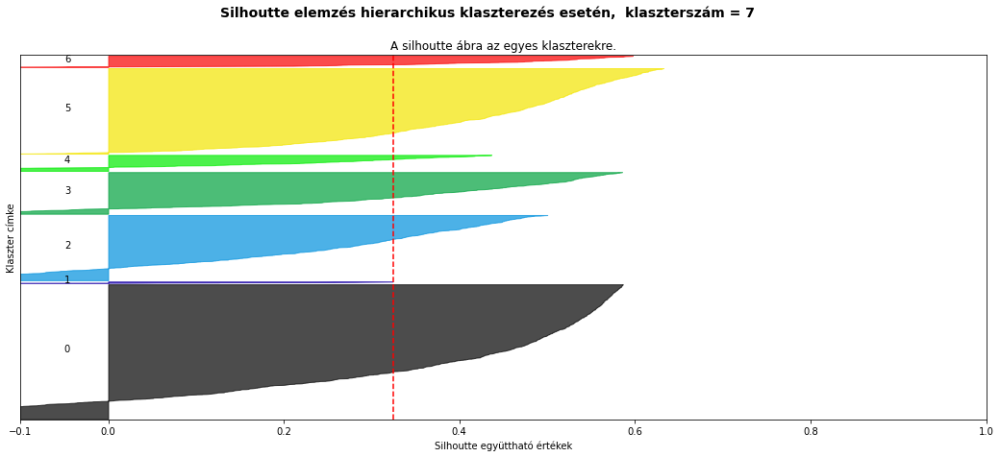

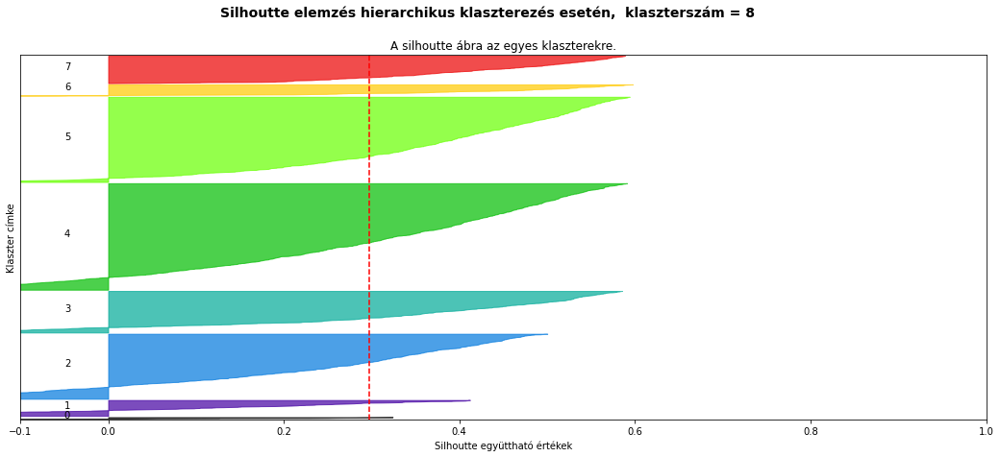

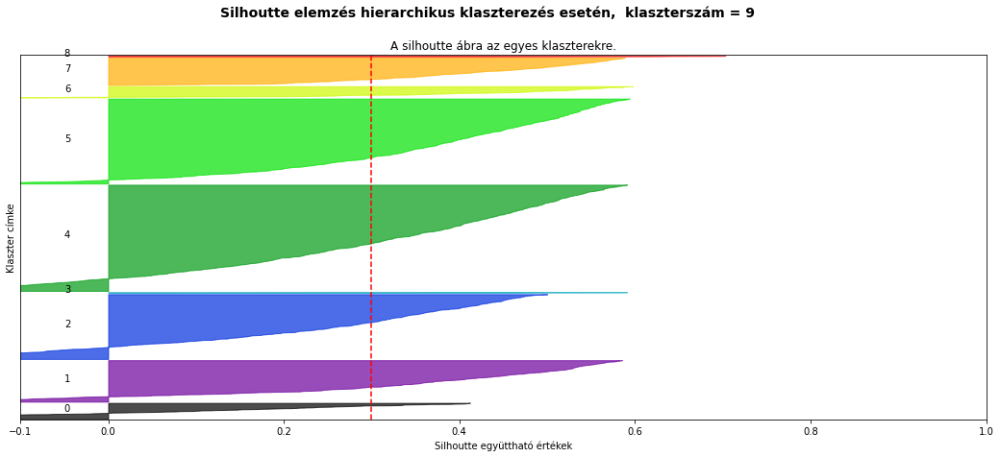

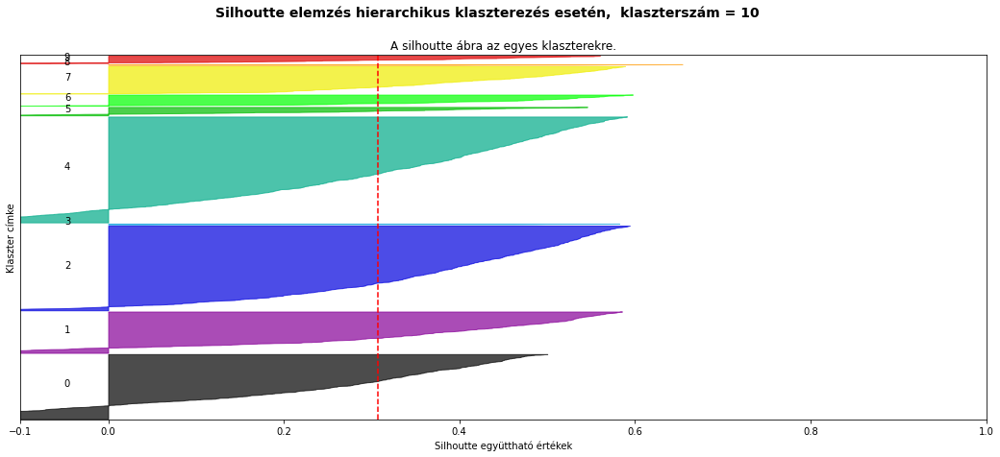

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters = n_clusters, affinity = 'euclidean', linkage ='ward')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés hierarchikus klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [ ]:
K=5


KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

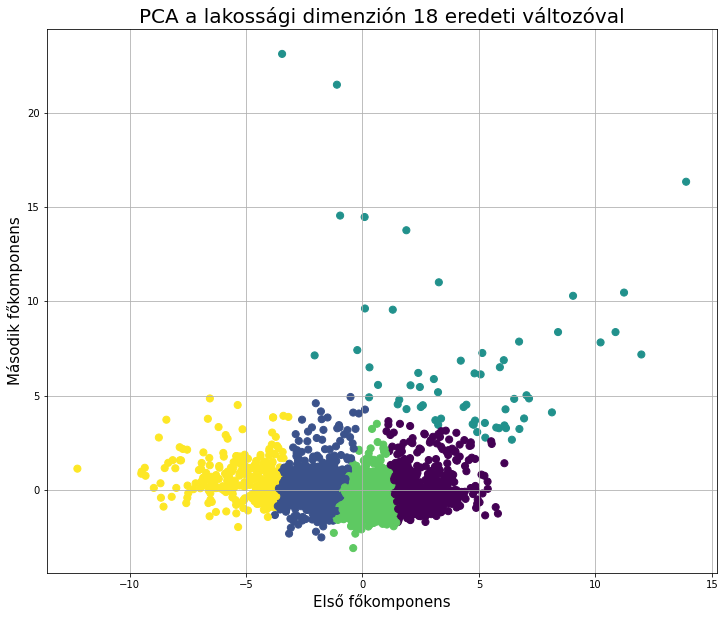

In [ ]:
fig = plt.figure(figsize = (12,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Első főkomponens', fontsize = 15)
ax.set_ylabel('Második főkomponens', fontsize = 15)
ax.set_title('PCA a lakossági dimenzión 18 eredeti változóval', fontsize = 20)

ax.scatter(lak_pca['PC1'], lak_pca['PC2'], s=50, c=lak_pca['klaszter'])

ax.grid()

#### Shapley

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.to_numpy()
y = lak_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.02)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/63 [00:00<?, ?it/s]

In [ ]:
clusterShapley._predict_proba(list(data_lak_clus_full_scaled.iloc[0, :18]))

array([[0.13949459, 0.12920344, 0.40437005, 0.07956332, 0.2473686 ],
       [0.14319365, 0.13481568, 0.39007991, 0.0921455 , 0.23976525],
       [0.15459235, 0.13981188, 0.32383786, 0.12935679, 0.25240112],
       [0.14502102, 0.13743086, 0.38345283, 0.0976052 , 0.23649008],
       [0.13828474, 0.12723886, 0.40942616, 0.07479924, 0.25025101],
       [0.13201331, 0.10980029, 0.42922692, 0.04890165, 0.28005784],
       [0.14000392, 0.130008  , 0.40231015, 0.08145352, 0.24622441],
       [0.13187623, 0.11113595, 0.45122037, 0.02309587, 0.28267159],
       [0.13222932, 0.11389222, 0.44613262, 0.0319032 , 0.27584264],
       [0.13199923, 0.10978278, 0.42939562, 0.04872275, 0.28009962],
       [0.1340162 , 0.11924217, 0.43073112, 0.0522422 , 0.26376831],
       [0.14226215, 0.13344744, 0.39355104, 0.08919706, 0.24154231],
       [0.13182467, 0.11086118, 0.45103053, 0.0231958 , 0.28308781],
       [0.13476217, 0.12084125, 0.42633263, 0.05730083, 0.26076312],
       [0.14679908, 0.13990112, 0.

In [ ]:
list(data_lak_clus_full_scaled.iloc[0, :18])

[-0.5570125698951186,
 -0.6719769836162144,
 0.5346154518203371,
 -0.728267239284102,
 -0.5178357750269641,
 0.0756874518113902,
 -0.5731543228391035,
 -0.11755964338222918,
 -0.2194049716857974,
 0.07477210024780016,
 -0.3544938970514427,
 -0.6433332218244686,
 -0.10565889712035463,
 -0.3886839417901214,
 -0.7837043737869599,
 -0.6035044990125523,
 0.11231907043331753,
 -0.4148499514823258]

In [ ]:
features = list(data_lak_clus_full.columns)

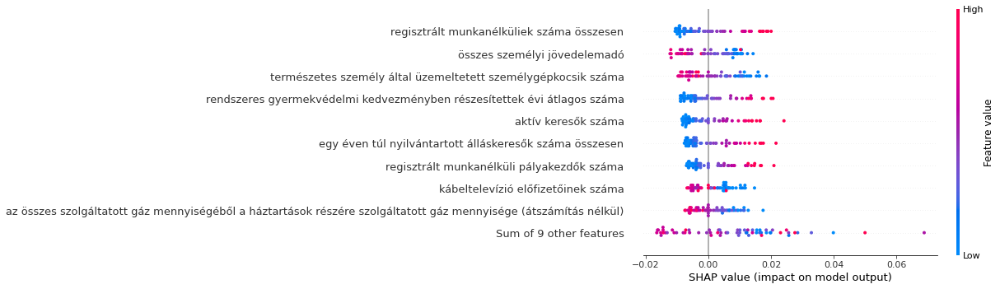

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

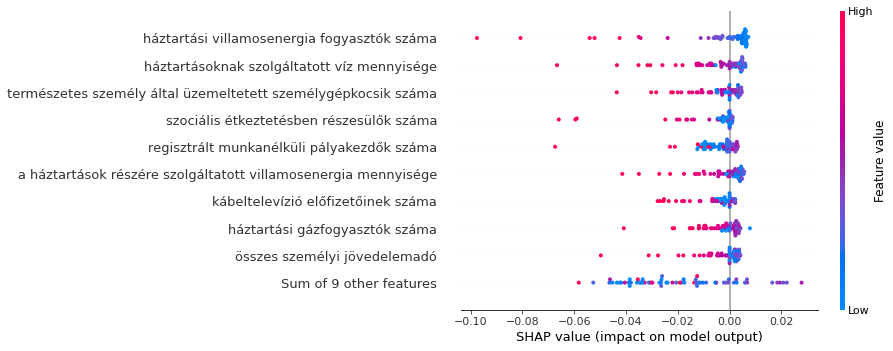

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

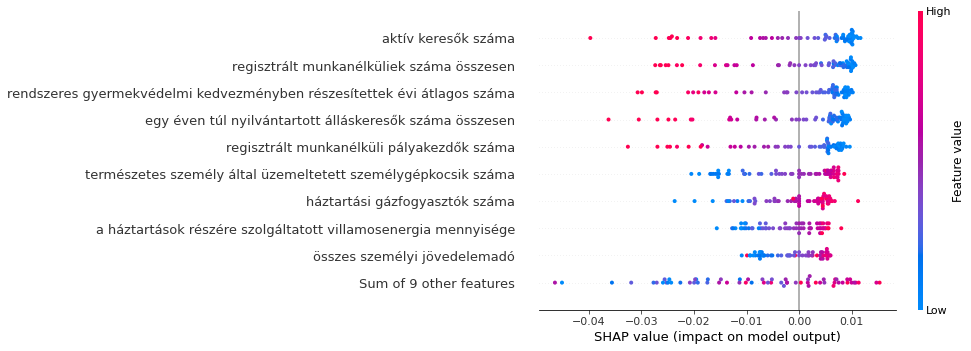

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

### 6 főkomponens

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.values

In [ ]:
pca = PCA(n_components=6)

principalComponents = pca.fit_transform(X)

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])
lak_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,0.635683,-1.689708,0.112992,0.165720,-0.425240,0.448828
1,0.239392,0.508629,-1.623159,0.416904,1.750333,-1.007519
2,2.687530,0.075492,0.485004,0.487450,0.715316,-0.127847
3,-3.662095,2.330926,0.424847,2.416478,-0.394040,0.366343
4,-2.417694,-0.277747,-0.608852,-0.642900,-1.911928,-0.585306


In [ ]:
print('Az egyes komponensek által megmagyarázott szórás:', pca.explained_variance_ratio_)
print('\n Teljes megmagyarázott szórás:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Az egyes komponensek által megmagyarázott szórás: [0.35080134 0.11502208 0.07777427 0.0625279  0.05825847 0.04972791]

 Teljes megmagyarázott szórás: 71.41


Így eléri a 70%-os magyarázott varianciát.

#### Silhoutte

In [ ]:
X = lak_pca.iloc[:]

##### K-közép

For n_clusters = 2 The average silhouette_score is : 0.3526562998857953
For n_clusters = 3 The average silhouette_score is : 0.23293698686122996
For n_clusters = 4 The average silhouette_score is : 0.2447632934663366
For n_clusters = 5 The average silhouette_score is : 0.24834337619206343
For n_clusters = 6 The average silhouette_score is : 0.2008220209561662
For n_clusters = 7 The average silhouette_score is : 0.20497626636566701
For n_clusters = 8 The average silhouette_score is : 0.2010886937930287
For n_clusters = 9 The average silhouette_score is : 0.18011401043177222
For n_clusters = 10 The average silhouette_score is : 0.1776049193030832


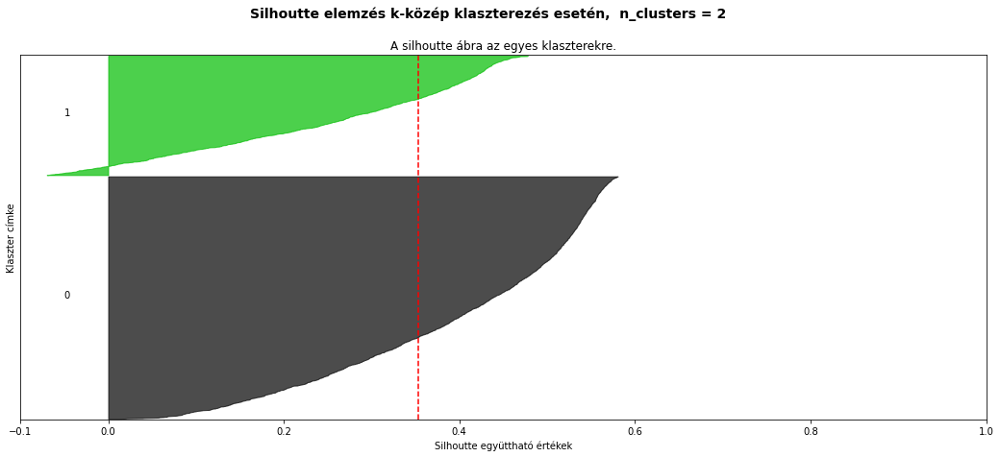

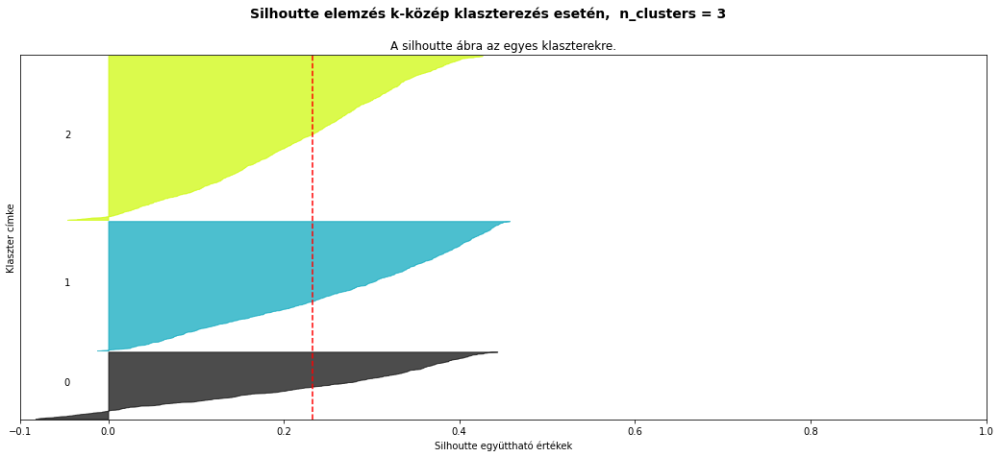

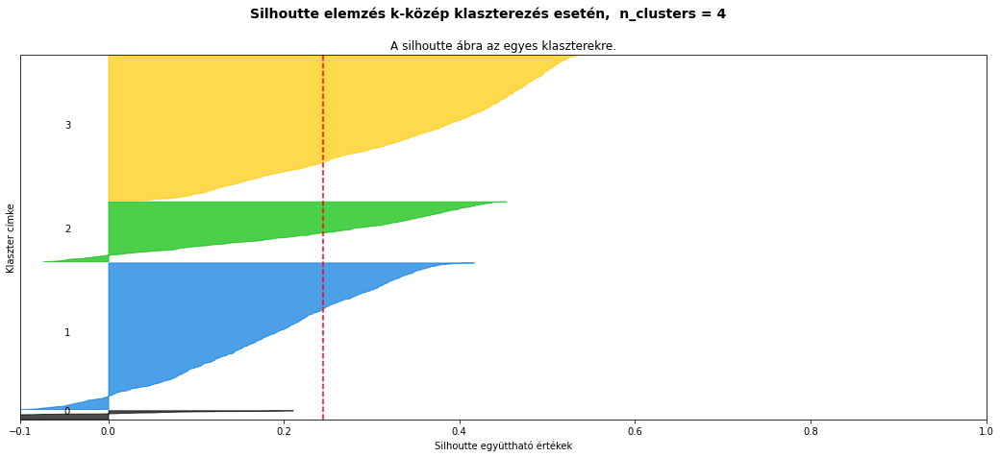

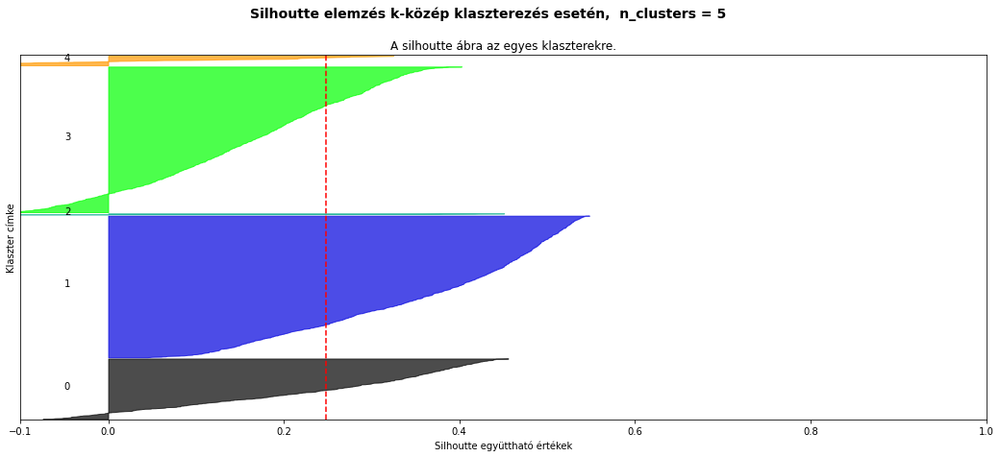

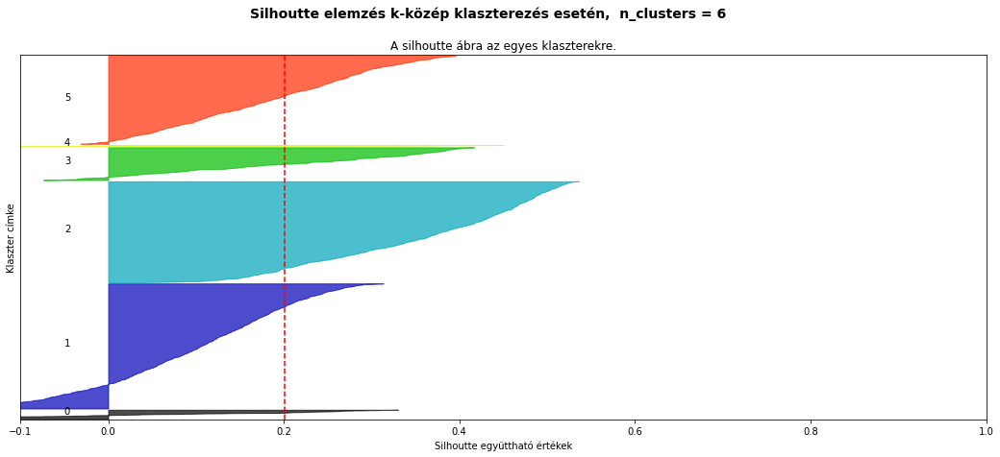

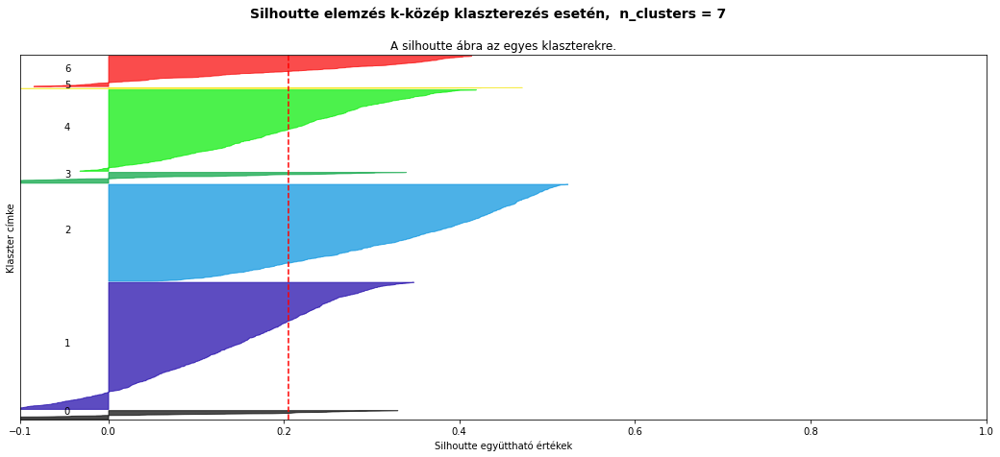

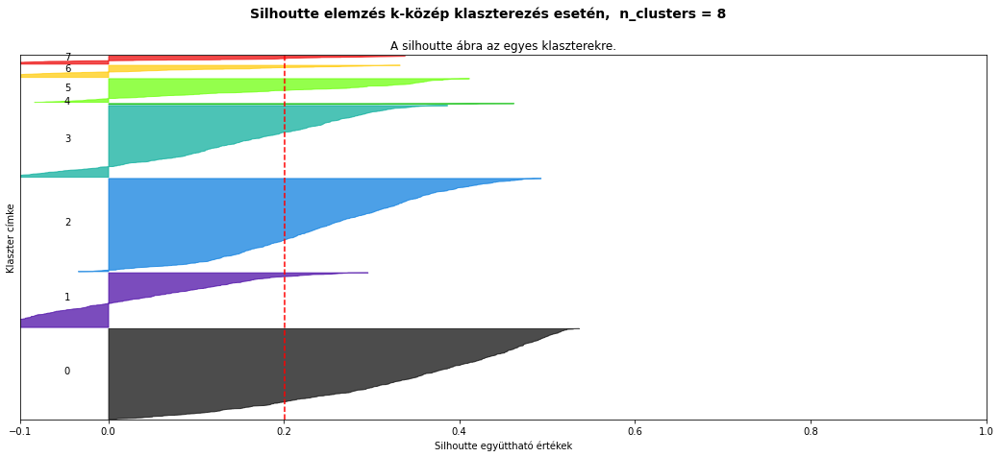

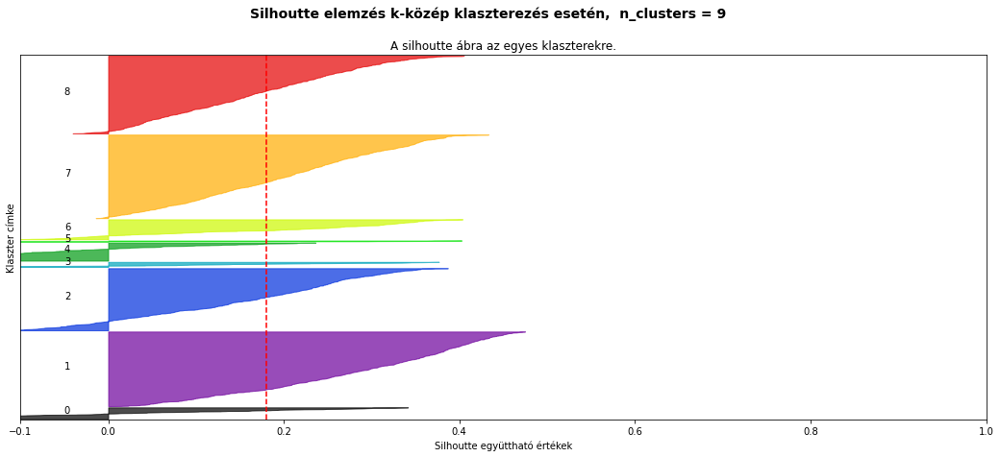

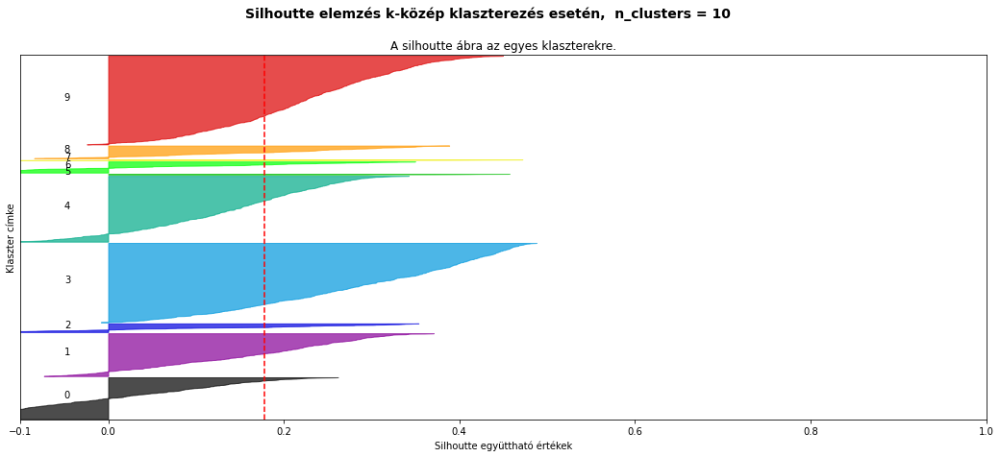

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés k-közép klaszterezés esetén, "
                  " n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Spektrális klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.33732162741077026
For n_clusters = 3 The average silhouette_score is : 0.22424309440039145
For n_clusters = 4 The average silhouette_score is : 0.17905843736376534
For n_clusters = 5 The average silhouette_score is : 0.16703677384622145
For n_clusters = 6 The average silhouette_score is : 0.12270843450113868
For n_clusters = 7 The average silhouette_score is : 0.1166698115944054
For n_clusters = 8 The average silhouette_score is : 0.12113250962647394
For n_clusters = 9 The average silhouette_score is : 0.12411191248786006
For n_clusters = 10 The average silhouette_score is : 0.10995892942649901


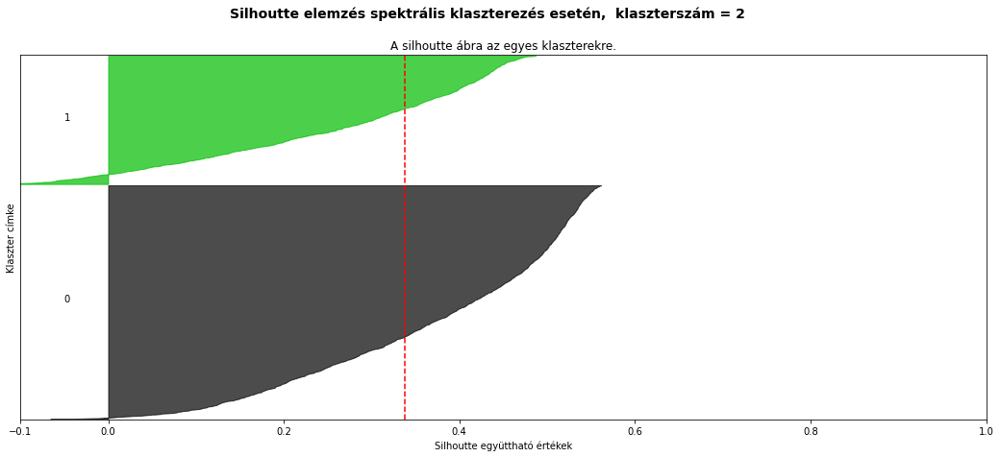

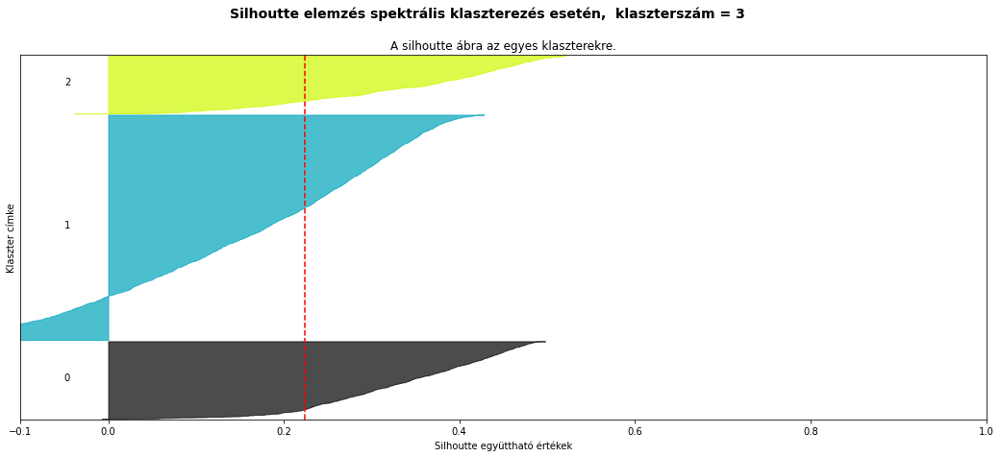

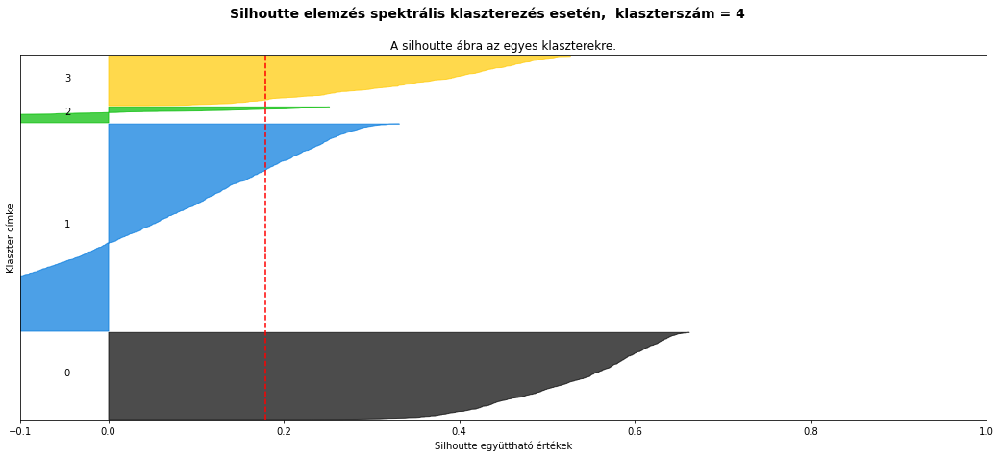

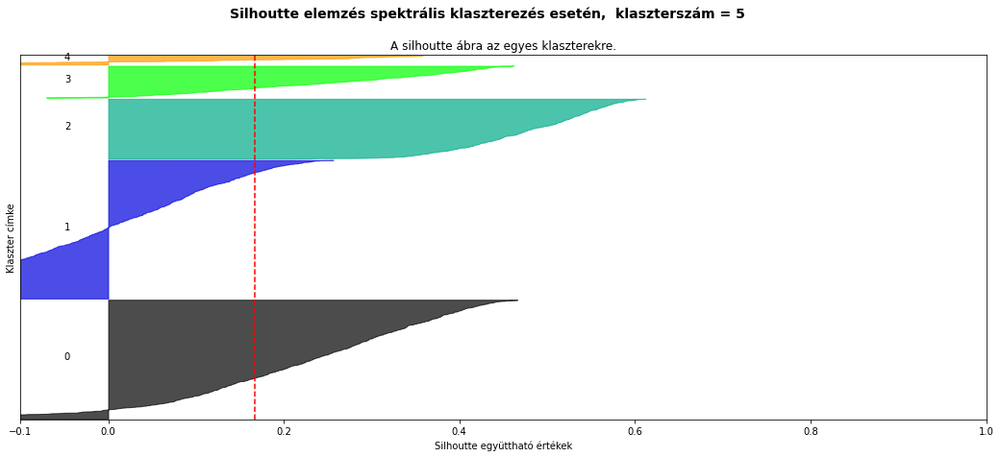

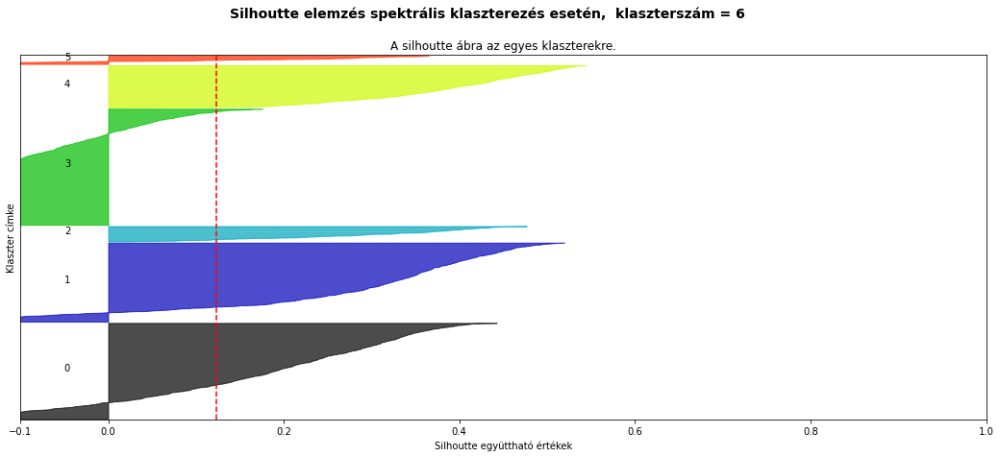

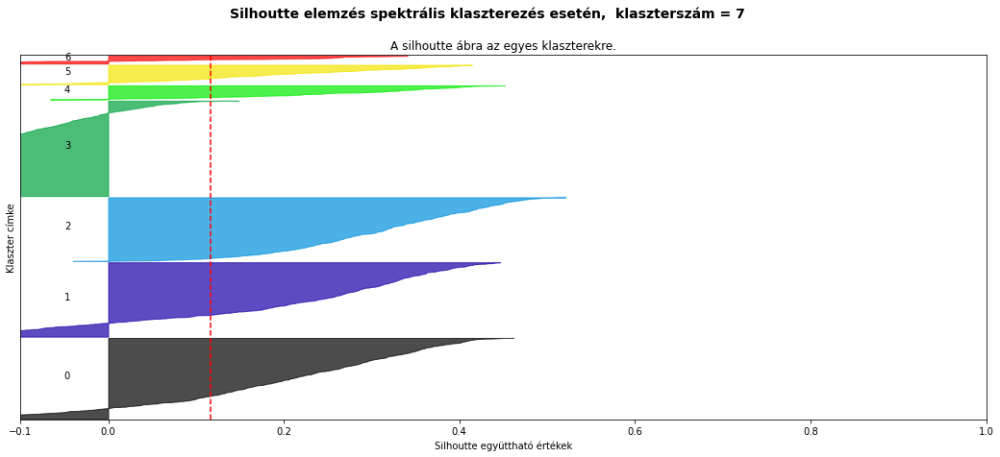

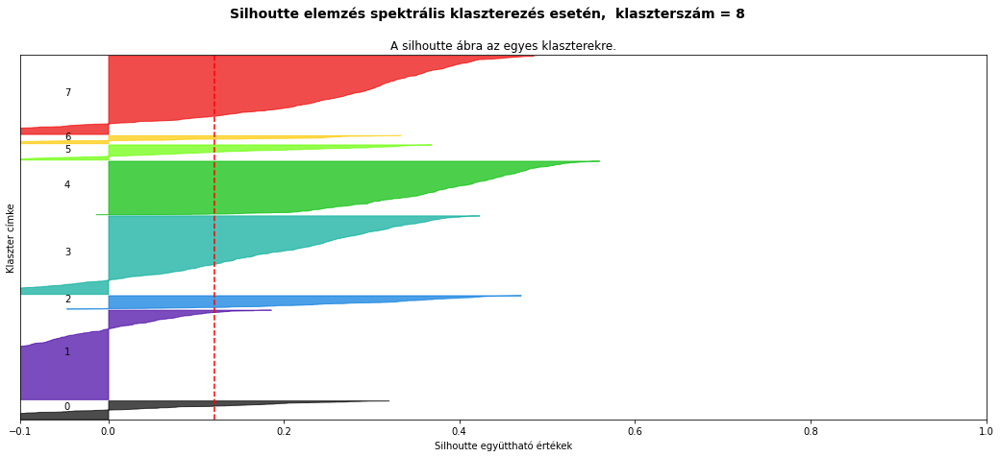

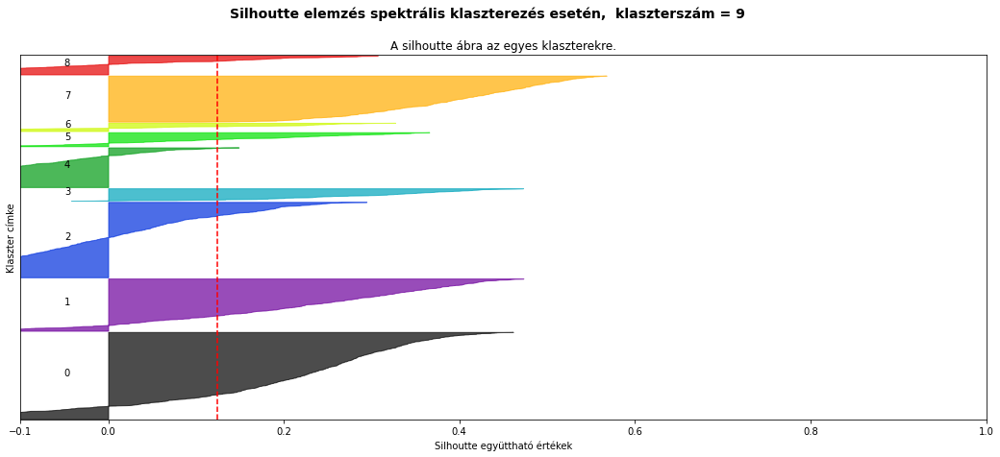

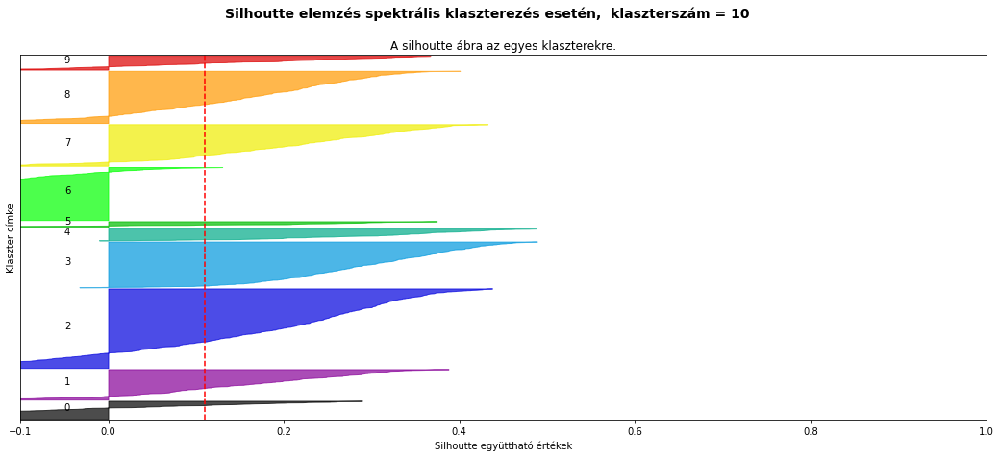

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = SpectralClustering(
    n_clusters=n_clusters, 
    random_state=25,  
    affinity='nearest_neighbors')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés spektrális klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Hierarchikus klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.37665182475535147
For n_clusters = 3 The average silhouette_score is : 0.19923207675299132
For n_clusters = 4 The average silhouette_score is : 0.19730143038729422
For n_clusters = 5 The average silhouette_score is : 0.20207311574944545
For n_clusters = 6 The average silhouette_score is : 0.2035270646835496
For n_clusters = 7 The average silhouette_score is : 0.20920356670265888
For n_clusters = 8 The average silhouette_score is : 0.12540538680454866
For n_clusters = 9 The average silhouette_score is : 0.133856499464289
For n_clusters = 10 The average silhouette_score is : 0.13365135243864545


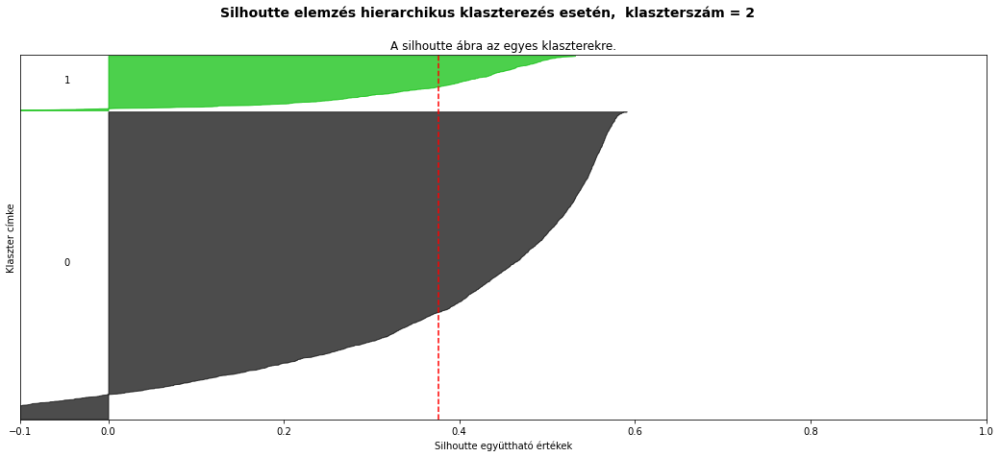

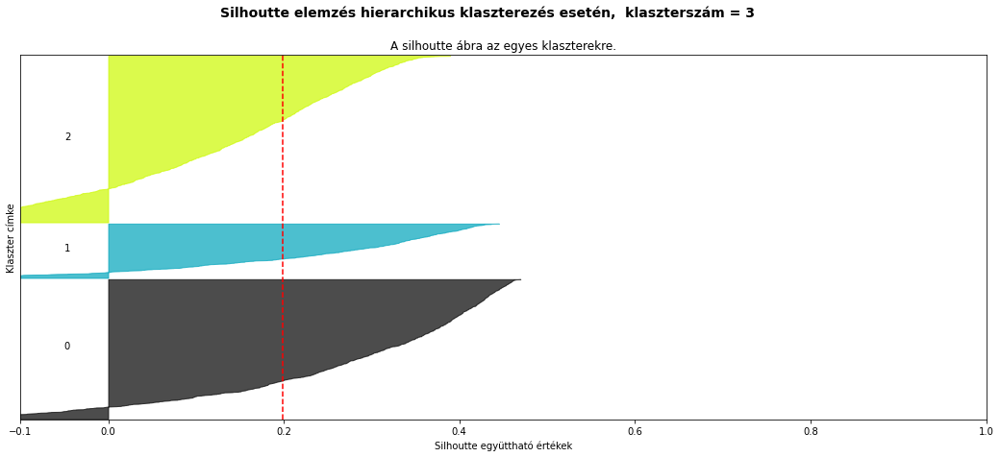

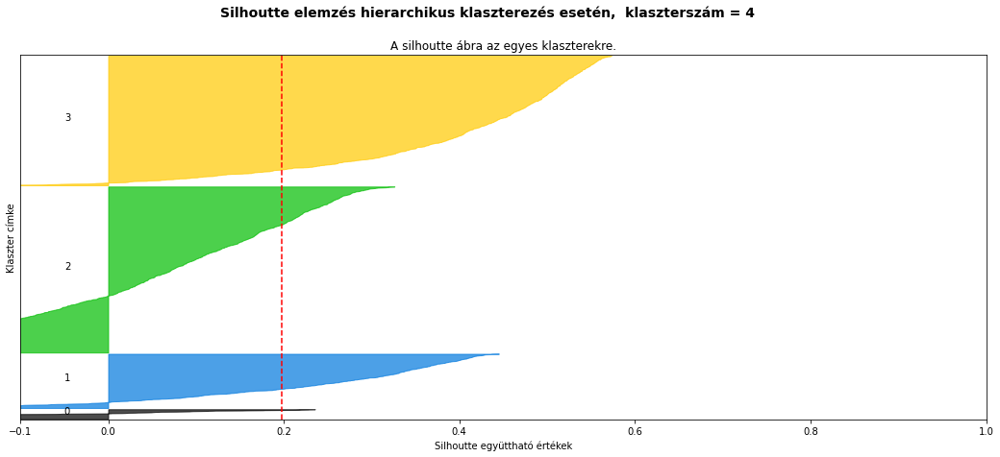

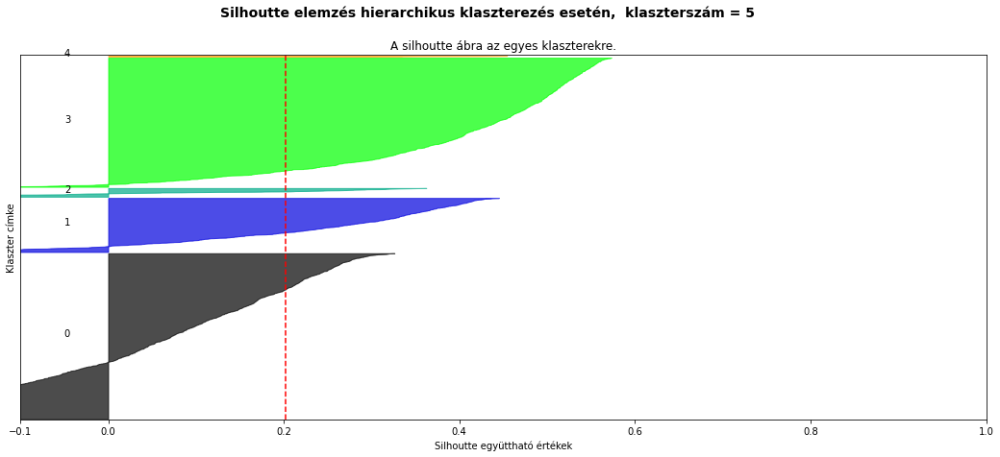

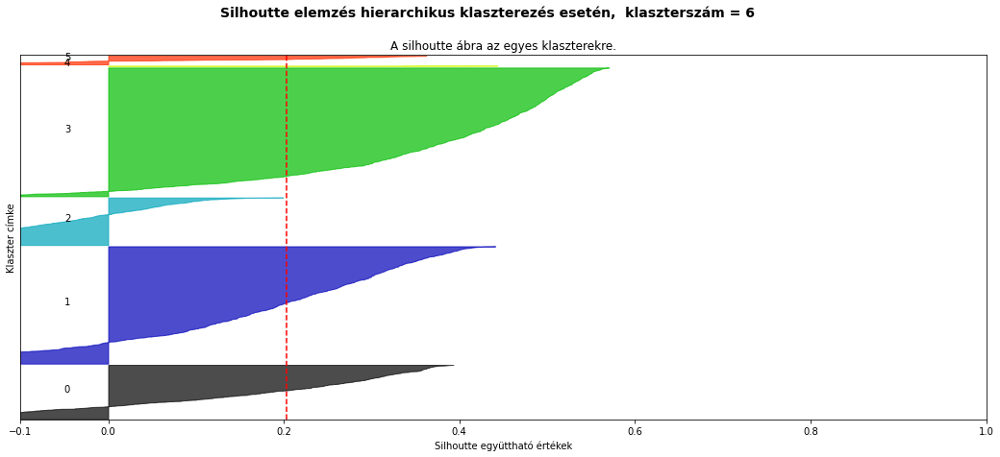

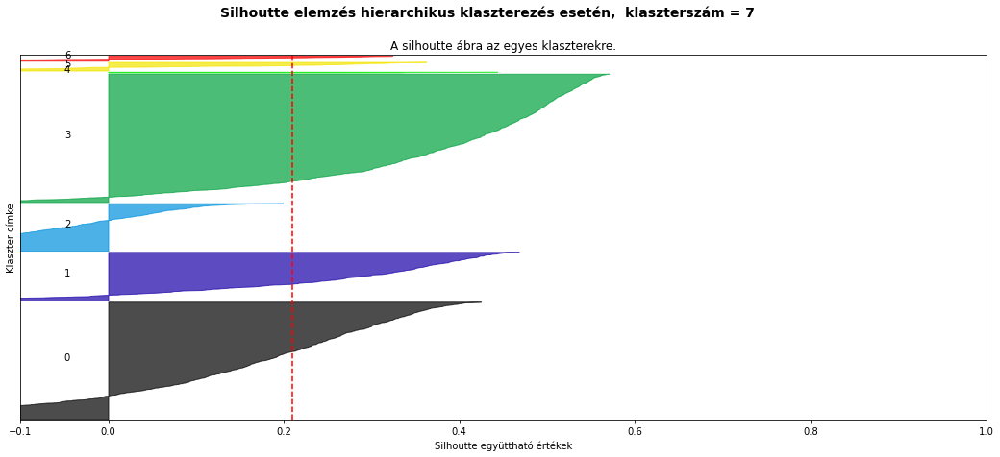

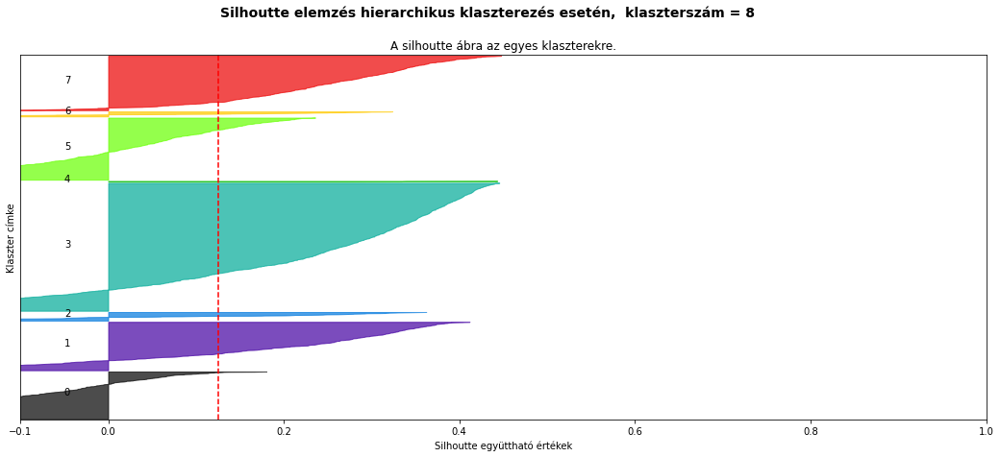

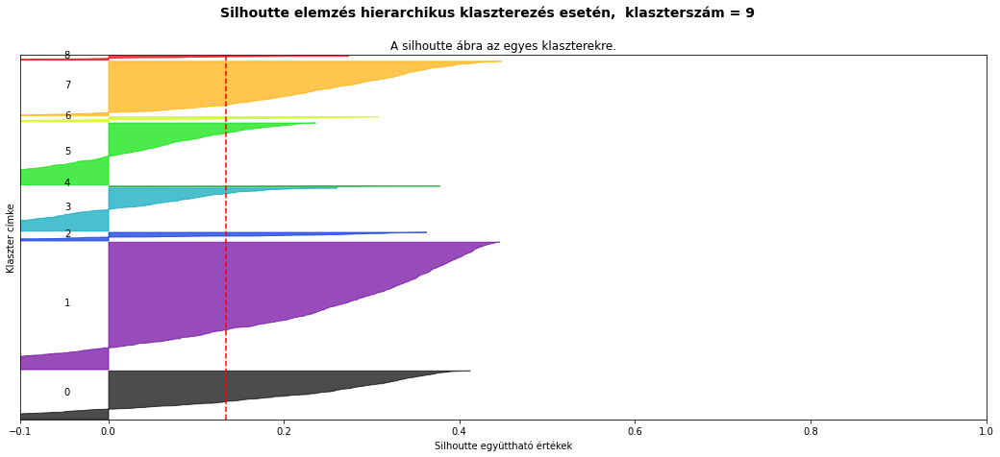

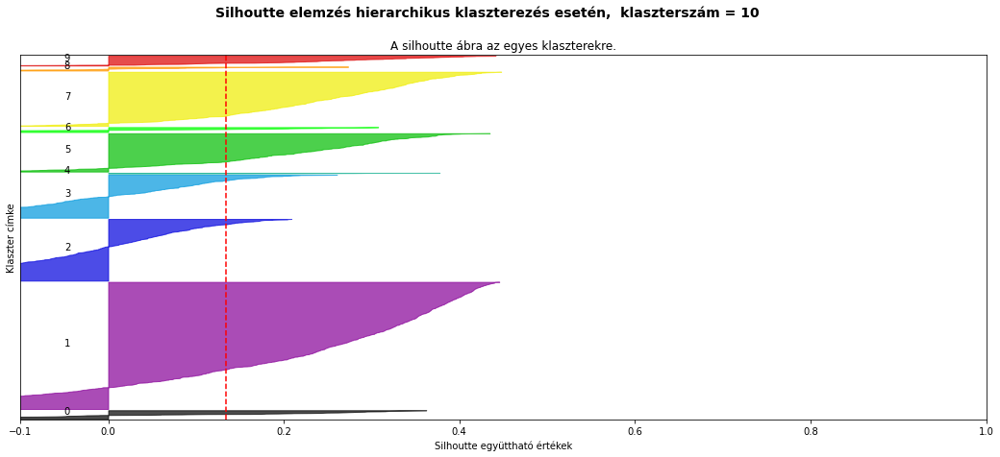

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters = n_clusters, affinity = 'euclidean', linkage ='ward')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés hierarchikus klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#### Shapley

In [ ]:
K=5


KMC=KMeans(n_clusters=K)
KMC.fit(lak_pca)
lak_pca['klaszter']=KMC.labels_

In [ ]:
lak_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,klaszter
0,0.635684,-1.689707,0.113014,0.165764,-0.425184,0.448733,0
1,0.239391,0.508626,-1.623259,0.416758,1.750141,-1.007259,3
2,2.687530,0.075492,0.484994,0.487448,0.715306,-0.127870,0
3,-3.662098,2.330903,0.424213,2.415335,-0.395514,0.368787,1
4,-2.417693,-0.277743,-0.608732,-0.642667,-1.911610,-0.585803,3


In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
y = lak_pca['klaszter']

In [ ]:
X = X.to_numpy()

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

In [ ]:
features = list(data_lak_clus_full.columns)

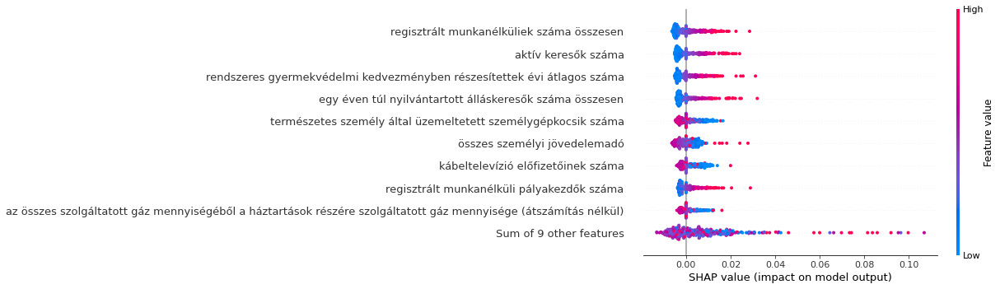

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

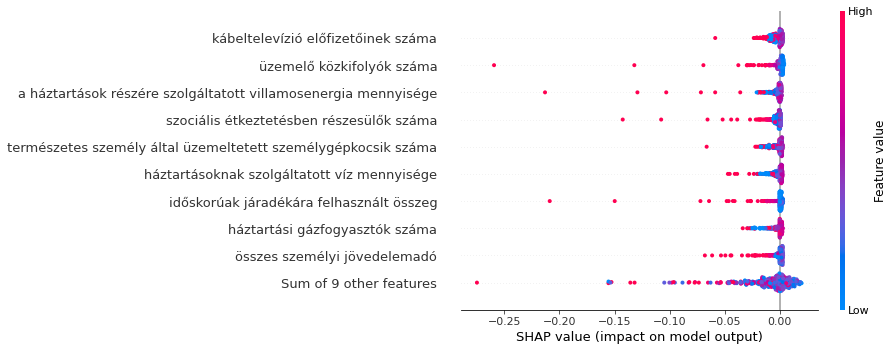

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

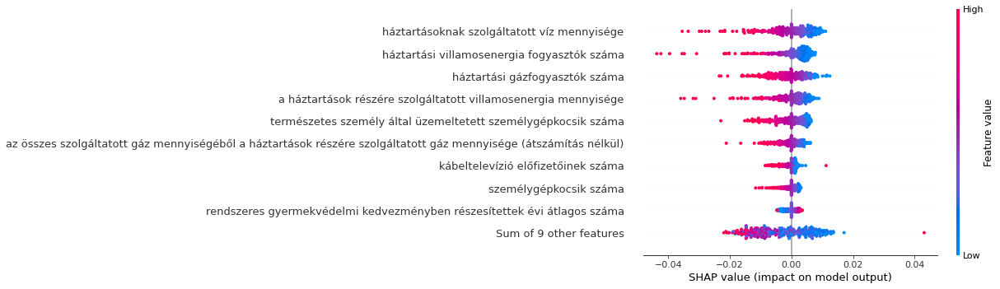

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

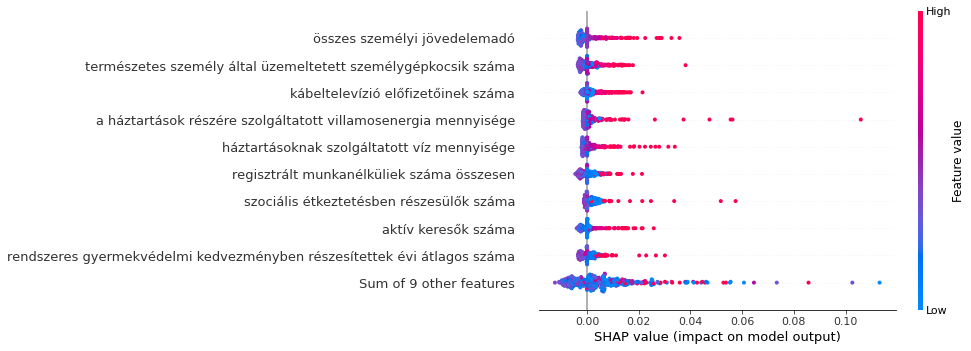

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

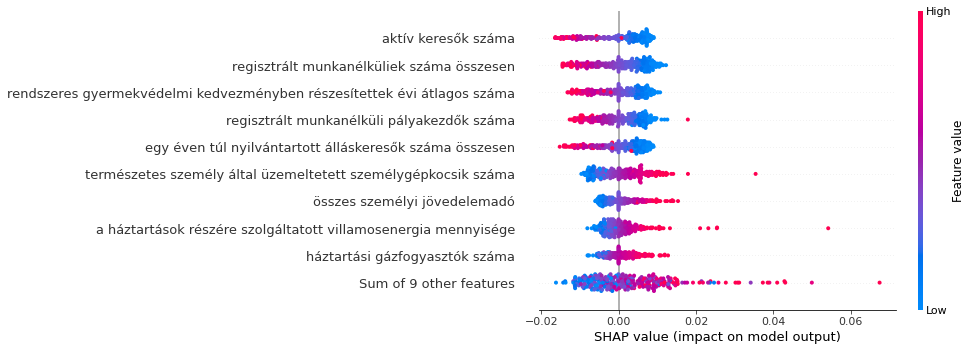

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

### 8 főkomponens

In [ ]:
X = data_lak_clus_full_scaled.iloc[:, :18]
X = X.values

In [ ]:
pca = PCA(n_components=8)

principalComponents = pca.fit_transform(X)

In [ ]:
lak_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'])
lak_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,0.635683,-1.689709,0.113005,0.165725,-0.425211,0.448863,-0.449595,-0.023900
1,0.239391,0.508631,-1.623223,0.416896,1.750217,-1.007664,-1.251240,-0.152979
2,2.687530,0.075492,0.484996,0.487451,0.715303,-0.127864,0.222400,0.504970
3,-3.662096,2.330939,0.424474,2.416361,-0.394823,0.365393,-0.463145,0.586687
4,-2.417693,-0.277750,-0.608781,-0.642866,-1.911759,-0.585104,0.186332,0.033052


In [ ]:
print('Az egyes komponensek által megmagyarázott szórás:', pca.explained_variance_ratio_)
print('\n Teljes megmagyarázott szórás:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Az egyes komponensek által megmagyarázott szórás: [0.35080134 0.11502208 0.07777427 0.0625279  0.05825847 0.04972791
 0.04675152 0.04298101]

 Teljes megmagyarázott szórás: 80.38


#### Silhoutte

In [ ]:
X = lak_pca.iloc[:]

##### K-közép

For n_clusters = 2 The average silhouette_score is : 0.3167378561982881
For n_clusters = 3 The average silhouette_score is : 0.19934994842885614
For n_clusters = 4 The average silhouette_score is : 0.20792993322358272
For n_clusters = 5 The average silhouette_score is : 0.2123325836687974
For n_clusters = 6 The average silhouette_score is : 0.16848146838459926
For n_clusters = 7 The average silhouette_score is : 0.16976368798231453
For n_clusters = 8 The average silhouette_score is : 0.15907277423804447
For n_clusters = 9 The average silhouette_score is : 0.16490599421753568
For n_clusters = 10 The average silhouette_score is : 0.16437847393948093


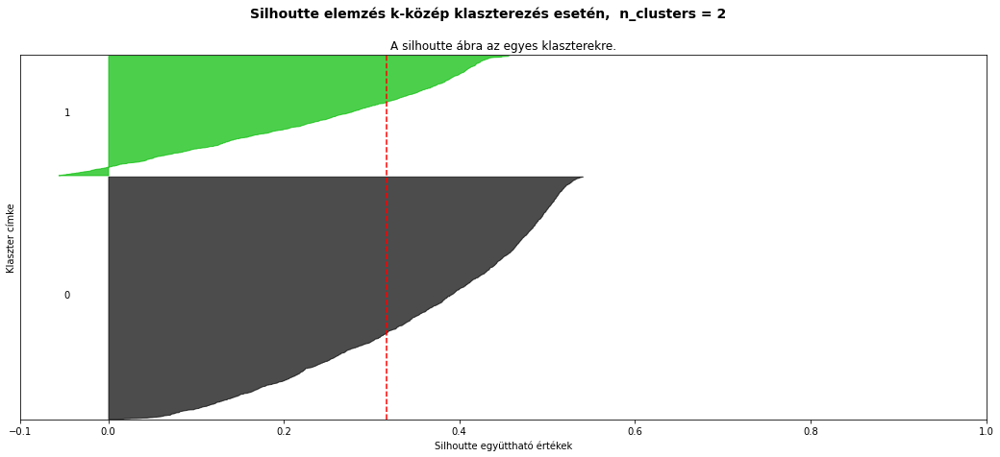

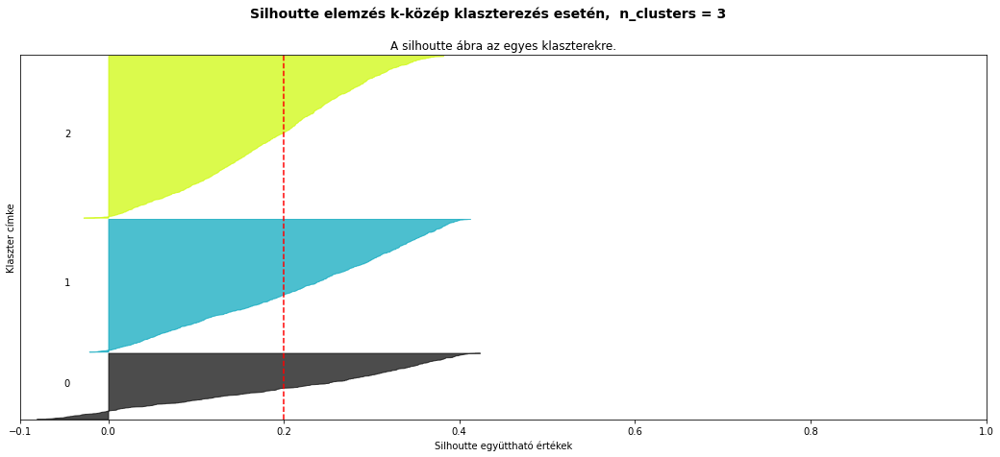

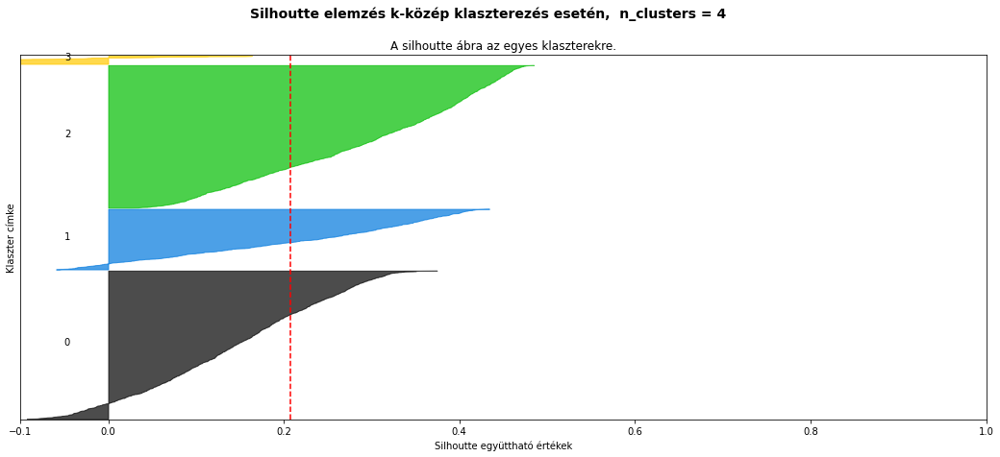

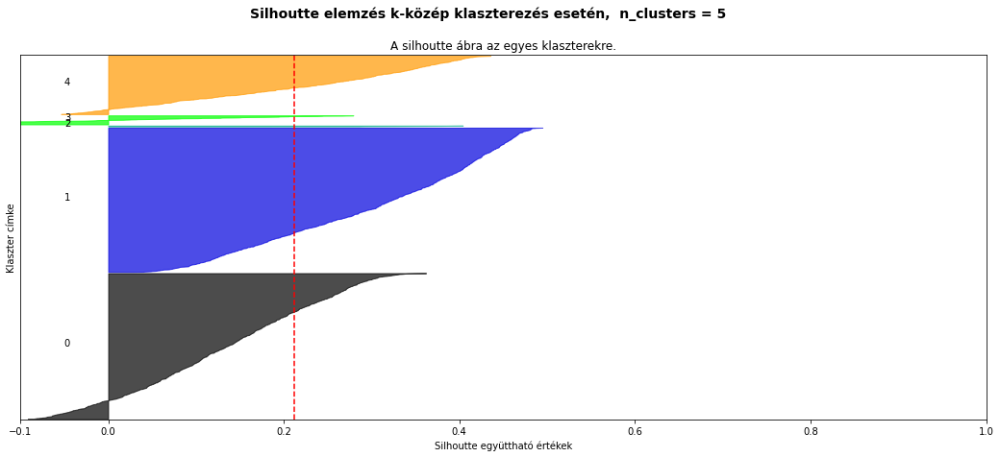

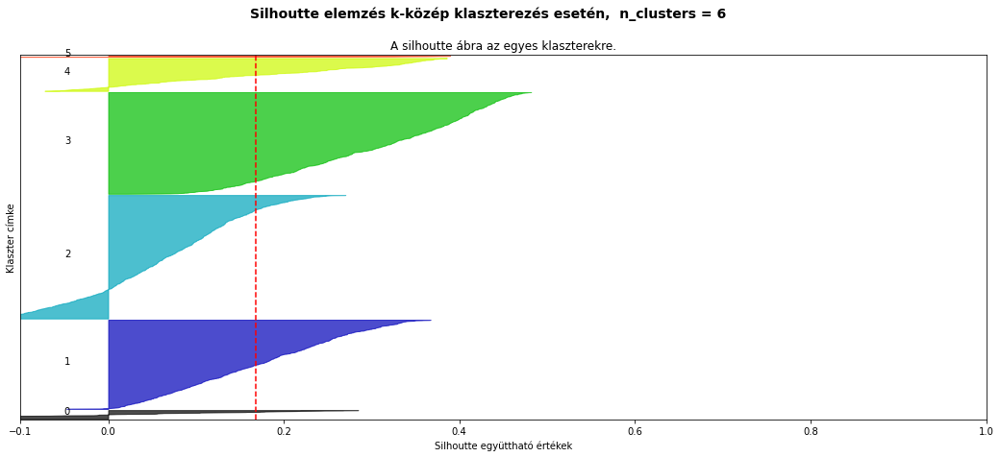

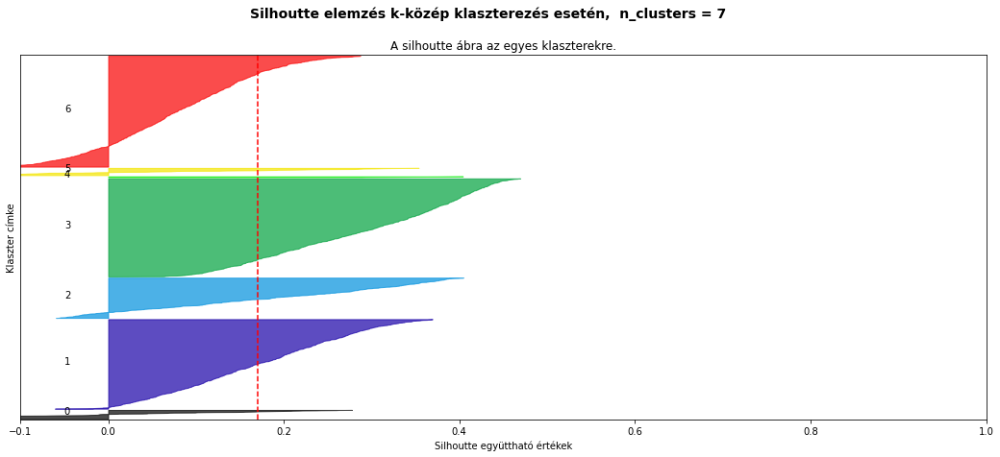

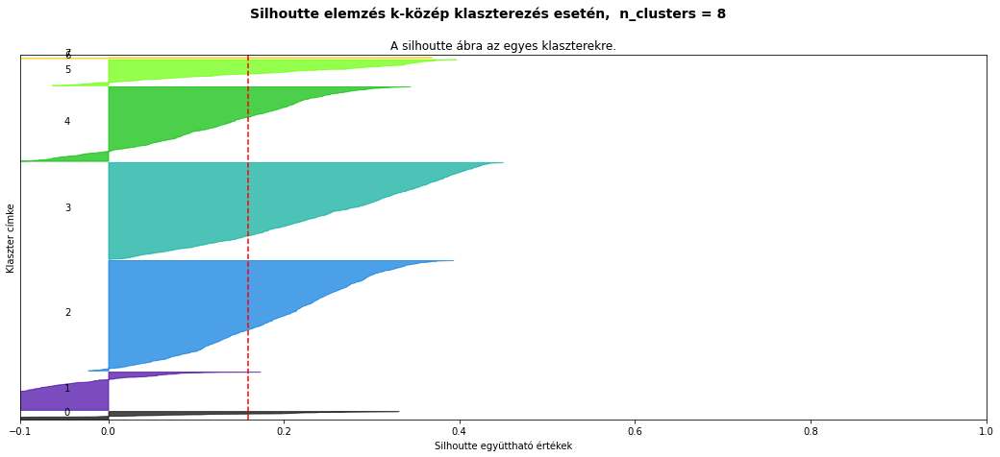

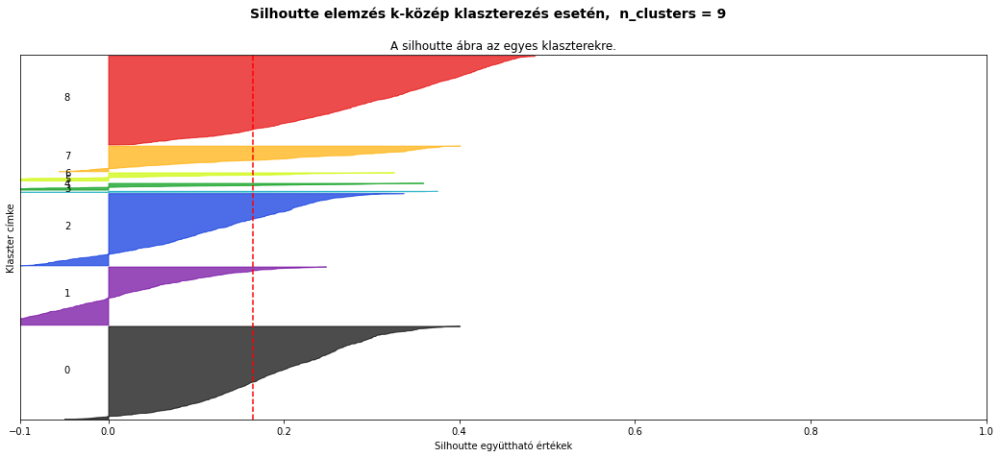

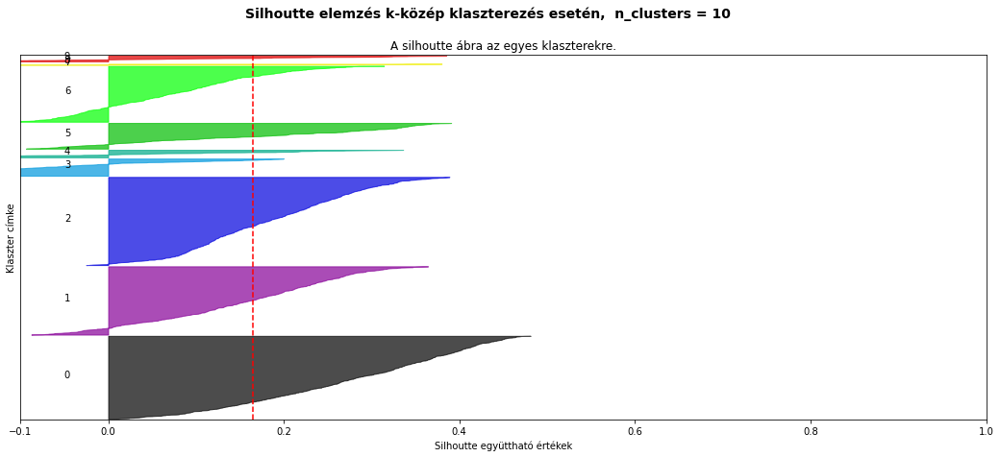

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés k-közép klaszterezés esetén, "
                  " n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Spektrális klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.3094228017830514
For n_clusters = 3 The average silhouette_score is : 0.20120400223516108
For n_clusters = 4 The average silhouette_score is : 0.16757189482586152
For n_clusters = 5 The average silhouette_score is : 0.14897875172125344
For n_clusters = 6 The average silhouette_score is : 0.13383607320437033
For n_clusters = 7 The average silhouette_score is : 0.14661573198948413
For n_clusters = 8 The average silhouette_score is : 0.11534859485236057
For n_clusters = 9 The average silhouette_score is : 0.10691859417765733
For n_clusters = 10 The average silhouette_score is : 0.10155175840013377


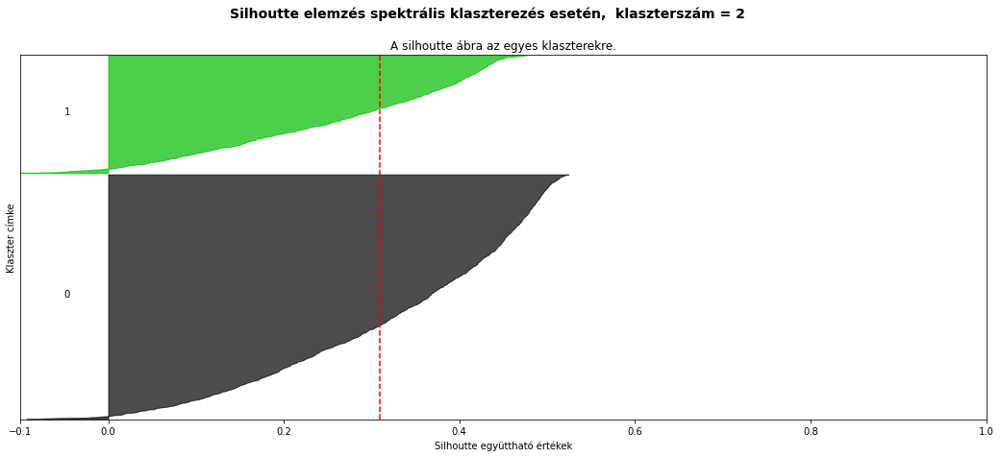

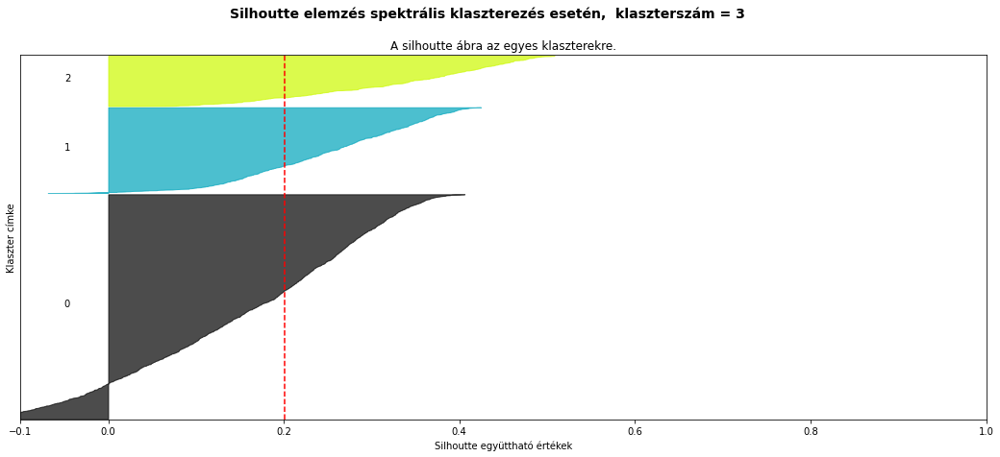

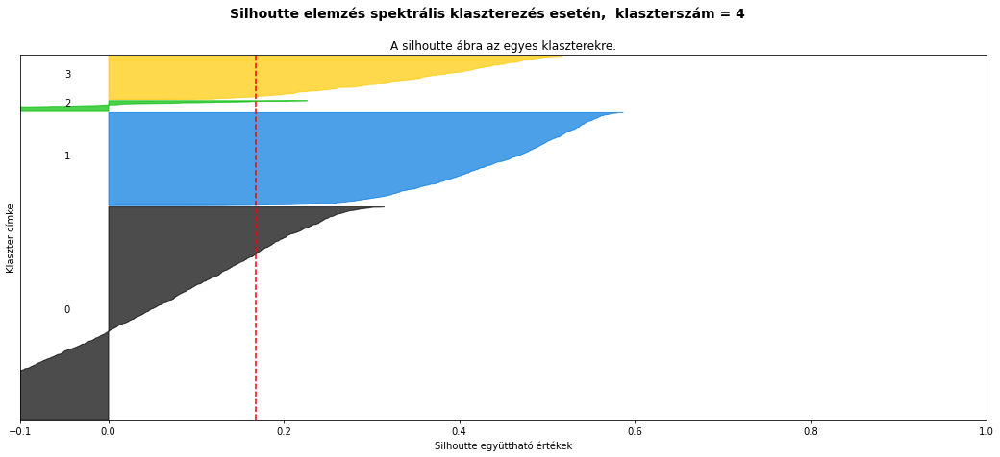

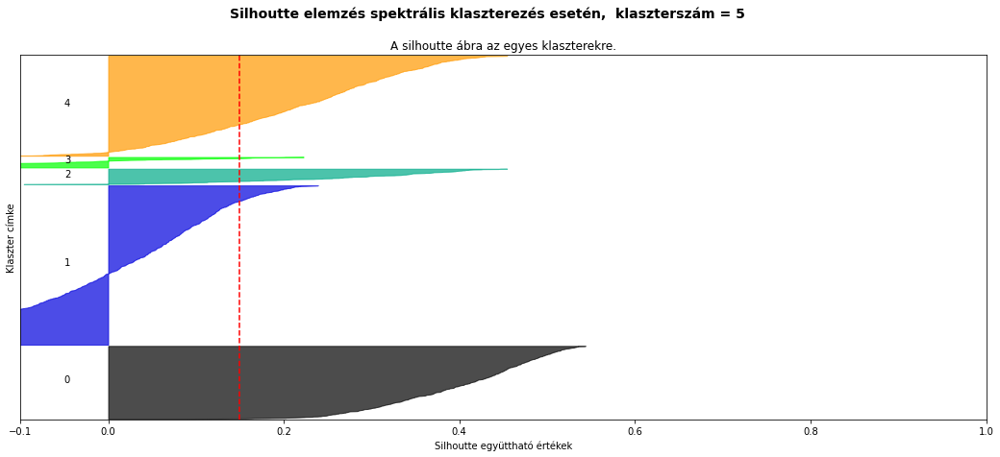

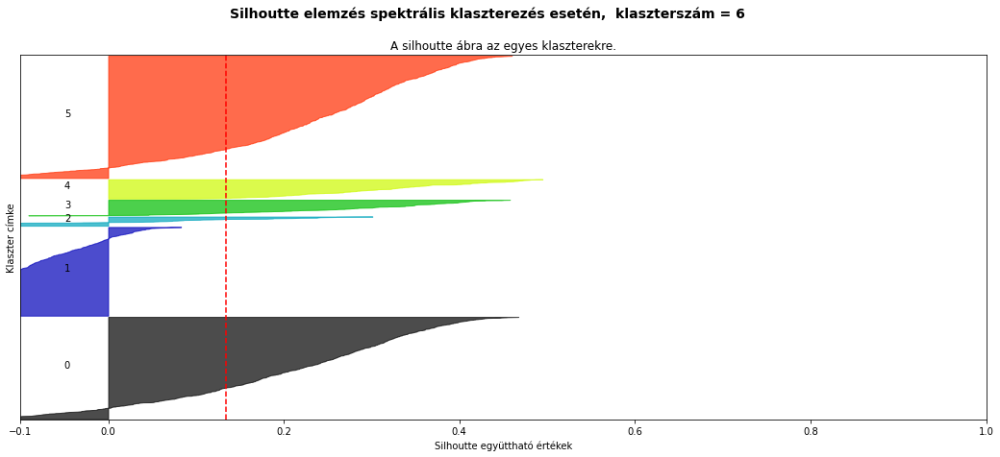

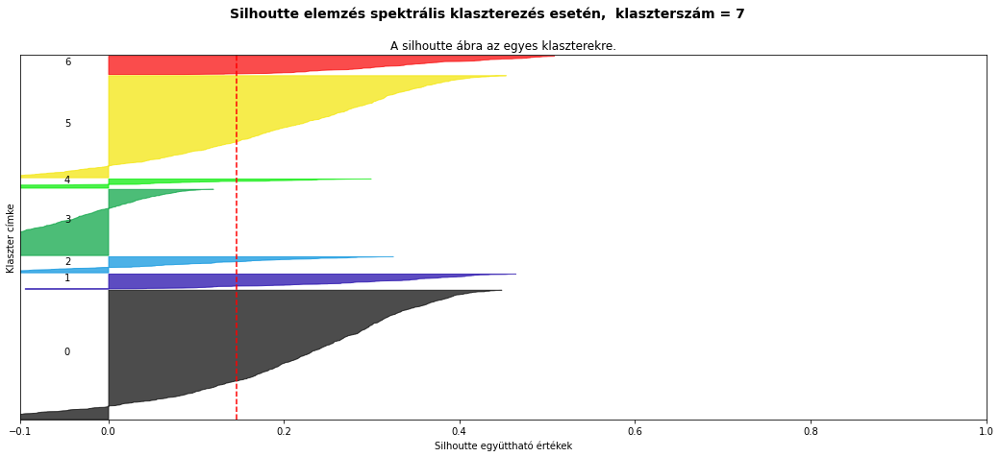

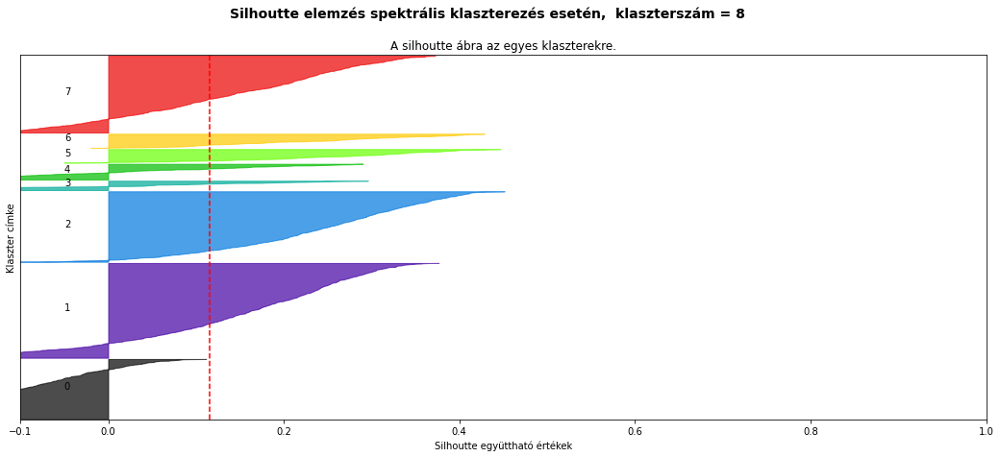

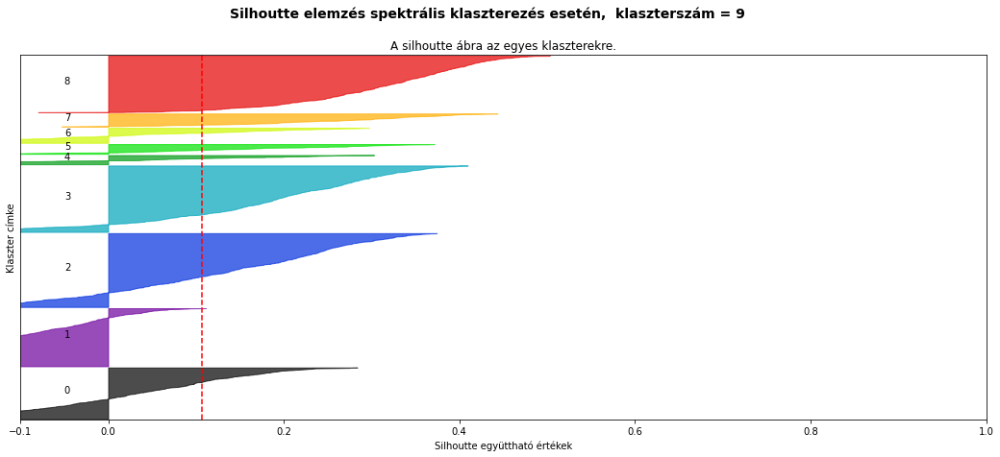

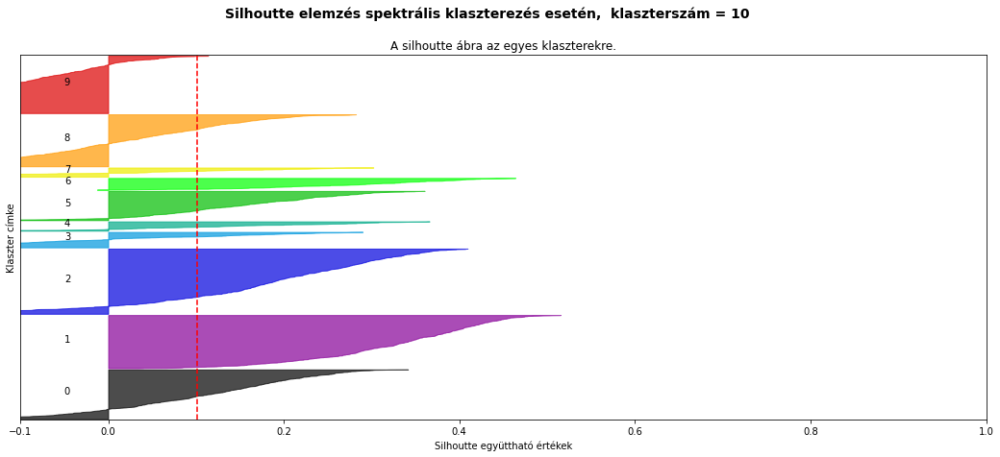

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = SpectralClustering(
    n_clusters=n_clusters, 
    random_state=25,  
    affinity='nearest_neighbors')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés spektrális klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### Hierarchikus klaszterezés

For n_clusters = 2 The average silhouette_score is : 0.30336184454752174
For n_clusters = 3 The average silhouette_score is : 0.14409087354334044
For n_clusters = 4 The average silhouette_score is : 0.14698759508124348
For n_clusters = 5 The average silhouette_score is : 0.13664530302630448
For n_clusters = 6 The average silhouette_score is : 0.12338675173197468
For n_clusters = 7 The average silhouette_score is : 0.13023366150718796
For n_clusters = 8 The average silhouette_score is : 0.12524039078565188
For n_clusters = 9 The average silhouette_score is : 0.12543210776427555
For n_clusters = 10 The average silhouette_score is : 0.11432618887538687


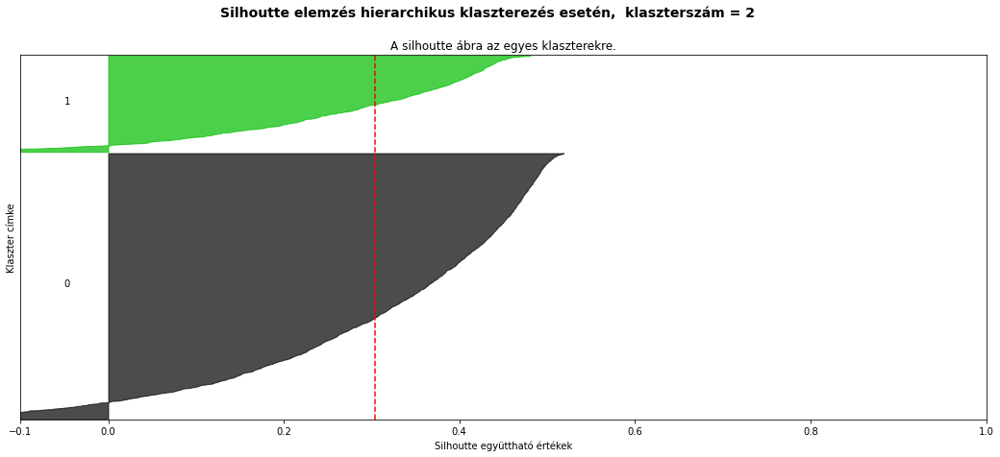

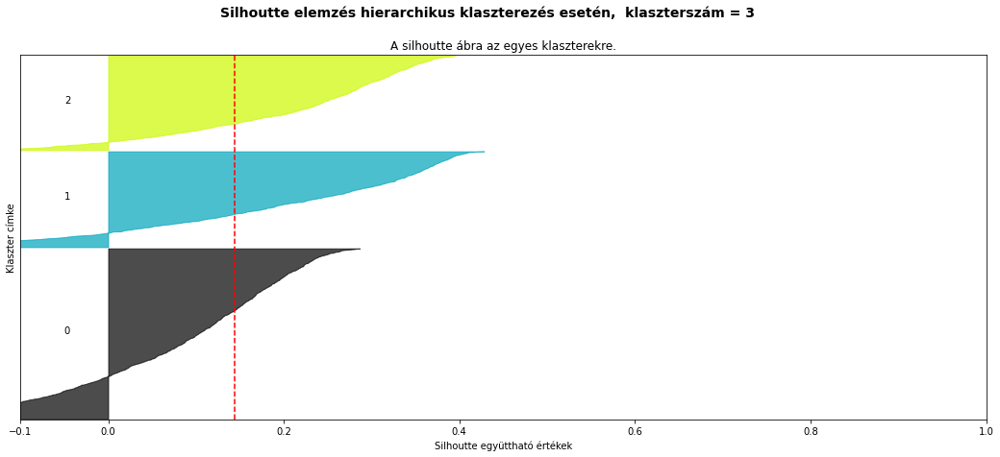

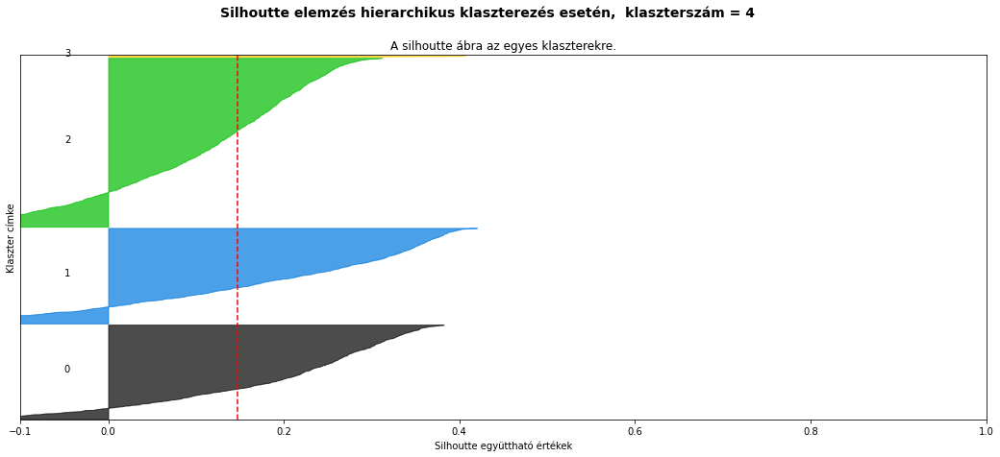

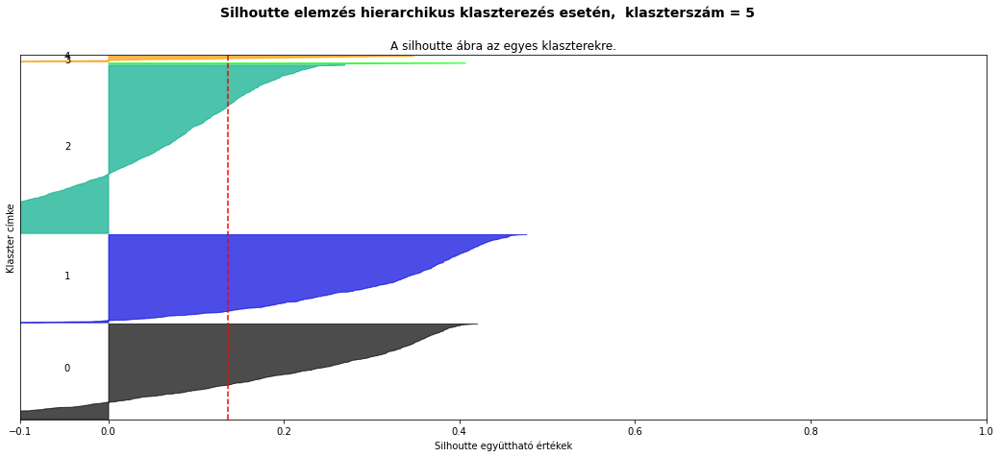

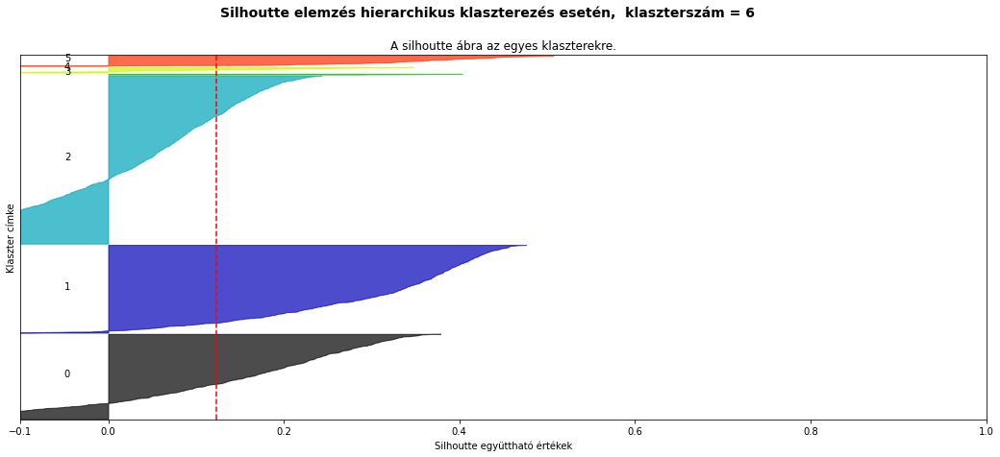

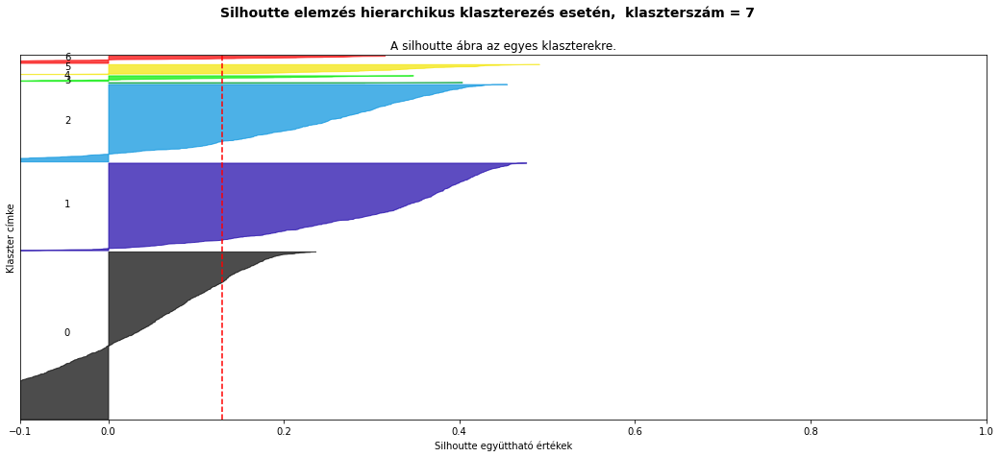

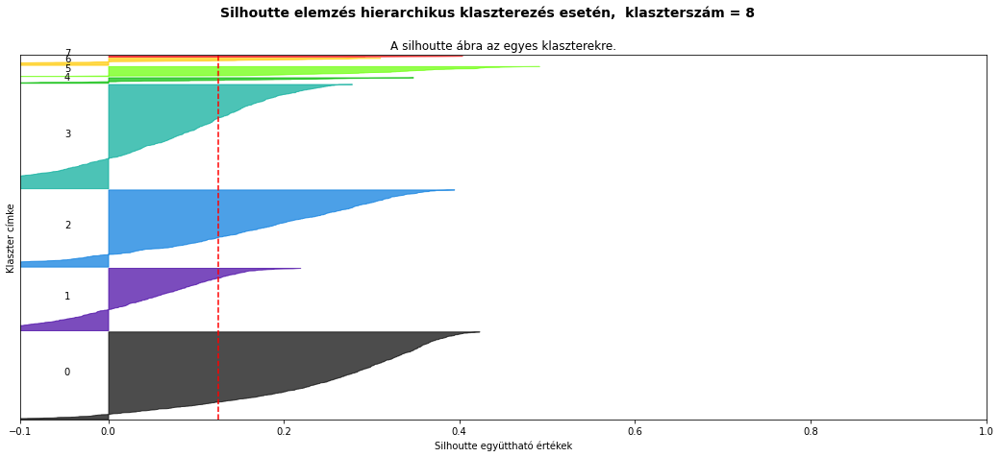

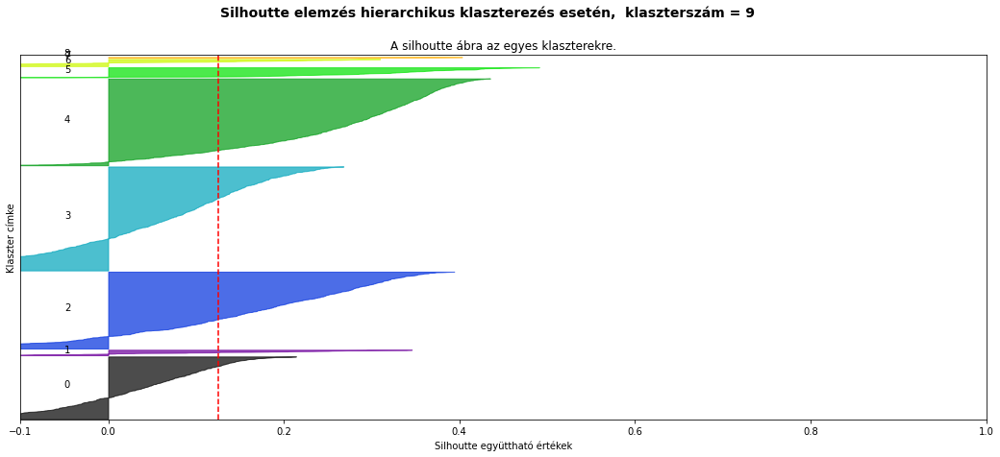

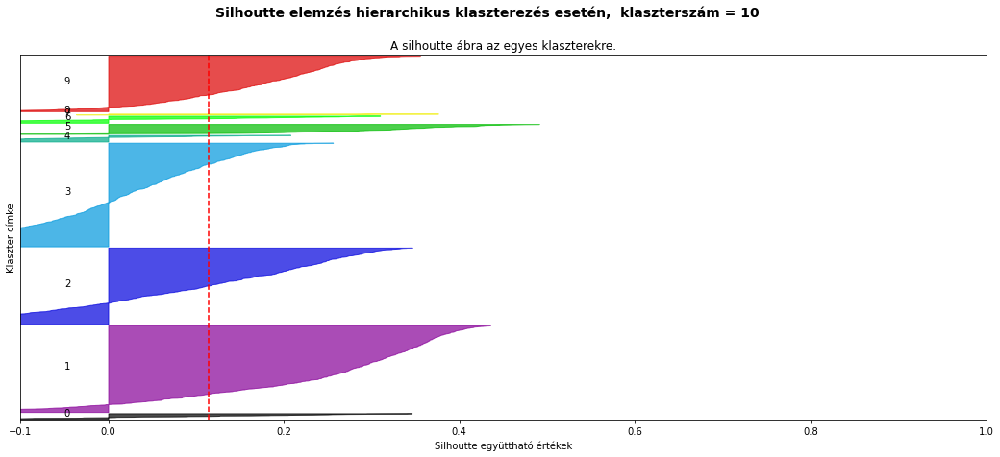

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters = n_clusters, affinity = 'euclidean', linkage ='ward')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("A silhoutte ábra az egyes klaszterekre.")
    ax1.set_xlabel("Silhoutte együttható értékek")
    ax1.set_ylabel("Klaszter címke")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhoutte elemzés hierarchikus klaszterezés esetén, "
                  " klaszterszám = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

# Önkormányzati dimenzió

In [ ]:
onkorm_dim = ['TAAC100','TAAC101','TAAC104','TAAH600','TAAH503','TAAH022','TAAJ714','TAAJ017','TAAJ309','TAAJ302','TAAJ600','TAAA101']
datatype_onkorm = datatype[datatype['kshkod'].isin(onkorm_dim)]
data_onkorm = merge_temp.merge(datatype_onkorm, on='datatypeid')

In [ ]:
year=2010

pd.options.mode.chained_assignment = None  # default='warn'
data_onkorm_clus = data_onkorm[data_onkorm.year==year]

data_onkorm_clus['ind']=list(map(lambda x,y,z,w: (x,y,z,w), data_onkorm_clus['name'],data_onkorm_clus['geoid'],data_onkorm_clus['wgs84_e_szelesseg'],data_onkorm_clus['wgs84_k_hosszusag'] ))
data_onkorm_clus = data_onkorm_clus[['ind', 'value', 'label']]
data_onkorm_clus = pd.crosstab(data_onkorm_clus.ind, data_onkorm_clus.label, values=data_onkorm_clus.value, aggfunc=lambda x: x)

for i in range(len(data_onkorm_clus)):
  data_onkorm_clus.iloc[i]=data_onkorm_clus.iloc[i]/data_onkorm_clus.iloc[i]['lakónépesség száma az év végén']

data_onkorm_clus=data_onkorm_clus.drop(['lakónépesség száma az év végén'], axis=1)
data_onkorm_clus=data_onkorm_clus.fillna(0)

In [ ]:
data_onkorm_clus.head()

label,a helyi önkormányzatok helyi adó bevételei,a helyi önkormányzatok saját folyó bevételei,a helyi önkormányzatoknak átengedett gépjárműadó,a háziorvosok által ellátott szolgálatok száma,a lakosságtól elszállított települési szilárd hulladék,betöltött védőnői álláshelyek száma,gyógyszertárak száma (humán),közüzemi szennyvízcsatorna-hálózat hossza,működő összes bölcsődei férőhelyek száma,önkormányzati kiépített út és köztér hossza,"öregségi nyugdíj összege, férfi"
ind,,,,,,,,,,,
"(Aba, 1512, 47.0343556977497, 18.524754962635)",7.883611,28.725931,4.274925,0.000428,0.166239,0.000428,0.000214,0.005135,0.0,0.003209,5047.930039
"(Abaliget, 1035, 46.143846193037206, 18.118110841590898)",14.349315,24.957192,4.897260,0.001712,0.193493,0.001712,0.000000,0.000000,0.0,0.013699,5892.731164
"(Abasár, 2209, 47.800687144764396, 20.0083983387857)",30.120463,86.654168,8.697248,0.000798,0.232549,0.000798,0.000399,0.006781,0.0,0.004787,11012.506980
"(Abaújalpár, 1341, 48.3061466428872, 21.234096519055)",5.040000,17.506667,6.093333,0.000000,0.360000,0.000000,0.000000,0.000000,0.0,0.053333,5480.333333
"(Abaújkér, 2420, 48.3050378371762, 21.2002207816169)",2.147776,22.948350,2.875179,0.001435,0.243902,0.001435,0.000000,0.011478,0.0,0.017217,5359.971306


In [ ]:
features = list(data_onkorm_clus.columns)

### UMAP

In [ ]:
scaler = MinMaxScaler()
data_onkorm_scaled = pd.DataFrame(scaler.fit_transform(data_onkorm_clus), columns=data_onkorm_clus.columns)
data_onkorm_scaled.head()

label,a helyi önkormányzatok helyi adó bevételei,a helyi önkormányzatok saját folyó bevételei,a helyi önkormányzatoknak átengedett gépjárműadó,a háziorvosok által ellátott szolgálatok száma,a lakosságtól elszállított települési szilárd hulladék,betöltött védőnői álláshelyek száma,gyógyszertárak száma (humán),közüzemi szennyvízcsatorna-hálózat hossza,működő összes bölcsődei férőhelyek száma,önkormányzati kiépített út és köztér hossza,"öregségi nyugdíj összege, férfi"
0,0.015067,0.036428,0.012186,0.061190,0.084837,0.084724,0.086436,0.035944,0.0,0.011767,0.157752
1,0.025268,0.031649,0.013960,0.244863,0.101721,0.339041,0.000000,0.000000,0.0,0.050228,0.184153
2,0.050150,0.109899,0.024792,0.114081,0.125915,0.157958,0.161149,0.047467,0.0,0.017551,0.344151
3,0.010581,0.022199,0.017369,0.000000,0.204870,0.000000,0.000000,0.000000,0.0,0.195556,0.171265
4,0.006018,0.029101,0.008196,0.205165,0.132949,0.284075,0.000000,0.080344,0.0,0.063128,0.167504


In [ ]:
from sklearn.cluster import KMeans
K=5


KMC=KMeans(n_clusters=K)
KMC.fit(data_onkorm_scaled)
data_onkorm_scaled['clusters']=KMC.labels_

In [ ]:
X = data_onkorm_scaled.iloc[:, :11]
y = data_onkorm_scaled.iloc[:, 11]

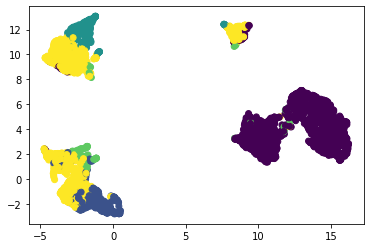

In [ ]:
reducer = umap.UMAP(verbose=0, random_state=0)
embedding = reducer.fit_transform(X)
plt.scatter(embedding[:, 0], embedding[:, 1], c=y)
plt.show()

Érdekes hogy itt a UMAP milyen szép klaszterekre szedte szét az adatot, de a k-közép algoritmus egész más eredményt adott, kivéve a nagy lila klasztert amiben megegyeztek.

In [ ]:
X = X.to_numpy()

In [ ]:
# fit the dataset
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

# compute explanations for data subset

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.02)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/63 [00:00<?, ?it/s]

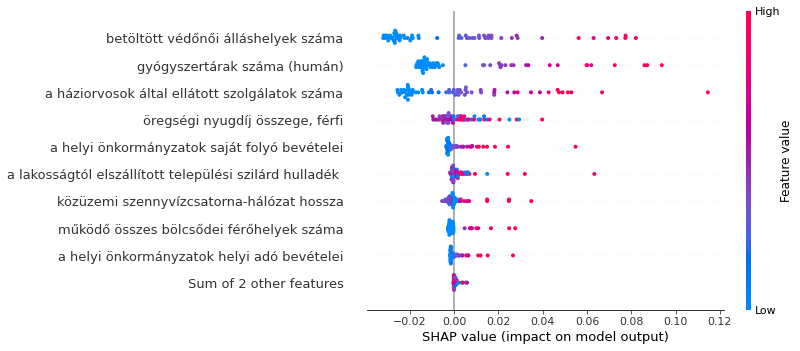

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

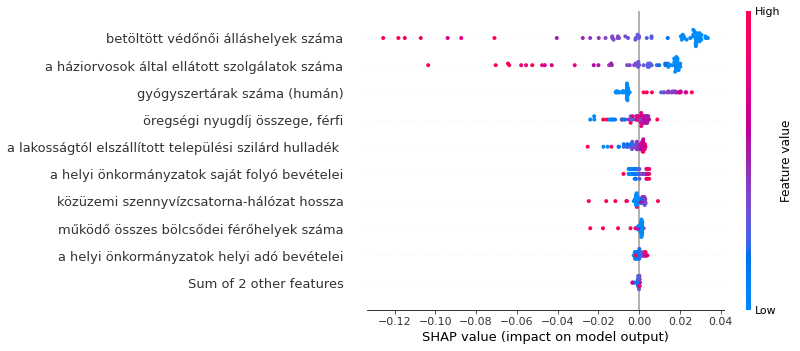

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

### PCA

In [ ]:
scaler = StandardScaler()
data_onkorm_clus_scaled = pd.DataFrame(scaler.fit_transform(data_onkorm_clus), columns=data_onkorm_clus.columns)
data_onkorm_clus_scaled.head()

label,a helyi önkormányzatok helyi adó bevételei,a helyi önkormányzatok saját folyó bevételei,a helyi önkormányzatoknak átengedett gépjárműadó,a háziorvosok által ellátott szolgálatok száma,a lakosságtól elszállított települési szilárd hulladék,betöltött védőnői álláshelyek száma,gyógyszertárak száma (humán),közüzemi szennyvízcsatorna-hálózat hossza,működő összes bölcsődei férőhelyek száma,önkormányzati kiépített út és köztér hossza,"öregségi nyugdíj összege, férfi"
0,-0.282170,-0.153890,-0.204826,-0.088341,-0.561468,0.062889,0.376601,-0.119234,-0.266937,-0.533468,-0.598736
1,-0.092701,-0.232214,-0.143000,1.951830,-0.310304,2.428609,-0.487834,-0.687624,-0.266937,0.510039,-0.255829
2,0.369453,1.050002,0.234512,0.499151,0.049616,0.744127,1.123801,0.062992,-0.266937,-0.376550,1.822304
3,-0.365498,-0.387054,-0.024176,-0.768010,1.224148,-0.725234,-0.487834,-0.687624,-0.266937,4.452988,-0.423222
4,-0.450252,-0.273963,-0.343885,1.510880,0.154245,1.917298,-0.487834,0.582893,-0.266937,0.860019,-0.472078


In [ ]:
X = data_onkorm_clus_scaled.iloc[:, :]
X = X.values

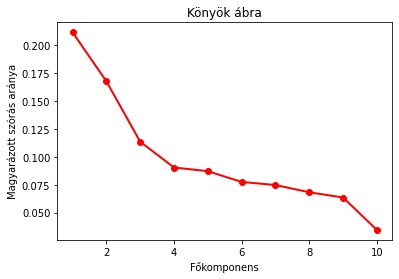

In [ ]:
pca = PCA(n_components=10)
principalComponents=pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Könyök ábra')
plt.xlabel('Főkomponens')
plt.ylabel('Magyarázott szórás aránya')
plt.show()

In [ ]:
out_sum = np.cumsum(pca.explained_variance_ratio_)  
print ("Magyarázott szórásarányok összegezve: ", out_sum)

Magyarázott szórásarányok összegezve:  [0.21157733 0.37927133 0.49283575 0.58327017 0.67041163 0.7479074
 0.82263362 0.89085562 0.95441255 0.98890445]


6-7 főkomponenssel már elég sok szórást meg lehet magyarázni, nézzük először hattal.

#### 6 főkomponens

In [ ]:
X = data_onkorm_clus_scaled.iloc[:, :]
X = X.values

In [ ]:
pca = PCA(n_components=6)

principalComponents = pca.fit_transform(X)

In [ ]:
onkorm_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])
onkorm_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,-0.687130,-0.531146,-0.434621,0.223644,0.089122,-0.454296
1,-0.102114,-2.433782,1.498932,0.468640,-0.920849,0.812953
2,1.629002,-0.793093,0.642796,-0.468680,0.172025,-0.033064
3,-0.175940,2.483054,1.494783,-0.974860,-1.706840,-0.814553
4,-0.072025,-1.415567,1.833820,0.374773,-0.786957,0.463977


In [ ]:
print('Az egyes komponensek által megmagyarázott szórás:', pca.explained_variance_ratio_)
print('\n Teljes megmagyarázott szórás:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Az egyes komponensek által megmagyarázott szórás: [0.21157733 0.16769401 0.11356442 0.09043442 0.08714146 0.07749577]

 Teljes megmagyarázott szórás: 74.79


In [ ]:
X = onkorm_pca.iloc[:, :]

For n_clusters = 2 The average silhouette_score is : 0.2527531574732913
For n_clusters = 3 The average silhouette_score is : 0.23341830348998174
For n_clusters = 4 The average silhouette_score is : 0.2863195530691022
For n_clusters = 5 The average silhouette_score is : 0.288903536530611
For n_clusters = 6 The average silhouette_score is : 0.2543838334730304
For n_clusters = 7 The average silhouette_score is : 0.28907361455982533
For n_clusters = 8 The average silhouette_score is : 0.25861662982795597
For n_clusters = 9 The average silhouette_score is : 0.244225029517289
For n_clusters = 10 The average silhouette_score is : 0.2543807575749336


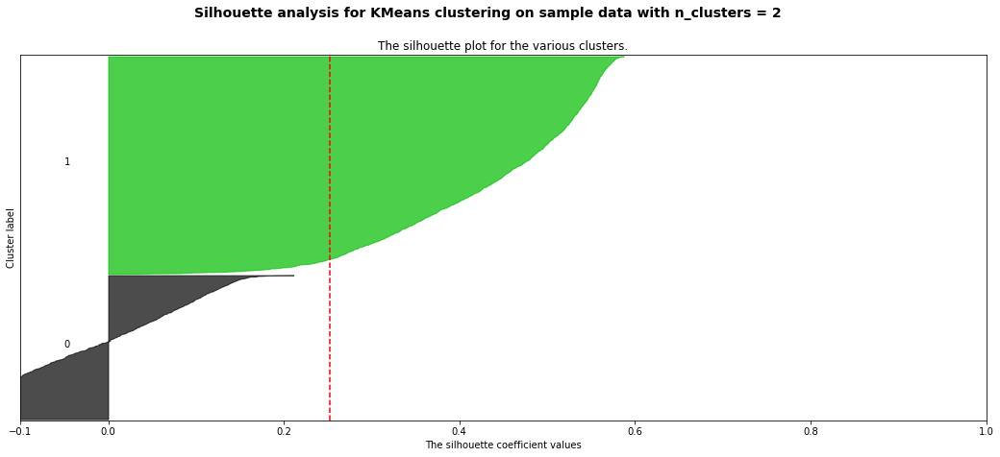

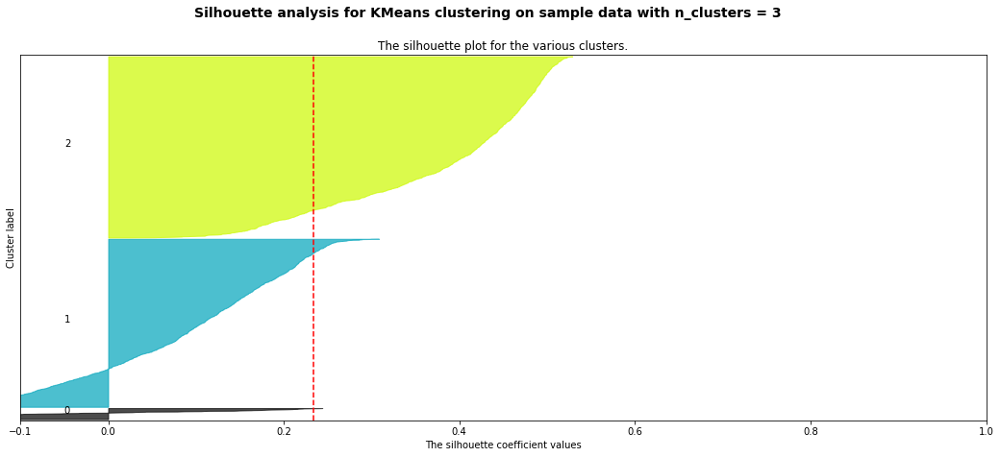

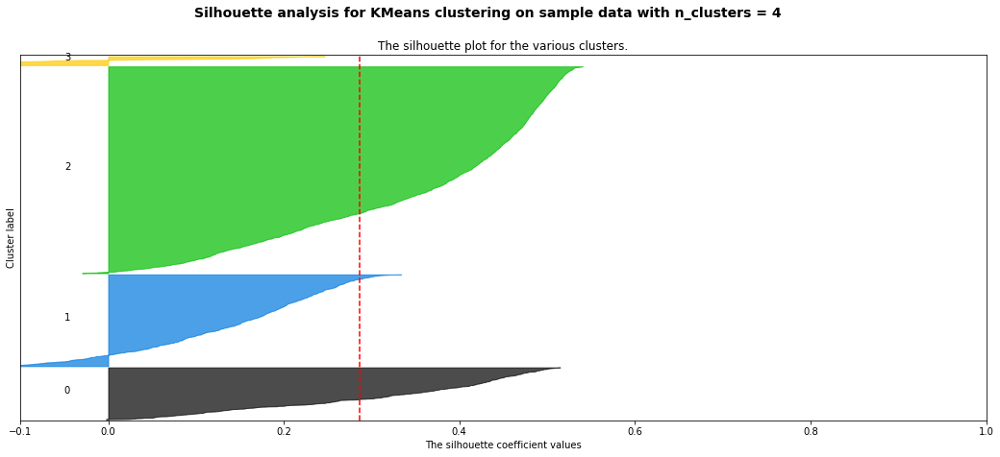

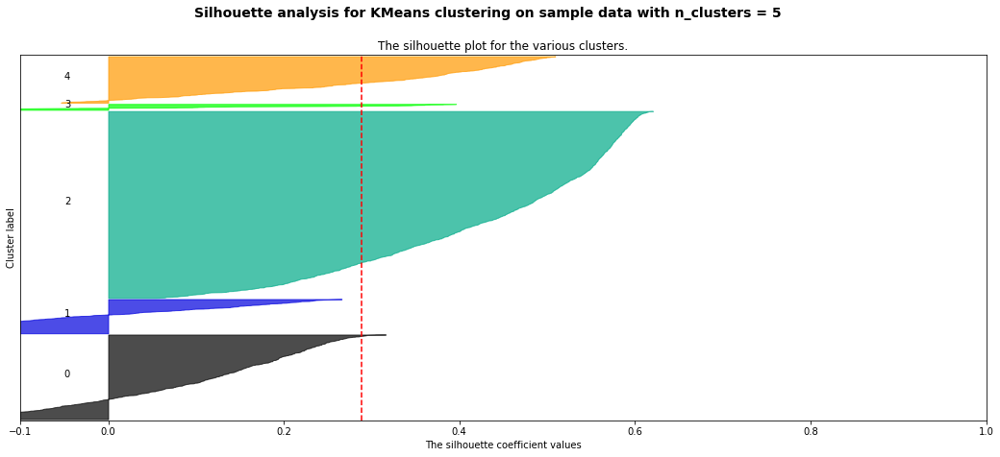

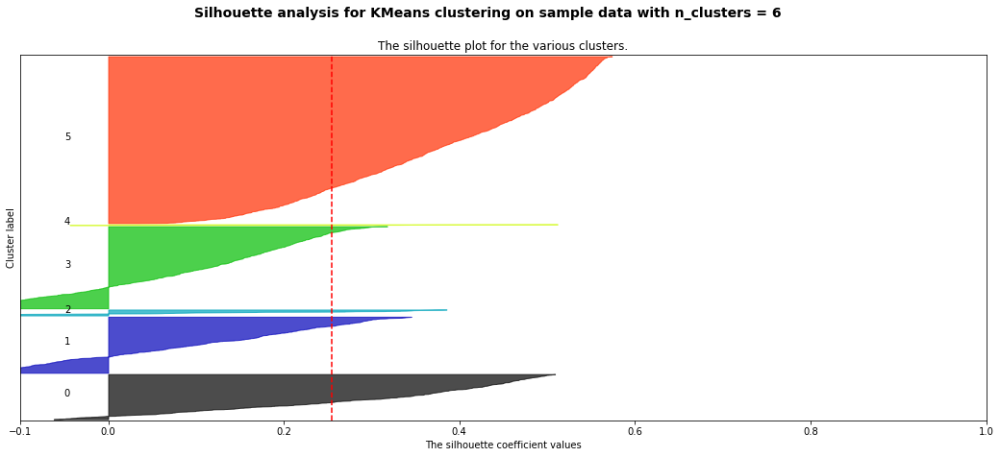

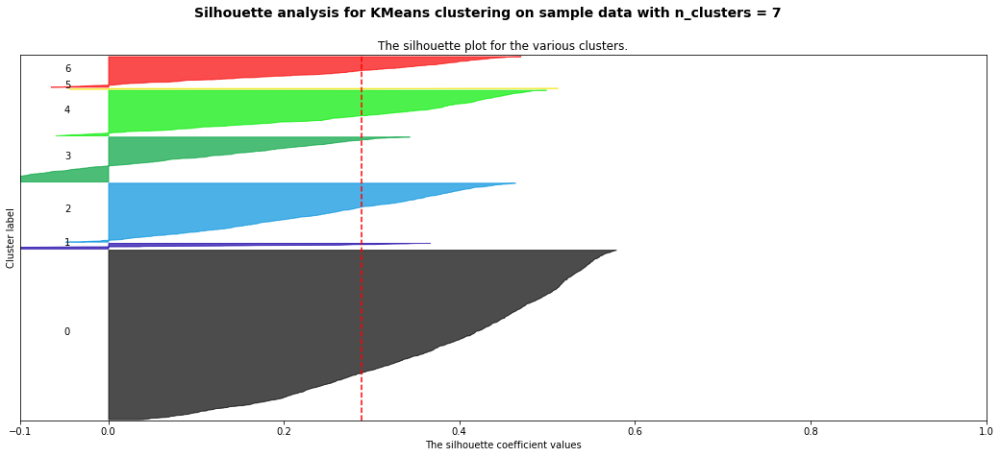

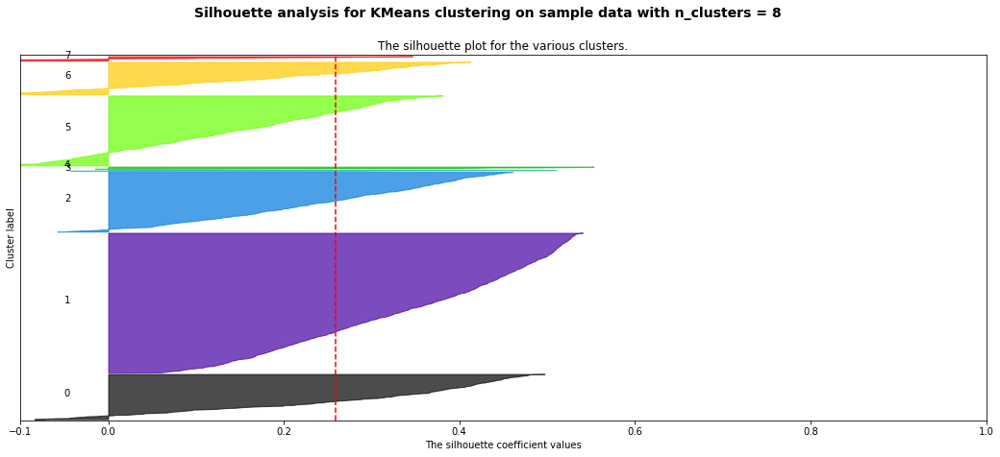

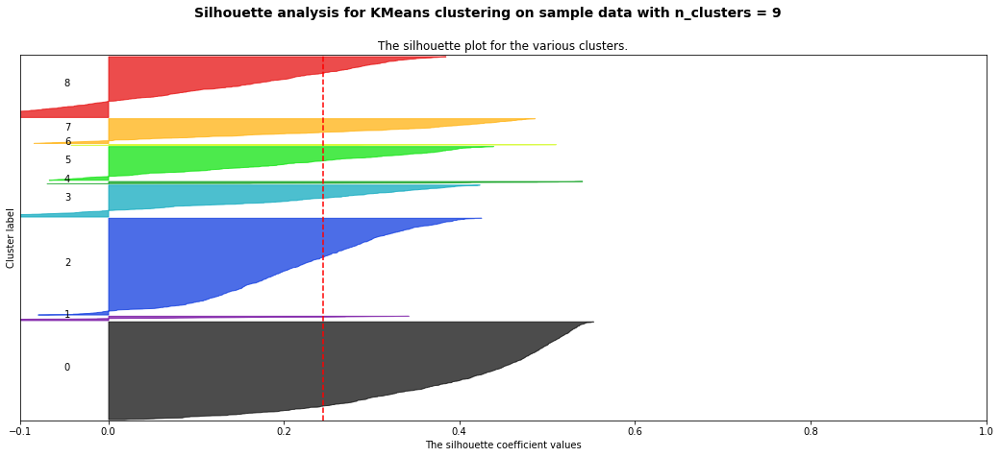

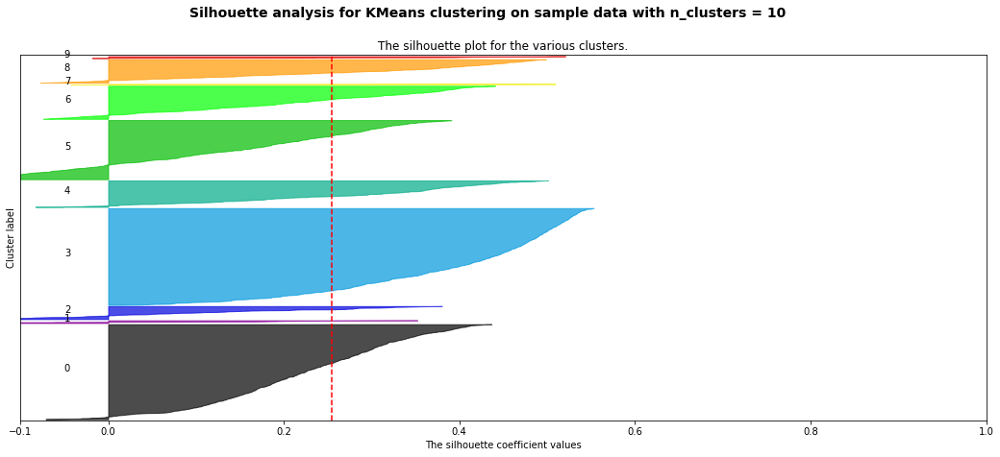

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### K=7

In [ ]:
K=7


KMC=KMeans(n_clusters=K)
KMC.fit(onkorm_pca)
onkorm_pca['klaszter']=KMC.labels_

In [ ]:
X = data_onkorm_clus_scaled.iloc[:, :]
X = X.to_numpy()
y = onkorm_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

In [ ]:
features = list(data_onkorm_clus_scaled.columns)

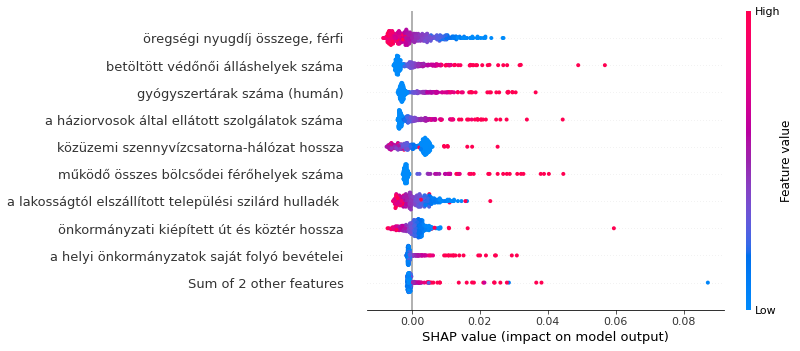

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

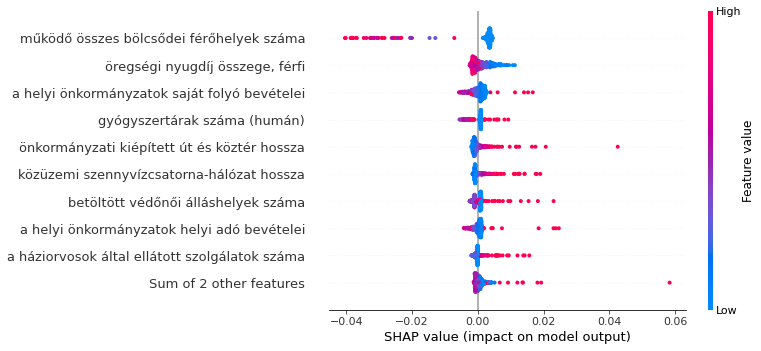

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

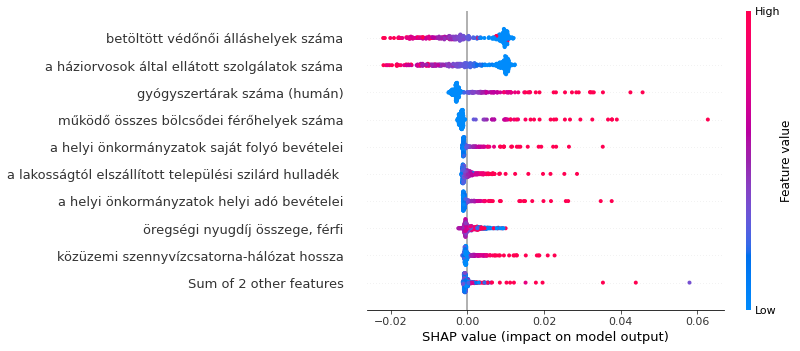

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

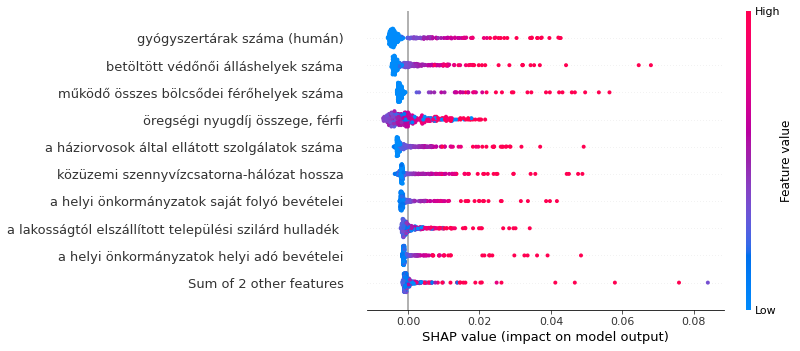

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

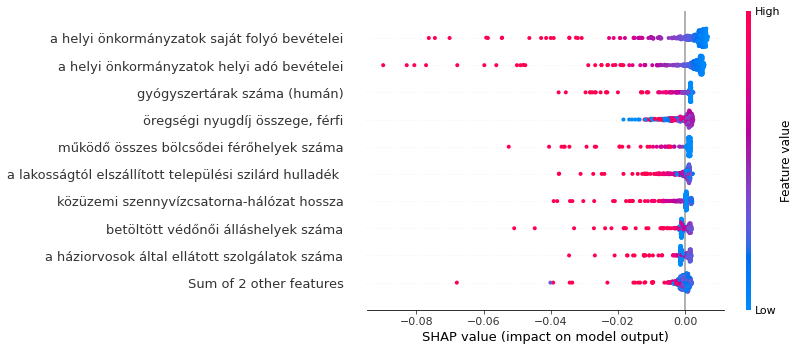

In [ ]:
osztaly = 4
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

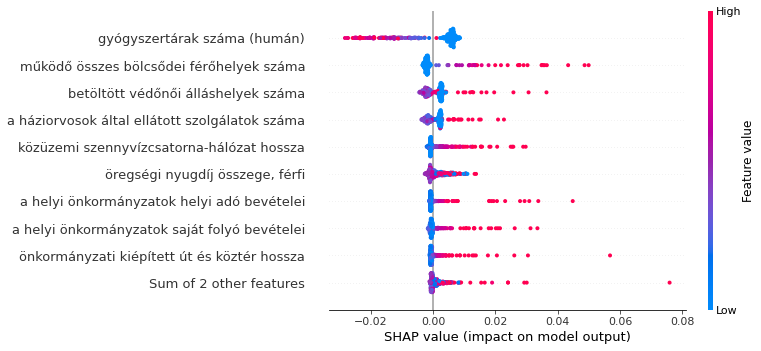

In [ ]:
osztaly = 5
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

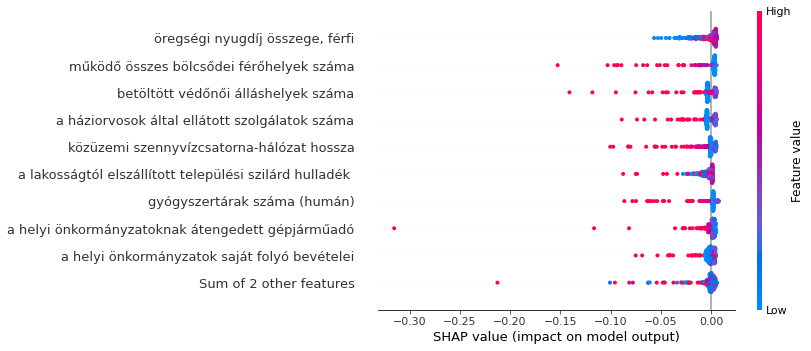

In [ ]:
osztaly = 6
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

##### K=4

In [ ]:
K=4


KMC=KMeans(n_clusters=K)
KMC.fit(onkorm_pca)
onkorm_pca['klaszter']=KMC.labels_

In [ ]:
X = data_onkorm_clus_scaled.iloc[:, :]
X = X.to_numpy()
y = onkorm_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

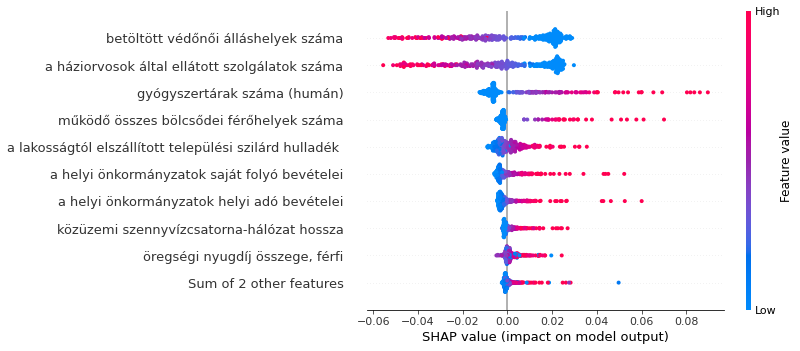

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

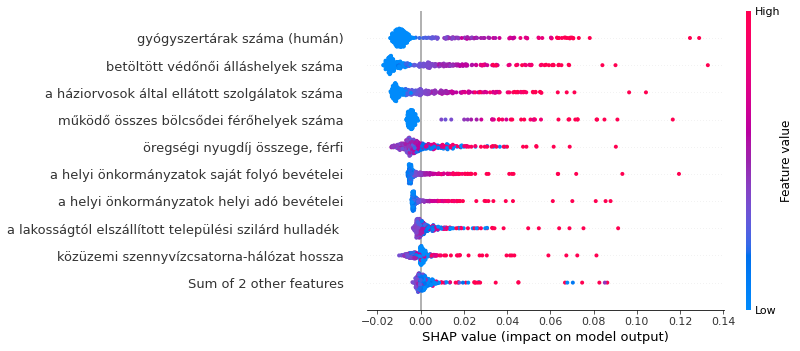

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

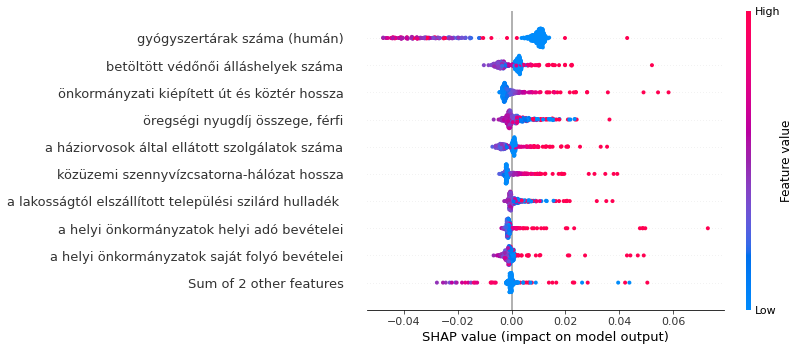

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

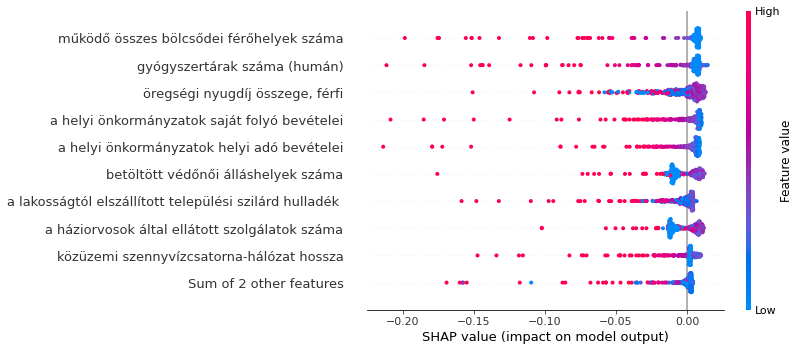

In [ ]:
osztaly = 3
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

##### Térképfájlba írás

In [ ]:
telepulesek=[]
for i in data_onkorm_clus.index.values.tolist():
  telepulesek.append(i[0])
telepulesek[:5]

['Aba', 'Abaliget', 'Abasár', 'Abaújalpár', 'Abaújkér']

In [ ]:
X = data_onkorm_clus_scaled.iloc[:, :]
X['klaszter'] = onkorm_pca['klaszter']
X['name'] = telepulesek
X.head()

label,a helyi önkormányzatok helyi adó bevételei,a helyi önkormányzatok saját folyó bevételei,a helyi önkormányzatoknak átengedett gépjárműadó,a háziorvosok által ellátott szolgálatok száma,a lakosságtól elszállított települési szilárd hulladék,betöltött védőnői álláshelyek száma,gyógyszertárak száma (humán),közüzemi szennyvízcsatorna-hálózat hossza,működő összes bölcsődei férőhelyek száma,önkormányzati kiépített út és köztér hossza,"öregségi nyugdíj összege, férfi",klaszter,name
0,-0.282170,-0.153890,-0.204826,-0.088341,-0.561468,0.062889,0.376601,-0.119234,-0.266937,-0.533468,-0.598736,1,Aba
1,-0.092701,-0.232214,-0.143000,1.951830,-0.310304,2.428609,-0.487834,-0.687624,-0.266937,0.510039,-0.255829,3,Abaliget
2,0.369453,1.050002,0.234512,0.499151,0.049616,0.744127,1.123801,0.062992,-0.266937,-0.376550,1.822304,0,Abasár
3,-0.365498,-0.387054,-0.024176,-0.768010,1.224148,-0.725234,-0.487834,-0.687624,-0.266937,4.452988,-0.423222,1,Abaújalpár
4,-0.450252,-0.273963,-0.343885,1.510880,0.154245,1.917298,-0.487834,0.582893,-0.266937,0.860019,-0.472078,3,Abaújkér


In [ ]:
X_geo = X.merge(geoname, on='name')
X_geo.head()

,a helyi önkormányzatok helyi adó bevételei,a helyi önkormányzatok saját folyó bevételei,a helyi önkormányzatoknak átengedett gépjárműadó,a háziorvosok által ellátott szolgálatok száma,a lakosságtól elszállított települési szilárd hulladék,betöltött védőnői álláshelyek száma,gyógyszertárak száma (humán),közüzemi szennyvízcsatorna-hálózat hossza,működő összes bölcsődei férőhelyek száma,önkormányzati kiépített út és köztér hossza,"öregségi nyugdíj összege, férfi",klaszter,name,geonameid,geoid,wgs84_e_szelesseg,wgs84_k_hosszusag
0,-0.282170,-0.153890,-0.204826,-0.088341,-0.561468,0.062889,0.376601,-0.119234,-0.266937,-0.533468,-0.598736,1,Aba,9692,1512,47.034356,18.524755
1,-0.092701,-0.232214,-0.143000,1.951830,-0.310304,2.428609,-0.487834,-0.687624,-0.266937,0.510039,-0.255829,3,Abaliget,16239,1035,46.143846,18.118111
2,0.369453,1.050002,0.234512,0.499151,0.049616,0.744127,1.123801,0.062992,-0.266937,-0.376550,1.822304,0,Abasár,10360,2209,47.800687,20.008398
3,-0.365498,-0.387054,-0.024176,-0.768010,1.224148,-0.725234,-0.487834,-0.687624,-0.266937,4.452988,-0.423222,1,Abaújalpár,17191,1341,48.306147,21.234097
4,-0.450252,-0.273963,-0.343885,1.510880,0.154245,1.917298,-0.487834,0.582893,-0.266937,0.860019,-0.472078,3,Abaújkér,10500,2420,48.305038,21.200221


In [ ]:
file_old = '/content/drive/My Drive/Temalabor1/momap.geojson'
file_new = '/content/drive/My Drive/Diplomamunka/klaszter4_2010_onkorm.geojson'

import json
with open(file_old, 'r') as f:
    data = json.load(f)

for feature in data['features']:
    geoid2 = feature['properties']['geoid']
    if len(X_geo[X_geo['geoid'] == geoid2]['klaszter']) == 0:
      del feature
    else:
      feature['properties']['klaszter'] = X_geo[X_geo.geoid == geoid2]['klaszter'].item()
      feature['properties']['varos'] = str(X_geo[X_geo.geoid == geoid2]['name'].item())

with open(file_new, 'w+') as f:
    json.dump(data, f, indent=2)

## Vállalkozói dimenzió

In [ ]:
vall_dim = ['TAAO032','TAAP003','TAAP011','TAAP041','TAAP050','TAAP076','TAAP801','TAAR127', 'TAAA101', 'TAAP044', 'TAAP079', 'TAAP268', 'TAAP272']
datatype_vall = datatype[datatype['kshkod'].isin(vall_dim)]
data_vall = merge_temp.merge(datatype_vall, on='datatypeid')

In [ ]:
year=2010

pd.options.mode.chained_assignment = None  # default='warn'
data_vall_clus = data_vall[data_vall.year==year]

data_vall_clus['ind']=list(map(lambda x,y,z,w: (x,y,z,w), data_vall_clus['name'],data_vall_clus['geoid'],data_vall_clus['wgs84_e_szelesseg'],data_vall_clus['wgs84_k_hosszusag'] ))
data_vall_clus = data_vall_clus[['ind', 'value', 'label']]
data_vall_clus = pd.crosstab(data_vall_clus.ind, data_vall_clus.label, values=data_vall_clus.value, aggfunc=lambda x: x)

for i in range(len(data_vall_clus)):
  data_vall_clus.iloc[i]=data_vall_clus.iloc[i]/data_vall_clus.iloc[i]['lakónépesség száma az év végén']

data_vall_clus=data_vall_clus.drop(['lakónépesség száma az év végén'], axis=1)
data_vall_clus=data_vall_clus.fillna(0)

In [ ]:
data_vall_clus.head()

label,egyéni gazdaságok száma,korlátolt felelősségű társaságok száma,"működő társas vállalkozások száma összesen (megszűnő és átalakulásra kötelezett gazdálkodási formákkal együtt, az év során, vállalkozási demográfia szerint)","regisztrált vállalkozások száma a feldolgozóipar nemzetgazdasági ágban (TEÁOR ''08: C gazdasági ág, az év végén)",regisztrált gazdasági szervezetek száma,regisztrált mezőgazdasági szövetkezetek száma,regisztrált szövetkezetek száma,regisztrált vállalkozások száma,"regisztrált vállalkozások száma a kereskedelem, gépjárműjavítás nemzetgazdasági ágban (TEÁOR ''08: G gazdasági ág, az év végén)",tehergépkocsik száma
ind,,,,,,,,,,
"(Aba, 1512, 47.0343556977497, 18.524754962635)",0.090715,0.014549,0.012837,0.003851,0.112323,0.000214,0.000428,0.105263,0.011981,0.026744
"(Abaliget, 1035, 46.143846193037206, 18.118110841590898)",0.056507,0.029110,0.032534,0.001712,0.188356,0.000000,0.000000,0.159247,0.018836,0.035959
"(Abasár, 2209, 47.800687144764396, 20.0083983387857)",0.122058,0.023135,0.021540,0.011966,0.264858,0.001197,0.001197,0.254487,0.015158,0.049462
"(Abaújalpár, 1341, 48.3061466428872, 21.234096519055)",0.293333,0.066667,0.093333,0.013333,0.213333,0.000000,0.000000,0.186667,0.000000,0.013333
"(Abaújkér, 2420, 48.3050378371762, 21.2002207816169)",0.124821,0.011478,0.010043,0.001435,0.119082,0.000000,0.000000,0.096126,0.010043,0.027260


In [ ]:
features = list(data_vall_clus.columns)

In [ ]:
scaler = StandardScaler()
data_vall_clus_scaled = pd.DataFrame(scaler.fit_transform(data_vall_clus), columns=data_vall_clus.columns)
data_vall_clus_scaled.head()

label,egyéni gazdaságok száma,korlátolt felelősségű társaságok száma,"működő társas vállalkozások száma összesen (megszűnő és átalakulásra kötelezett gazdálkodási formákkal együtt, az év során, vállalkozási demográfia szerint)","regisztrált vállalkozások száma a feldolgozóipar nemzetgazdasági ágban (TEÁOR ''08: C gazdasági ág, az év végén)",regisztrált gazdasági szervezetek száma,regisztrált mezőgazdasági szövetkezetek száma,regisztrált szövetkezetek száma,regisztrált vállalkozások száma,"regisztrált vállalkozások száma a kereskedelem, gépjárműjavítás nemzetgazdasági ágban (TEÁOR ''08: G gazdasági ág, az év végén)",tehergépkocsik száma
0,-0.496305,-0.095280,-0.243677,-0.193421,-0.600352,-0.024203,-0.047180,-0.558766,0.097440,-0.237407
1,-0.912679,0.550167,0.604926,-0.462395,0.290610,-0.200963,-0.329537,0.106958,0.818426,-0.019922
2,-0.114794,0.285341,0.131256,0.827182,1.187073,0.787683,0.460094,1.281470,0.431549,0.298749
3,1.969950,2.214961,3.224288,0.999078,0.583296,-0.200963,-0.329537,0.445103,-1.162801,-0.553900
4,-0.081170,-0.231400,-0.364046,-0.497307,-0.521157,-0.200963,-0.329537,-0.671443,-0.106422,-0.225229


In [ ]:
X = data_vall_clus_scaled.iloc[:, :]
X = X.values

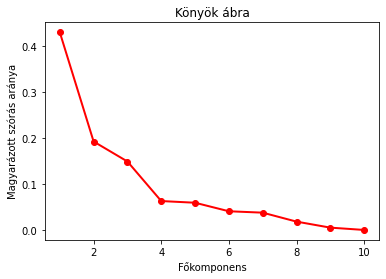

In [ ]:
pca = PCA(n_components=10)
principalComponents=pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Könyök ábra')
plt.xlabel('Főkomponens')
plt.ylabel('Magyarázott szórás aránya')
plt.show()

In [ ]:
out_sum = np.cumsum(pca.explained_variance_ratio_)  
print ("Magyarázott szórásarányok összegezve: ", out_sum)

Magyarázott szórásarányok összegezve:  [0.43014815 0.62290416 0.77226695 0.83571203 0.89547623 0.93673199
 0.97494124 0.99368526 0.99934932 1.        ]


#### 4 főkomponens

In [ ]:
X = data_vall_clus_scaled.iloc[:, :]
X = X.values

In [ ]:
pca = PCA(n_components=4)

principalComponents = pca.fit_transform(X)

In [ ]:
vall_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4'])
vall_pca.head()

,PC1,PC2,PC3,PC4
0,-0.697041,-0.413628,0.604447,0.032589
1,0.741699,-0.752373,0.436431,0.411657
2,1.626653,1.101520,-0.165596,-0.649583
3,2.433625,-0.050154,-0.877066,-0.321873
4,-0.982157,-0.480258,0.111497,0.311159


In [ ]:
print('Az egyes komponensek által megmagyarázott szórás:', pca.explained_variance_ratio_)
print('\n Teljes megmagyarázott szórás:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Az egyes komponensek által megmagyarázott szórás: [0.43014815 0.192756   0.14936279 0.06344508]

 Teljes megmagyarázott szórás: 83.57


In [ ]:
X = vall_pca.iloc[:, :]

For n_clusters = 2 The average silhouette_score is : 0.9495036574434493
For n_clusters = 3 The average silhouette_score is : 0.40561289039652565
For n_clusters = 4 The average silhouette_score is : 0.4008482557786524
For n_clusters = 5 The average silhouette_score is : 0.3598842462552493
For n_clusters = 6 The average silhouette_score is : 0.33521325605451147
For n_clusters = 7 The average silhouette_score is : 0.3476656157807536
For n_clusters = 8 The average silhouette_score is : 0.3078259380545565
For n_clusters = 9 The average silhouette_score is : 0.283824682014286
For n_clusters = 10 The average silhouette_score is : 0.2790920925017535


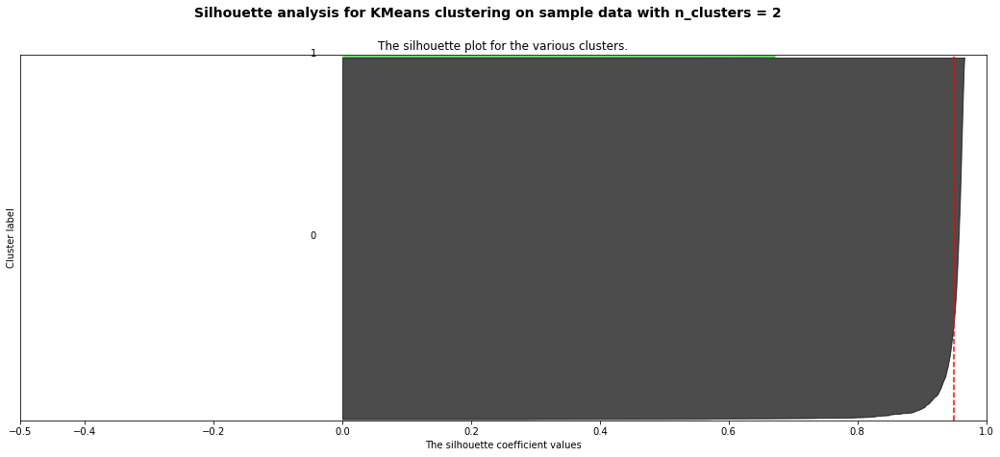

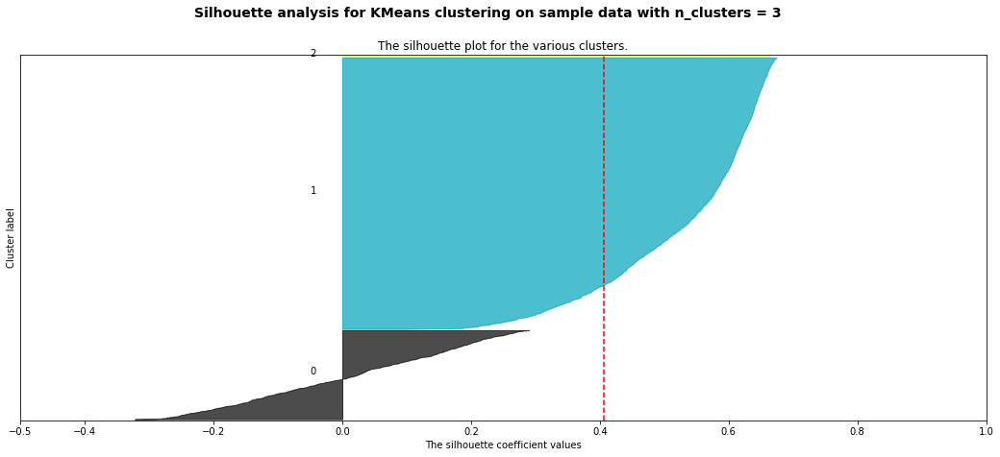

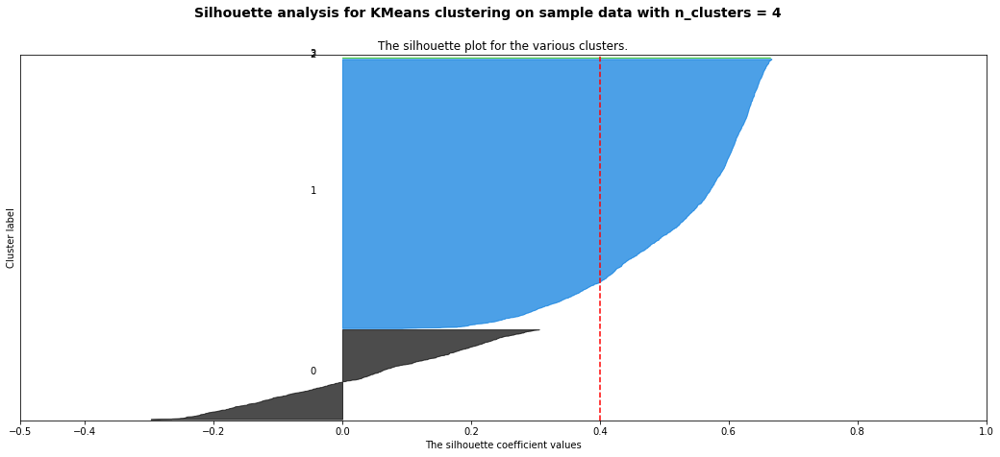

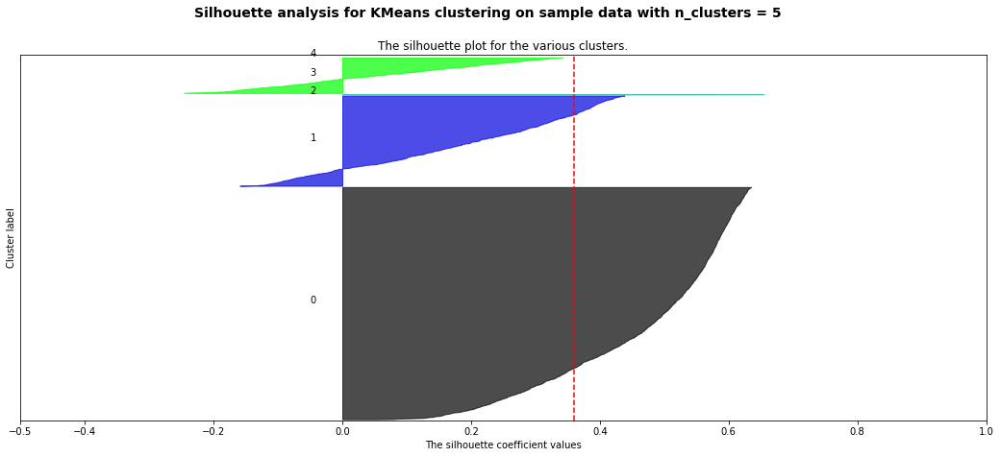

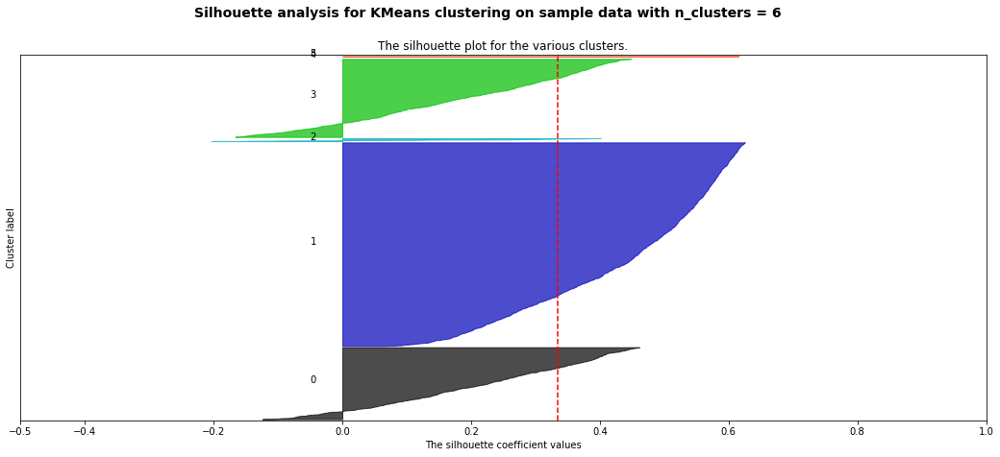

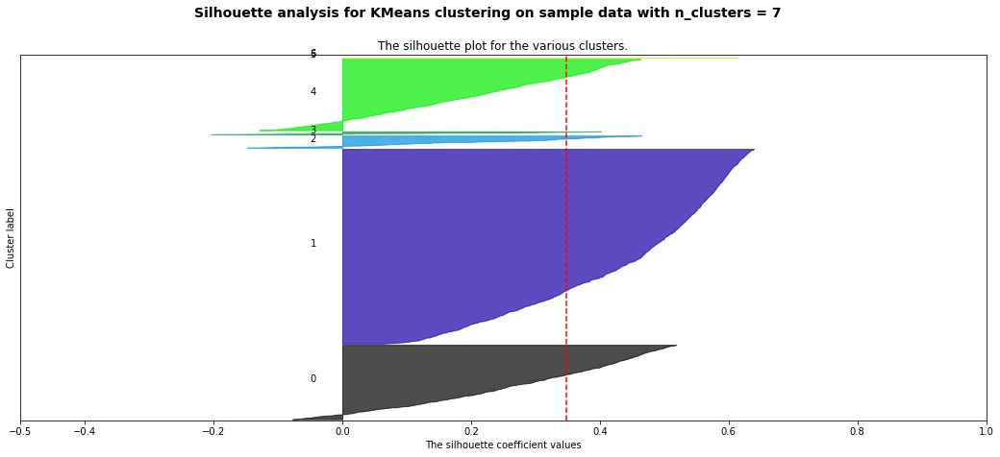

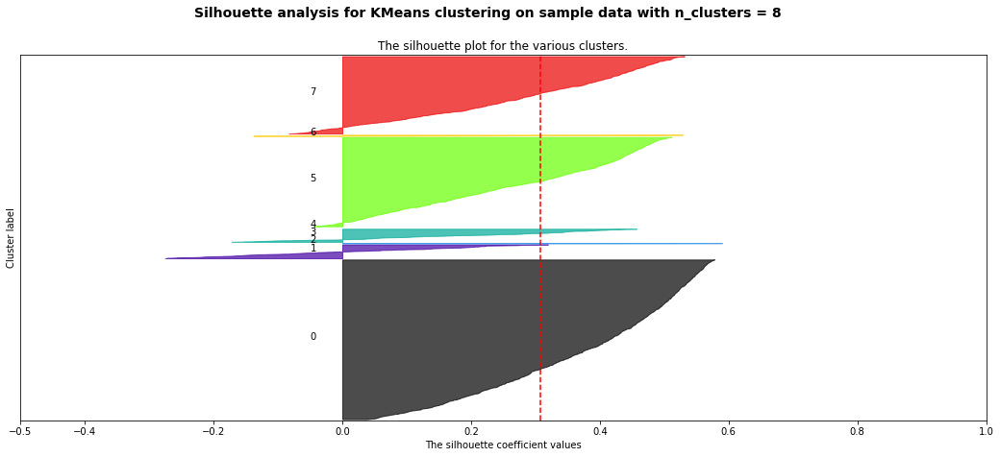

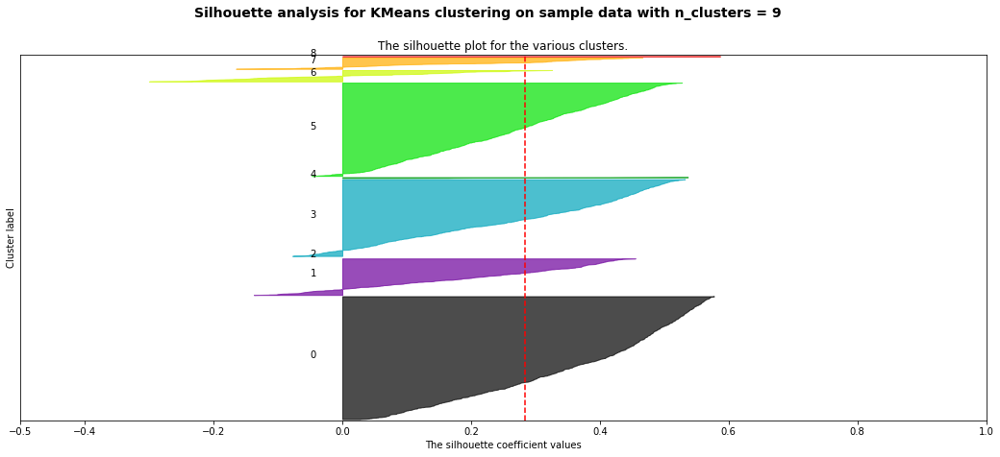

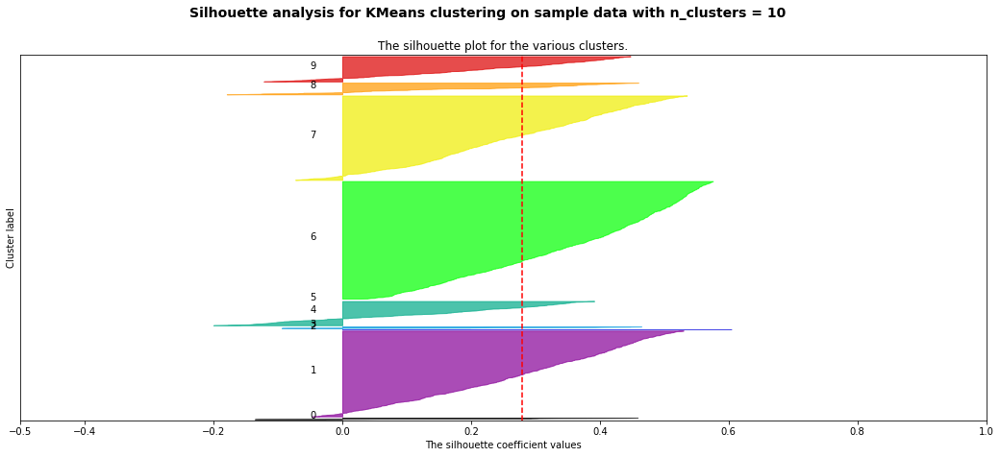

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.5, 1]
    ax1.set_xlim([-0.5, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.5, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

##### K=3

In [ ]:
K=3


KMC=KMeans(n_clusters=K)
KMC.fit(vall_pca)
vall_pca['klaszter']=KMC.labels_

In [ ]:
X = data_vall_clus_scaled.iloc[:, :]
X = X.to_numpy()
y = vall_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/315 [00:00<?, ?it/s]

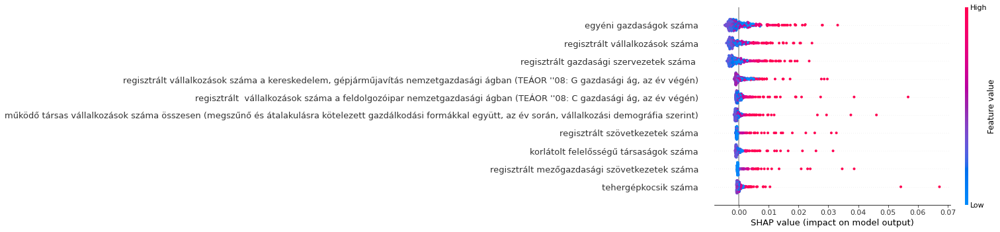

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

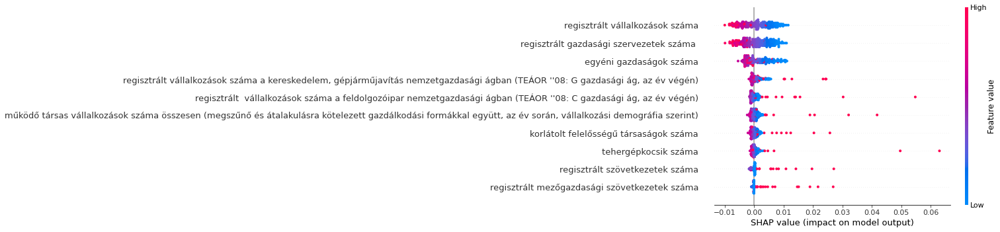

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

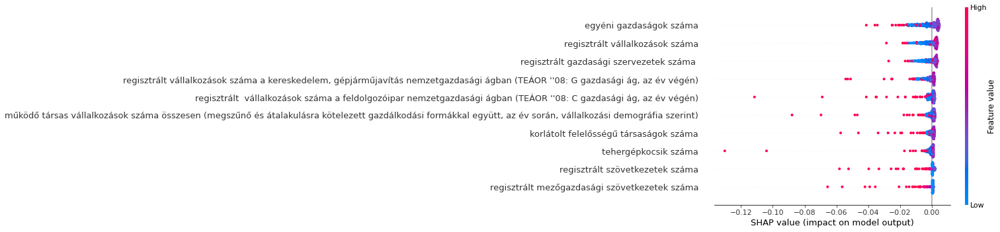

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

##### Térképfájlba írás

In [ ]:
telepulesek=[]
for i in data_vall_clus.index.values.tolist():
  telepulesek.append(i[0])
telepulesek[:5]

['Aba', 'Abaliget', 'Abasár', 'Abaújalpár', 'Abaújkér']

In [ ]:
X = data_vall_clus_scaled.iloc[:, :]
X['klaszter'] = vall_pca['klaszter']
X['name'] = telepulesek
X.head()

label,egyéni gazdaságok száma,korlátolt felelősségű társaságok száma,"működő társas vállalkozások száma összesen (megszűnő és átalakulásra kötelezett gazdálkodási formákkal együtt, az év során, vállalkozási demográfia szerint)","regisztrált vállalkozások száma a feldolgozóipar nemzetgazdasági ágban (TEÁOR ''08: C gazdasági ág, az év végén)",regisztrált gazdasági szervezetek száma,regisztrált mezőgazdasági szövetkezetek száma,regisztrált szövetkezetek száma,regisztrált vállalkozások száma,"regisztrált vállalkozások száma a kereskedelem, gépjárműjavítás nemzetgazdasági ágban (TEÁOR ''08: G gazdasági ág, az év végén)",tehergépkocsik száma,klaszter,name
0,-0.496305,-0.095280,-0.243677,-0.193421,-0.600352,-0.024203,-0.047180,-0.558766,0.097440,-0.237407,0,Aba
1,-0.912679,0.550167,0.604926,-0.462395,0.290610,-0.200963,-0.329537,0.106958,0.818426,-0.019922,0,Abaliget
2,-0.114794,0.285341,0.131256,0.827182,1.187073,0.787683,0.460094,1.281470,0.431549,0.298749,1,Abasár
3,1.969950,2.214961,3.224288,0.999078,0.583296,-0.200963,-0.329537,0.445103,-1.162801,-0.553900,1,Abaújalpár
4,-0.081170,-0.231400,-0.364046,-0.497307,-0.521157,-0.200963,-0.329537,-0.671443,-0.106422,-0.225229,0,Abaújkér


In [ ]:
X_geo = X.merge(geoname, on='name')
X_geo.head()

,egyéni gazdaságok száma,korlátolt felelősségű társaságok száma,"működő társas vállalkozások száma összesen (megszűnő és átalakulásra kötelezett gazdálkodási formákkal együtt, az év során, vállalkozási demográfia szerint)","regisztrált vállalkozások száma a feldolgozóipar nemzetgazdasági ágban (TEÁOR ''08: C gazdasági ág, az év végén)",regisztrált gazdasági szervezetek száma,regisztrált mezőgazdasági szövetkezetek száma,regisztrált szövetkezetek száma,regisztrált vállalkozások száma,"regisztrált vállalkozások száma a kereskedelem, gépjárműjavítás nemzetgazdasági ágban (TEÁOR ''08: G gazdasági ág, az év végén)",tehergépkocsik száma,klaszter,name,geonameid,geoid,wgs84_e_szelesseg,wgs84_k_hosszusag
0,-0.496305,-0.095280,-0.243677,-0.193421,-0.600352,-0.024203,-0.047180,-0.558766,0.097440,-0.237407,0,Aba,9692,1512,47.034356,18.524755
1,-0.912679,0.550167,0.604926,-0.462395,0.290610,-0.200963,-0.329537,0.106958,0.818426,-0.019922,0,Abaliget,16239,1035,46.143846,18.118111
2,-0.114794,0.285341,0.131256,0.827182,1.187073,0.787683,0.460094,1.281470,0.431549,0.298749,1,Abasár,10360,2209,47.800687,20.008398
3,1.969950,2.214961,3.224288,0.999078,0.583296,-0.200963,-0.329537,0.445103,-1.162801,-0.553900,1,Abaújalpár,17191,1341,48.306147,21.234097
4,-0.081170,-0.231400,-0.364046,-0.497307,-0.521157,-0.200963,-0.329537,-0.671443,-0.106422,-0.225229,0,Abaújkér,10500,2420,48.305038,21.200221


In [ ]:
file_old = '/content/drive/My Drive/Temalabor1/momap.geojson'
file_new = '/content/drive/My Drive/Diplomamunka/klaszter3_2010_vall.geojson'

import json
with open(file_old, 'r') as f:
    data = json.load(f)

for feature in data['features']:
    geoid2 = feature['properties']['geoid']
    if len(X_geo[X_geo['geoid'] == geoid2]['klaszter']) == 0:
      del feature
    else:
      feature['properties']['klaszter'] = X_geo[X_geo.geoid == geoid2]['klaszter'].item()
      feature['properties']['varos'] = str(X_geo[X_geo.geoid == geoid2]['name'].item())

with open(file_new, 'w+') as f:
    json.dump(data, f, indent=2)

# Boros adathalmazzal

In [ ]:
from sklearn.datasets import load_wine
data = load_wine()
y = load_wine(return_X_y=True)[1]
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = y
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [ ]:
scaler = StandardScaler()
df = df.iloc[:, :-1]
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df_scaled.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,1.530639,-0.555697,0.240360,-1.165295,1.907413,0.804860,1.029462,-0.653435,1.219675,0.263503,0.354908,1.845346,1.007815
1,0.254862,-0.492589,-0.822317,-2.491321,0.016617,0.565082,0.727732,-0.815308,-0.545841,-0.284998,0.398948,1.108680,0.960135
2,0.205317,0.030306,1.119817,-0.261187,0.086647,0.804860,1.210500,-0.491563,2.128653,0.280916,0.310868,0.782847,1.389261
3,1.704046,-0.339327,0.496868,-0.803652,0.927001,2.483307,1.461942,-0.977181,1.027391,1.203792,-0.437813,1.179514,2.326983
4,0.304406,0.237661,1.852697,0.462100,1.277148,0.804860,0.657328,0.236865,0.398098,-0.311118,0.354908,0.442848,-0.041162


In [ ]:
X = df_scaled.values

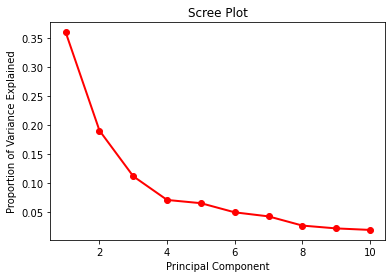

In [ ]:
pca = PCA(n_components=10)
principalComponents=pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

In [ ]:
out_sum = np.cumsum(pca.explained_variance_ratio_)  
print ("Cumulative Prop. Variance Explained: ", out_sum)

Cumulative Prop. Variance Explained:  [0.36049743 0.55132723 0.66332428 0.73451031 0.80012796 0.84996601
 0.89281379]


## 6 főkomponens

In [ ]:
X = df_scaled.values

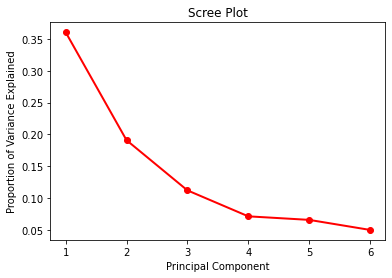

In [ ]:
pca = PCA(n_components=6)
principalComponents=pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

In [ ]:
bor_pca = pd.DataFrame(data = principalComponents, 
                  columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])
bor_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,3.326639,-1.401222,-0.149364,-0.160096,0.696575,-0.241925
1,2.179782,0.321921,-2.035605,-0.309297,-0.224134,-0.932602
2,2.521048,-0.981753,0.990002,0.707146,-0.319623,0.555879
3,3.789670,-2.704070,-0.149801,0.549211,-0.360231,0.138029
4,1.014268,-0.832018,2.050489,-0.364053,0.299483,-0.414353


For n_clusters = 2 The average silhouette_score is : 0.25839518215223867
For n_clusters = 3 The average silhouette_score is : 0.283578774071771
For n_clusters = 4 The average silhouette_score is : 0.2637842221594709
For n_clusters = 5 The average silhouette_score is : 0.17624955295486422
For n_clusters = 6 The average silhouette_score is : 0.18718810827810672


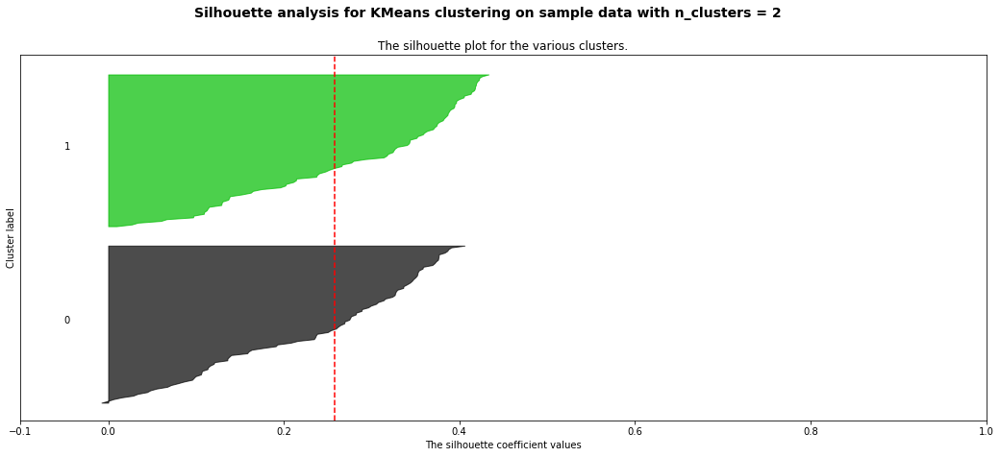

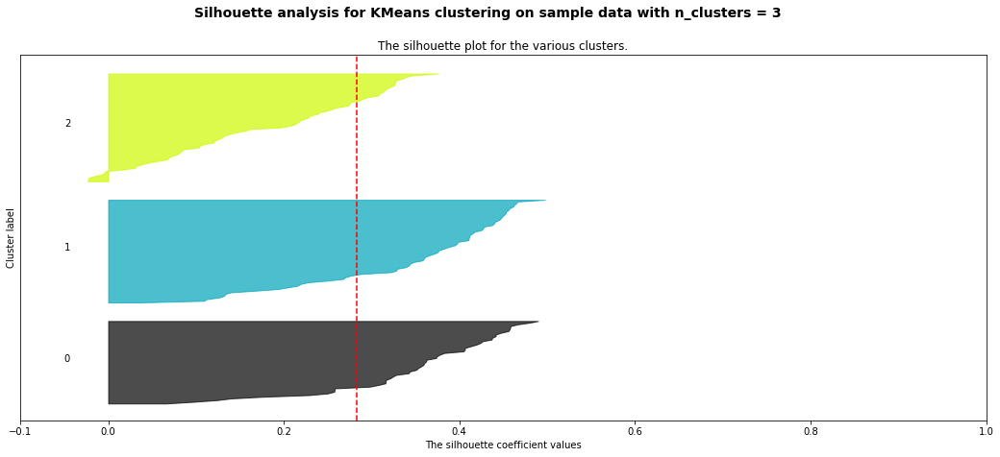

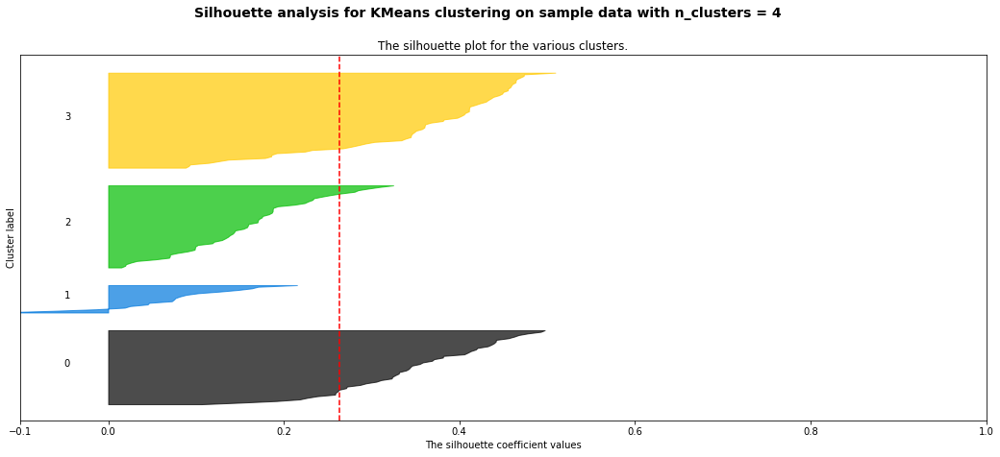

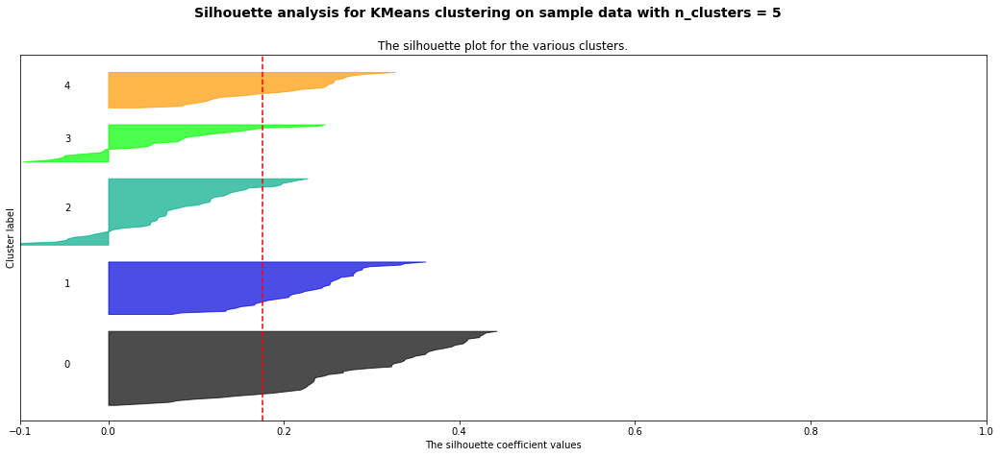

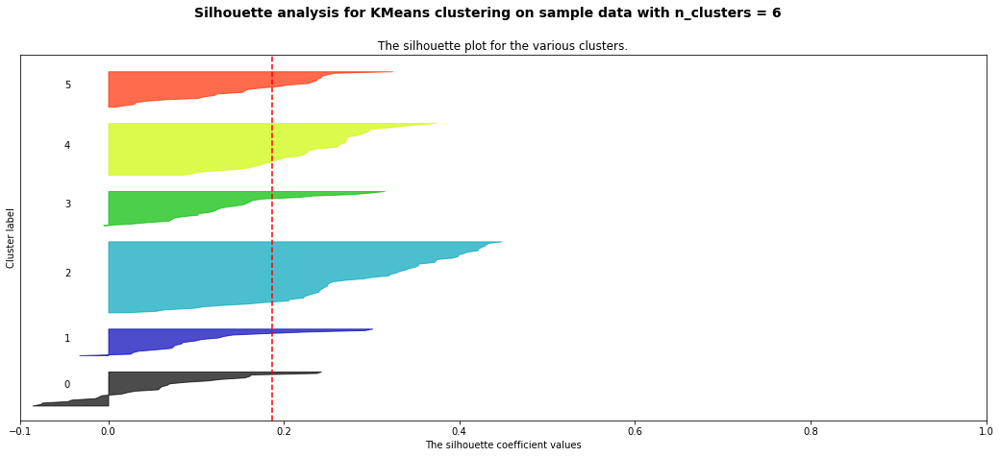

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

### K=3

In [ ]:
K=3


KMC=KMeans(n_clusters=K)
KMC.fit(bor_pca)
bor_pca['klaszter']=KMC.labels_

In [ ]:
X = df_scaled.to_numpy()
y = bor_pca['klaszter']

In [ ]:
clusterShapley = dre.ClusterShapley()
clusterShapley.fit(X, y)

to_explain = np.array(random.sample(X.tolist(), int(X.shape[0] * 0.1)))

shap_values = clusterShapley.transform(to_explain)

Preprocessing data...
Creating summary of the background dataset...
Computing explanations...


  0%|          | 0/17 [00:00<?, ?it/s]

In [ ]:
features = list(df_scaled.columns)

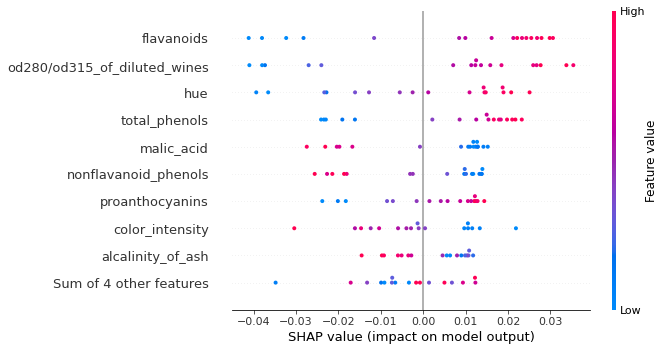

In [ ]:
osztaly = 0
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

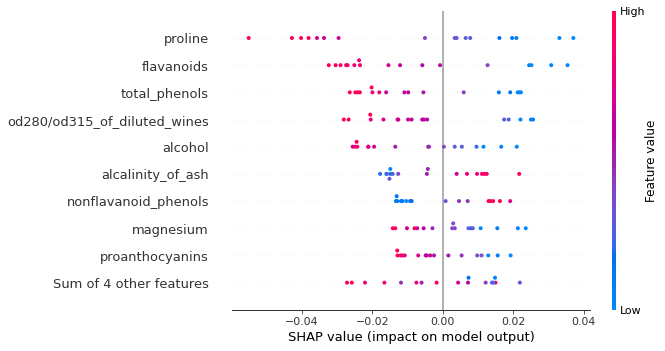

In [ ]:
osztaly = 1
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)

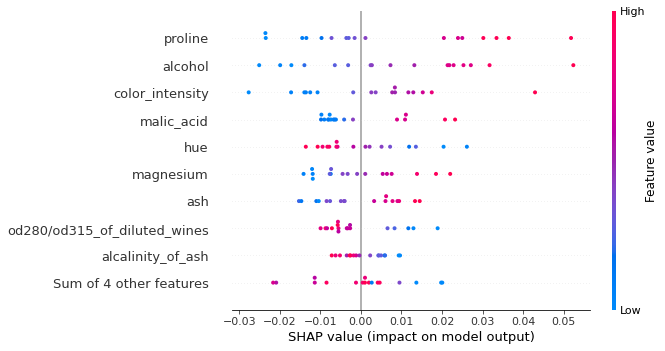

In [ ]:
osztaly = 2
c_exp = shap.Explanation(shap_values[osztaly], data=to_explain, feature_names=features)
shap.plots.beeswarm(c_exp)